# 2024 Fantasy Football Prediction Model

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from google.colab import files

In [2]:
# Start by working with df with all the statistical data

df = pd.read_csv('ffball_project_data_2.csv')
df = df.sort_values(['player_id','season'])
df.head()

,player_id,player_name,position,recent_team,season,games_played,injured,injury type,injury severity,season ending,...,receiving_epa,receiving_2pt_conversions,racr,target_share,air_yards_share,wopr,special_teams_tds,fantasy_points,fantasy_points_ppr,max_fantasy_points
0,00-0000104,Troy Aikman,QB,DAL,1999,14.0,1.0,concussion,minor,no,...,NaN,0.0,NaN,NaN,NaN,NaN,0.0,167.80,167.80,167.8
1,00-0000104,Troy Aikman,QB,DAL,2000,11.0,1.0,concussion,mild,no,...,NaN,0.0,NaN,NaN,NaN,NaN,0.0,63.94,63.94,167.8
2,00-0000145,Derrick Alexander,WR,KC,1999,16.0,0.0,NaN,NaN,NaN,...,22.726649,0.0,0.0,0.216717,NaN,NaN,0.0,109.40,163.40,257.0
3,00-0000145,Derrick Alexander,WR,KC,2000,15.0,0.0,NaN,NaN,NaN,...,36.469097,0.0,0.0,0.253858,NaN,NaN,0.0,185.00,257.00,257.0
4,00-0000145,Derrick Alexander,WR,KC,2001,13.0,1.0,achilles,mild,no,...,2.118593,0.0,0.0,0.163619,NaN,NaN,0.0,66.60,93.60,257.0


# Data Preprocessing

## Creating New Variables

In [3]:
# Combine all different fumble types

df['fumbles'] = df['sack_fumbles'] + df['receiving_fumbles'] + df['rushing_fumbles']
df['fumbles_lost'] = df['sack_fumbles_lost'] + df['receiving_fumbles_lost'] + df['rushing_fumbles_lost']
df.drop(columns = ['sack_fumbles','receiving_fumbles','rushing_fumbles',
                   'sack_fumbles_lost','receiving_fumbles_lost','rushing_fumbles_lost'],inplace=True)

In [4]:
# Create a rookie year for all players
rookie_df = df.groupby(['player_id', 'player_name', 'position','recent_team']).season.min().reset_index()
rookie_df = rookie_df.loc[rookie_df.groupby('player_id')['season'].idxmin()]

# Subtract 1 from the minimum season to denote the rookie year
rookie_df['season'] -= 1

# Set all other columns to 0
for col in df.columns:
    if col not in ['player_id', 'player_name', 'position', 'season','recent_team']:
        rookie_df[col] = 0

rookie_df.head()

,player_id,player_name,position,recent_team,season,games_played,injured,injury type,injury severity,season ending,...,racr,target_share,air_yards_share,wopr,special_teams_tds,fantasy_points,fantasy_points_ppr,max_fantasy_points,fumbles,fumbles_lost
0,00-0000104,Troy Aikman,QB,DAL,1998,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,00-0000145,Derrick Alexander,WR,KC,1998,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,00-0000166,Stephen Alexander,TE,WAS,1998,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,00-0000210,James Allen,RB,CHI,1998,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,00-0000232,Terry Allen,RB,NE,1998,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [5]:
df = pd.concat([df, rookie_df], ignore_index=True).sort_values(by=['player_id', 'season'])

In [6]:
# Find future team for each player to help with creating new variables
df['next_team'] = df.groupby('player_id')['recent_team'].shift(-1)

# Create variable if player goes to new team
id_list = df['player_id'].to_list()
team_list = df['next_team'].to_list()

new_team = []
for i in range(len(id_list)):
    if id_list[i-1] == id_list[i]:
        if team_list[i-1] != team_list[i]:
            new_team.append(1)
        else:
            new_team.append(0)
    else:
        new_team.append(0)

df['new_team'] = new_team

In [7]:
# Create variable for if a player has a qb on their team who threw for 4000 yards the previous year

qb_passing_yards_df = df[df['passing_yards']> 4000]
qb_passing_yards_df = qb_passing_yards_df[['player_id','player_name','position','next_team','season','passing_yards']]
qb_passing_yards_df['qb_with_4000+_passing'] = 1
temp_df = qb_passing_yards_df[['player_id','season']]

id_4000 = temp_df['player_id'].to_list()
season_4000 = temp_df['season'].to_list()

list_of_tuples = list(zip(id_4000, season_4000))
#print(list_of_tuples)
tuples_of_tuples = tuple(list_of_tuples)

def find_teams(df, tuples_of_tuples):
    teams = []
    for player_id, season in tuples_of_tuples:
        team = df[(df['player_id'] == player_id) & (df['season'] == season)]['next_team'].values
        if len(team) > 0:
            teams.append((player_id, season, team[0]))
        else:
            teams.append((player_id, season, 'Team Not Found'))
    return teams

# Use the function
teams_list = find_teams(df, tuples_of_tuples)

filtered_tuples = [(season, team) for player_id, season, team in teams_list if team != "Team Not Found"]

df['QB_4000_yards'] = 0

# Iterate through each row in the DataFrame
for index, row in df.iterrows():
    # Check if the (season, team) pair is in your list of tuples and position is not 'QB'
    if (row['season'], row['next_team']) in filtered_tuples and row['position'] != 'QB':
        # Update the "QB_4000_yards" column to 1 for rows that meet the criteria
        df.at[index, 'QB_4000_yards'] = 1

In [8]:
# Create variable for if a player has a wr on their team who had 1000 yards the previous year

receiving_yards_df = df[df['receiving_yards']> 1000]
receiving_yards_df = receiving_yards_df[['player_id','player_name','position','next_team','season','receiving_yards']]
temp_df = receiving_yards_df[['player_id','season']]
id_4000 = temp_df['player_id'].to_list()
season_4000 = temp_df['season'].to_list()

list_of_tuples = list(zip(id_4000, season_4000))
tuples_of_tuples = tuple(list_of_tuples)

def find_teams(df, tuples_of_tuples):
    teams = []
    for player_id, season in tuples_of_tuples:
        team = df[(df['player_id'] == player_id) & (df['season'] == season)]['next_team'].values
        if len(team) > 0:
            teams.append((player_id, season, team[0]))
        else:
            teams.append((player_id, season, 'Team Not Found'))
    return teams

# Use the function
teams_list = find_teams(df, tuples_of_tuples)

filtered_tuples = [(season, team) for player_id, season, team in teams_list if team != "Team Not Found"]

df['Receiving_1000_yards'] = 0

# Iterate through each row in the DataFrame
for index, row in df.iterrows():
    if (row['season'], row['next_team']) in filtered_tuples and row['position'] in ('QB', 'RB'):
        df.at[index, 'Receiving_1000_yards'] +=1


In [9]:
# Create variable for if a player has a player on their team who had 1000 receiving yards the previous year

rushing_yards_df = df[df['rushing_yards']> 1000]
rushing_yards_df = rushing_yards_df[['player_id','player_name','position','next_team','season','rushing_yards']]
temp_df = rushing_yards_df[['player_id','season']]
temp_df['season'] = temp_df['season']
id_4000 = temp_df['player_id'].to_list()
season_4000 = temp_df['season'].to_list()

list_of_tuples = list(zip(id_4000, season_4000))
tuples_of_tuples = tuple(list_of_tuples)

def find_teams(df, tuples_of_tuples):
    teams = []
    for player_id, season in tuples_of_tuples:
        team = df[(df['player_id'] == player_id) & (df['season'] == season)]['next_team'].values
        if len(team) > 0:
            teams.append((player_id, season, team[0]))
        else:
            teams.append((player_id, season, 'Team Not Found'))
    return teams

# Use the function
teams_list = find_teams(df, tuples_of_tuples)

filtered_tuples = [(season, team) for player_id, season, team in teams_list if team != "Team Not Found"]

df['rushing_1000_yards'] = 0

# Iterate through each row in the DataFrame
for index, row in df.iterrows():
    if (row['season'], row['next_team']) in filtered_tuples and row['position'] != 'RB':
        df.at[index, 'rushing_1000_yards'] +=1

<ipython-input-9-4536ee93c0a8>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['season'] = temp_df['season']


In [10]:
# Get rid of missing values for stat columns
numeric_cols = df.select_dtypes(include=['float', 'int']).columns
df[numeric_cols] = df[numeric_cols].fillna(0)

# fills na in injury columns
df['injury type'].fillna('no injury',inplace=True)
df['injury severity'].fillna('no injury',inplace=True)
df['season ending'].fillna('no injury',inplace=True)

In [11]:
# Group by player_id and season, and count the number of unique teams
player_team_counts = df.groupby(['player_id', 'season'])['recent_team'].count()

# Filter to find instances where a player has played for more than one team in the same season
multiple_teams = player_team_counts[player_team_counts > 1]

In [12]:
# Combine instances where player was on more than one team in a season
aggregations = {
    'recent_team': 'last',
    'next_team':'last',
    'games_played': 'sum',
    'injured': 'max',  # Assuming 1 is injured, 0 is not injured
    'injury type': 'last',  # Taking the first non-null injury type
    'injury severity': 'last',  # Taking the first non-null injury severity
    'season ending': 'last',  # Taking the first non-null season ending
    'max_fantasy_points': 'max',
    'new_team':'first',
    'QB_4000_yards':'first',
    'Receiving_1000_yards':'first',
    'rushing_1000_yards':'first',
    'racr':'mean',
    'target_share':'mean',
    'air_yards_share':'mean',
    'wopr':'mean'
}

# Automatically adding all numerical columns to aggregations, except those handled specifically above
for col in df.columns:
    if df[col].dtype in ['float64', 'int64'] and col not in aggregations and col != 'season':
        aggregations[col] = 'sum'

# Group by player_id, player_name, position, and season and aggregate according to the defined rules
df = df.groupby(['player_id', 'player_name', 'position', 'season']).agg(aggregations).reset_index()


In [13]:
# Create variable for if player changed teams midseason the year before
temp_df = pd.DataFrame(multiple_teams).reset_index()
temp_df['changed_teams_midseason'] = 1
temp_df.drop(columns=['recent_team'],inplace=True)
df = pd.merge(df, temp_df, on=['player_id','season'], how='left')
df['changed_teams_midseason'].fillna(0, inplace=True)

df.sort_values(['player_name', 'season'], inplace=True)

# Create a mask for players who changed teams midseason
mask = df['changed_teams_midseason'] == 1

# Apply the shift only to rows where 'changed_teams_midseason' is 1
df.loc[mask, 'recent_team'] = df.loc[mask].groupby('player_name')['recent_team'].shift(-1)

# Fill NaN values if needed
df['recent_team'] = df['recent_team'].fillna(method='ffill')

## Merging Datasets

In [14]:
# dataset containing categorical information on each player
df2 = pd.read_csv('player_info.csv',encoding='ISO-8859-1')

In [15]:
# Get rid of rows with no data

columns_except_name = df2.columns.drop('player_name')
rows_with_only_name = df2[df2[columns_except_name].isnull().all(axis=1)]

# Removing those rows from the dataset
cleaned_data = df2.drop(rows_with_only_name.index)


In [16]:
# Convert height to total inches: (feet * 12) + inches
cleaned_data['height_in_inches'] = df2['feet'].fillna(0) * 12 + df2['inches'].fillna(0)

# Dropping the original feet and inches columns
cleaned_data = cleaned_data.drop(columns=['feet', 'inches'])

In [17]:
import re

# Function to extract draft pick and year from info
def extract_draft_details_final_fix(draft_info):
    if pd.isna(draft_info):
        return None, None
    pick_match = re.search(r'\((\d+)(st|nd|rd|th) overall\)', draft_info)
    year_match = re.search(r'(\d{4}) NFL Draft', draft_info)
    pick = pick_match.group(1) if pick_match else None
    year = year_match.group(1) if year_match else None
    return pick, year

# Apply the function and update the columns
cleaned_data['draft_pick'], cleaned_data['draft_year'] = zip(*cleaned_data['draft_info'].apply(extract_draft_details_final_fix))

# Display the updated data to confirm correct extraction
cleaned_data[['player_name', 'draft_info', 'draft_pick', 'draft_year']].head()


,player_name,draft_info,draft_pick,draft_year
0,Jared Goff,Draft: Los Angeles Rams in the 1st round (1st ...,1,2016
1,Evan Engram,Draft: New York Giants in the 1st round (23rd ...,23,2017
2,Shane Matthews,NaN,None,None
3,Alec Pierce,Draft: Indianapolis Colts in the 2nd round (53...,53,2022
4,Jared Cook,Draft: Tennessee Titans in the 3rd round (89th...,89,2009


In [18]:
# dataset for info of players that have the same name
duplicate_df = pd.read_csv('duplicate_player_info.csv')

In [19]:
# Convert height to total inches: (feet * 12) + inches
duplicate_df['height_in_inches'] = duplicate_df['feet'].fillna(0) * 12 + duplicate_df['inches'].fillna(0)

# Dropping the original feet and inches columns
duplicate_df = duplicate_df.drop(columns=['feet', 'inches'])

# Apply the function and update the columns
duplicate_df['draft_pick'], duplicate_df['draft_year'] = zip(*duplicate_df['draft_info'].apply(extract_draft_details_final_fix))

# Display the updated data to confirm correct extraction
duplicate_df[['player_name', 'draft_info', 'draft_pick', 'draft_year']].head()


,player_name,draft_info,draft_pick,draft_year
0,Michael Pittman,Draft: Arizona Cardinals in the 4th round (95t...,95,1998
1,Michael Pittman,Draft: Indianapolis Colts in the 2nd round (34...,34,2020
2,Mike Williams,Draft: Detroit Lions in the 1st round (10th ov...,10,2005
3,Mike Williams,Draft: Tampa Bay Buccaneers in the 4th round (...,101,2010
4,Mike Williams,Draft: Los Angeles Chargers in the 1st round (...,7,2017


In [20]:
# dataset containing info of 2024 rookies
rookie_info_df = pd.read_csv('rookie_info_scrape.csv')

In [21]:
# Convert height to total inches: (feet * 12) + inches
rookie_info_df['height_in_inches'] = rookie_info_df['feet'].fillna(0) * 12 + rookie_info_df['inches'].fillna(0)

# Dropping the original feet and inches columns
rookie_info_df = rookie_info_df.drop(columns=['feet', 'inches'])

# Function to handle the variations of ordinal numbers in the draft pick extraction for rookie_info_scrape.csv
def extract_draft_details_rookie(draft_info):
    if pd.isna(draft_info):
        return None, None
    pick_match = re.search(r'(\d+)(st|nd|rd|th) overall', draft_info)
    year_match = re.search(r'(\d{4})', draft_info)
    pick = pick_match.group(1) if pick_match else None
    year = year_match.group(1) if year_match else None
    return pick, year

# Apply the function and update the columns
rookie_info_df['draft_pick'], rookie_info_df['draft_year'] = zip(*rookie_info_df['draft_info'].apply(extract_draft_details_rookie))

# Display the updated data to confirm correct extraction
rookie_info_df[['player_name', 'draft_info', 'draft_pick', 'draft_year']].head()

,player_name,draft_info,draft_pick,draft_year
0,Adonai Mitchell,"Draft: 2nd round, 52nd overall of the 2024 NFL...",52,2024
1,Audric Estime,"Draft: 5th round, 147th overall of the 2024 NF...",147,2024
2,Ben Sinnot,"Draft: 2nd round, 53rd overall of the 2024 NFL...",53,2024
3,Blake Corum,"Draft: 3rd round, 83rd overall of the 2024 NFL...",83,2024
4,Braelon Allen,"Draft: 4th round, 134th overall of the 2024 NF...",134,2024


In [22]:
# Add player info dfs to main df
merged_data = pd.merge(df, cleaned_data, on='player_name', how='inner')
merged_data2 = pd.merge(df, duplicate_df, on=['player_id','player_name'], how='inner')
merged_data3 = pd.merge(df, rookie_info_df, on='player_name', how='inner')

In [23]:
# Convert weight(lbs.) to string for both datasets if not merging on this, or to int if you are.
merged_data['weight(lbs.)'] = merged_data['weight(lbs.)'].astype(str)
merged_data2['weight(lbs.)'] = merged_data2['weight(lbs.)'].astype(str)
merged_data3['weight(lbs.)'] = merged_data3['weight'].astype(str)
merged_data3.drop(columns=['weight'],inplace=True)

# Convert height_in_inches to float for both datasets if they're used in merging or comparisons.
merged_data['height_in_inches'] = merged_data['height_in_inches'].astype(float)
merged_data2['height_in_inches'] = merged_data2['height_in_inches'].astype(float)
merged_data3['height_in_inches'] = merged_data3['height_in_inches'].astype(float)

merged_data = pd.merge(merged_data, merged_data2, how='outer')
merged_data = pd.merge(merged_data, merged_data3, how='outer')

In [24]:
# Check to make sure same number of rows as original dataset
print(merged_data.shape)
print(df.shape)

(10540, 66)
(10540, 55)


In [25]:
# Dataset with information on head coach and regular season record
coach_data = pd.read_excel('NFL Coach Data.xlsx')

In [26]:
coach_data.head()

,coach_name,recent_team,season,firstyearwithteam,years_coached,wins,loses,ties
0,VinceTobin,ARI,1998,0,2.0,9.0,7.0,0.0
1,VinceTobin,ARI,1999,0,3.0,6.0,10.0,0.0
2,VinceTobin,ARI,2000,0,4.0,3.0,13.0,0.0
3,DaveMcGinnis,ARI,2001,1,0.0,7.0,9.0,0.0
4,DaveMcGinnis,ARI,2002,0,1.0,5.0,11.0,0.0


In [27]:
coach_data['next_team'] = coach_data['recent_team']
coach_data.drop(columns=['recent_team'],inplace=True)
coach_data['season'] = coach_data['season'] - 1

# Apply shift so that record data is applied to right year
coach_data['wins'] = coach_data.groupby('next_team')['wins'].shift(1)
coach_data['loses'] = coach_data.groupby('next_team')['loses'].shift(1)
coach_data['ties'] = coach_data.groupby('next_team')['ties'].shift(1)

In [28]:
# Coach data merge
df = pd.merge(merged_data, coach_data , on=['next_team','season'], how='left')

In [29]:
# Fill missing data
df['wins'].fillna(df['wins'].mean(),inplace=True)
df['loses'].fillna(df['loses'].mean(),inplace=True)
df['ties'].fillna(df['ties'].mean(),inplace=True)
df['years_coached'].fillna(0,inplace=True)

In [30]:
# Add plus one to season to correct issue where season is a year behind
df['season'] += 1

In [31]:
# Datasets with info where each player was on depth chart to start the season
# depth_data has week 1 info and depth_data2 has week2 info
depth_data = pd.read_excel('depth_charts.xlsx')
depth_data2 = pd.read_excel('depth_charts2.xlsx')

depth_data.drop_duplicates(inplace=True)
depth_data2.drop_duplicates(inplace=True)

depth_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10980 entries, 0 to 11047
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   season          10980 non-null  int64  
 1   club_code       10946 non-null  object 
 2   depth_team      10945 non-null  float64
 3   player_id       10980 non-null  object 
 4   position        10980 non-null  object 
 5   depth_position  10980 non-null  object 
 6   player_name     10980 non-null  object 
dtypes: float64(1), int64(1), object(5)
memory usage: 686.2+ KB


In [32]:
depth_data.drop(columns=['player_name','club_code','depth_position'],inplace=True)
depth_data2.drop(columns=['player_name','club_code','depth_position'],inplace=True)

df = df.merge(depth_data, how = 'left', on = ['player_id', 'season','position'] )
df = df.merge(depth_data2, how = 'left', on = ['player_id', 'season','position'] )

# Look for situations where week 1 depth data is missing and can be replaced by week 2 data
df['depth_team_x'] = df['depth_team_x'].fillna(df['depth_team_y'])
df['depth_team'] = df['depth_team_x']
df.drop(columns=['depth_team_y','depth_team_x'],inplace=True)

# Fill 4 for missing depth team values
# Ordinal data so don't want to use 0
df['depth_team'].fillna(4,inplace=True)
df['depth_team'] = df['depth_team'].replace({
    0:4})

In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10565 entries, 0 to 10564
Data columns (total 73 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   player_id                    10565 non-null  object 
 1   player_name                  10565 non-null  object 
 2   position                     10565 non-null  object 
 3   season                       10565 non-null  int64  
 4   recent_team                  10565 non-null  object 
 5   next_team                    9175 non-null   object 
 6   games_played                 10565 non-null  float64
 7   injured                      10565 non-null  float64
 8   injury type                  10565 non-null  object 
 9   injury severity              10565 non-null  object 
 10  season ending                10565 non-null  object 
 11  max_fantasy_points           10565 non-null  float64
 12  new_team                     10565 non-null  int64  
 13  QB_4000_yards   

In [34]:
# Drop rows where the 'season' is 2025
df.drop(df[df['season'] == 2025].index, inplace=True)

df.drop(df[(df['coach_name'].isnull())&(df['season']==2024)].index, inplace=True)

# Drop all duplicate data
df.drop_duplicates(inplace=True)

## Editing Variables

In [35]:
# drop columns not neccessary for model
df.drop(columns=['college','high_school_name','high_school_state','draft_info','max_fantasy_points','born','draft_team','recent_team',
                 'coach_name','injured','season ending','firstyearwithteam','ties','birthday', 'special_teams_tds', 'changed_teams_midseason'],inplace=True)

In [36]:
# Get rid of instances for weight where lb is contained
df['weight']=df['weight(lbs.)'].str.replace('lb','')
df.drop(columns=['weight(lbs.)'],inplace=True)
df['weight'] = df['weight'].astype(int)

In [37]:
# bin weights
weight_bins = range(160, 281, 20)
df['binned_weight'] = pd.cut(df['weight'], bins=weight_bins, right=False,
                               labels=[f"{i}-{i+19}" for i in weight_bins[:-1]])

In [38]:
# bin heights
height_bins = range(66, 82, 3)
df['binned_height'] = pd.cut(df['height_in_inches'], bins=height_bins, right=False,
                               labels=[f"{i}-{i+2}" for i in height_bins[:-1]])

In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10124 entries, 0 to 10563
Data columns (total 59 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   player_id                    10124 non-null  object  
 1   player_name                  10124 non-null  object  
 2   position                     10124 non-null  object  
 3   season                       10124 non-null  int64   
 4   next_team                    9151 non-null   object  
 5   games_played                 10124 non-null  float64 
 6   injury type                  10124 non-null  object  
 7   injury severity              10124 non-null  object  
 8   new_team                     10124 non-null  int64   
 9   QB_4000_yards                10124 non-null  int64   
 10  Receiving_1000_yards         10124 non-null  int64   
 11  rushing_1000_yards           10124 non-null  int64   
 12  racr                         10124 non-null  float64 
 13  target

In [40]:
#Find all players who were the first to be drafted of their position in their draft

# Step 1: Convert 'draft_pick' to numeric, forcing non-numeric values to NaN
df['draft_pick'] = pd.to_numeric(df['draft_pick'], errors='coerce')

# Step 2: Filter out rows where 'draft_pick' is NaN
filtered_df = df[(df['injury type'] == 0) & (df['injury severity'] == 0) & (df['games_played'] == 0) & df['draft_pick'].notna()]

# Step 3: Compute the minimum draft pick for each combination of season and position
min_draft_picks = filtered_df.groupby(['season', 'position'])['draft_pick'].transform('min')

# Step 4: Filter the DataFrame to keep only the rows where the draft pick is the minimum for its season and position
result_df = filtered_df[filtered_df['draft_pick'] == min_draft_picks]

# Step 5: Initialize the new column in the original DataFrame with 0
df['first_position_pick'] = 0

# Step 6: Update the new column to 1 for the rows in the original DataFrame that are in result_df
df.loc[result_df.index, 'first_position_pick'] = 1

In [41]:
# bin draft picks

# assign all undrafted players to 999th pick for binning purposes
df['draft_pick'].fillna('999',inplace=True)
df['draft_pick'] = df['draft_pick'].astype(int)

# bins aren't 100% accurate just because there are different amount picks in each round due to compensatory picks and team penaltys
draft_bins = [0,6,17,33,49,65,101,170,500,1000]
df['binned_draft_pick'] = pd.cut(df['draft_pick'], bins=draft_bins, right=False, labels=
 ["Top 5", "Early First Round", "Late First Round", "Early Second Round","Late Second Round",
"Third Round","Middle Round","Late Round","Undrafted"])

df['binned_draft_pick'].value_counts()

binned_draft_pick
Undrafted             1717
Middle Round          1520
Third Round           1505
Late Round            1180
Late First Round      1066
Early Second Round     865
Late Second Round      816
Early First Round      782
Top 5                  673
Name: count, dtype: int64

In [42]:
# assign draft year for undrafted players as first year they played
temp_df = pd.DataFrame(df[df['draft_year'].isna() == True].groupby('player_id')['season'].min())
temp_df['draft_year'] = temp_df['season']
temp_df.drop(columns=['season'],inplace=True)

temp_df2 = pd.DataFrame(df[df['draft_year'].isna() == False].groupby('player_id')['draft_year'].min())
temp_df = pd.concat([temp_df,temp_df2])

df = pd.merge(df, temp_df , on='player_id', how='outer')

In [43]:
# Get rid of the duplicate columns that were just created
df['draft_year'] = df['draft_year_y']
df.drop(columns=['draft_year_y','draft_year_x'],inplace=True)

In [44]:
df = df.sort_values(by=['player_id', 'season'])

# Create a new column for next season's fantasy points (this will be the y column)
df['fantasy_points_ppr_next_season'] = df.groupby('player_id')['fantasy_points_ppr'].shift(-1)

print(df[['player_id', 'season', 'fantasy_points_ppr', 'fantasy_points_ppr_next_season']].head())


       player_id  season  fantasy_points_ppr  fantasy_points_ppr_next_season
9441  00-0000104    1999                0.00                          167.80
9442  00-0000104    2000              167.80                           63.94
9443  00-0000104    2001               63.94                             NaN
2920  00-0000145    1999                0.00                          163.40
2921  00-0000145    2000              163.40                          257.00


In [45]:
# Drop rows where it's a players last year as we have nothing to predict
indices_to_drop = df[(df['fantasy_points_ppr_next_season'].isna())&(df['season'] != 2024)].index
df = df.drop(indices_to_drop)

In [46]:
# Find all undrafted players whose first year was 1999 or before
temp_df = df[(df['draft_year'] == 1999) & (df['binned_draft_pick']=='Undrafted')]
temp_df['player_name'].unique()

array(['James Allen', 'Brandon Bennett', 'Wayne Chrebet', 'Jake Delhomme',
       'Jay Fiedler', 'Brian Finneran', 'Oronde Gadsden', 'Jeff Garcia',
       'Kelly Holcomb', 'Priest Holmes', 'Damon Huard', 'James Jett',
       'Randy Jordan', 'Jon Kitna', 'Chad Lewis', 'Ray Lucas',
       'Stacey Mack', 'Shane Matthews', 'Jeremy McDaniel',
       'James McKnight', 'David Patten', 'Marcus Pollard',
       'Leslie Shepherd', 'Rod Smith', 'Derrius Thompson', 'James Thrash',
       'Mike Tomczak', 'Kurt Warner', 'Jermaine Wiggins',
       'Terrence Wilkins'], dtype=object)

In [47]:
# Manually assign draft year for players undrafted before 1999

df.loc[df['player_name']=='James Allen', 'draft_year'] = 1998
df.loc[df['player_name']=='Brandon Bennett', 'draft_year'] = 1998
df.loc[df['player_name']=='Wayne Chrebet', 'draft_year'] = 1995
df.loc[df['player_name']=='Jake Delhomme', 'draft_year'] = 1997
df.loc[df['player_name']=='Jay Fiedler', 'draft_year'] = 1995
df.loc[df['player_name']=='Oronde Gadsden', 'draft_year'] = 1998
df.loc[df['player_name']=='Kelly Holcomb', 'draft_year'] = 1995
df.loc[df['player_name']=='Priest Holmes', 'draft_year'] = 1997
df.loc[df['player_name']=='Damon Huard', 'draft_year'] = 1998
df.loc[df['player_name']=='James Jett', 'draft_year'] = 1993
df.loc[df['player_name']=='Randy Jordan', 'draft_year'] = 1993
df.loc[df['player_name']=='Jon Kitna', 'draft_year'] = 1997
df.loc[df['player_name']=='Chad Lewis', 'draft_year'] = 1997
df.loc[df['player_name']=='Ray Lucas', 'draft_year'] = 1996
df.loc[df['player_name']=='Shane Matthews', 'draft_year'] = 1996
df.loc[df['player_name']=='James McKnight', 'draft_year'] = 1994
df.loc[df['player_name']=='David Patten', 'draft_year'] = 1997
df.loc[df['player_name']=='Marcus Pollard', 'draft_year'] = 1995
df.loc[df['player_name']=='Leslie Shepherd', 'draft_year'] = 1994
df.loc[df['player_name']=='James Thrash', 'draft_year'] = 1997
df.loc[df['player_name']=='Mike Tomczak', 'draft_year'] = 1985
df.loc[df['player_name']=='Kurt Warner', 'draft_year'] = 1998
df.loc[df['player_id']=='00-0015290', 'draft_year'] = 1997

In [48]:
# Create year_in_league variable to denote player's experience
df['draft_year']=df['draft_year'].astype('int')
df['year_in_league'] = df['season'] - df['draft_year'] + 1

In [49]:
#
df = df.drop(df[(df['year_in_league'] > 1) & (df['season'] == 1999) & (df['injury type'] == 0) & (df['games_played'] == 0)].index)
df = df.drop(df[(df['season'] == 1998)].index)
df = df.drop(df[(df['player_id'] == '00-0016538')].index)

In [50]:
# Fix issue where players drafted in supplemental draft all counting toward top 5 draft pick

df.loc[df['player_name']=='Cris Carter', 'draft_year'] = 1987
df.loc[df['player_name']=='Cris Carter', 'binned_draft_pick'] = 'Middle Round'
df.loc[df['player_name']=='Josh Gordon', 'binned_draft_pick'] = 'Early Second Round'
df.loc[df['player_name']=='Rob Moore', 'draft_year'] = 1990
df.loc[df['player_name']=='Rob Moore', 'binned_draft_pick'] = 'Early First Round'
df.drop(df.loc[(df['player_name'] == 'Cris Carter') & (df['season'] == 1999)].index, inplace=True)
df.drop(df.loc[(df['player_name'] == 'Rob Moore') & (df['season'] == 1999)].index, inplace=True)

# Drop Tim Tebow, Taysom Hill and Terrelle Pryor since they are outliers that played 2 positions
df = df.drop(df[(df['player_id'] == '00-0028825')].index)
df = df.drop(df[(df['player_id'] == '00-0033357')].index)
df = df.drop(df[(df['player_id'] == '00-0027876')].index)

In [51]:
# Drop all players drafted before 1999 as some of their stats are missing
df = df[df['draft_year'] >= 1999]

In [52]:
# Drop these as they were binned and now no longer needed
df.drop(columns=['weight','draft_pick','height_in_inches','draft_year'],inplace=True)

In [53]:
# make all injury data same case and remove whitespaces

df['injury severity'] = df['injury severity'].str.strip().str.lower()
df['injury type'] = df['injury type'].str.strip().str.lower()

df['injury type'].fillna('no injury',inplace=True)
df['injury severity'].fillna('no injury',inplace=True)

df['injury severity'] = df['injury severity'].replace({
    'suspended':'suspension'})

In [54]:
df = df.sort_values(by=['player_id', 'season'])

# Group by player_id and calculate cumulative sum of fantasy points and games played
df['fantasy_points_cumsum'] = df.groupby('player_id')['fantasy_points_ppr'].rolling(window=3, min_periods=1).sum().reset_index(level=0, drop=True)
df['games_played_cumsum'] = df.groupby('player_id')['games_played'].rolling(window=3, min_periods=1).sum().reset_index(level=0, drop=True)

# Calculate cumulative average of fantasy points per game over the past three years
df['fantasy_points_per_game_last_three_years'] = df['fantasy_points_cumsum'] / df['games_played_cumsum']

df.drop(columns=['fantasy_points_cumsum','games_played_cumsum'],inplace=True)

In [55]:
# Create df that results will be added to later
df_2024 = df[df['season']==2024]
df_2024['team'] = df_2024['next_team']
df.drop(columns=['next_team'],inplace=True)

<ipython-input-55-cffb0e247e7f>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2024['team'] = df_2024['next_team']


## Correlation Visualization

In [56]:
# Start splitting df by position group
rb_df = df[df['position'] == 'RB']
rb_df.columns

Index(['player_id', 'player_name', 'position', 'season', 'games_played',
       'injury type', 'injury severity', 'new_team', 'QB_4000_yards',
       'Receiving_1000_yards', 'rushing_1000_yards', 'racr', 'target_share',
       'air_yards_share', 'wopr', 'completions', 'attempts', 'passing_yards',
       'passing_tds', 'interceptions', 'sacks', 'sack_yards',
       'passing_air_yards', 'passing_yards_after_catch', 'passing_first_downs',
       'passing_epa', 'passing_2pt_conversions', 'pacr', 'dakota', 'carries',
       'rushing_yards', 'rushing_tds', 'rushing_first_downs', 'rushing_epa',
       'rushing_2pt_conversions', 'receptions', 'targets', 'receiving_yards',
       'receiving_tds', 'receiving_air_yards', 'receiving_yards_after_catch',
       'receiving_first_downs', 'receiving_epa', 'receiving_2pt_conversions',
       'fantasy_points', 'fantasy_points_ppr', 'fumbles', 'fumbles_lost',
       'years_coached', 'wins', 'loses', 'depth_team', 'binned_weight',
       'binned_height', '

In [57]:
# Varibles that don't apply to rbs
rb_df.drop(columns=['rushing_1000_yards','completions','attempts',
       'passing_yards', 'passing_tds', 'interceptions', 'sacks', 'sack_yards',
        'passing_air_yards','position',
       'passing_yards_after_catch', 'passing_first_downs', 'passing_epa',
       'passing_2pt_conversions', 'pacr', 'dakota', 'fantasy_points'],
           inplace=True)

<ipython-input-57-3b3b28cb28fb>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rb_df.drop(columns=['rushing_1000_yards','completions','attempts',


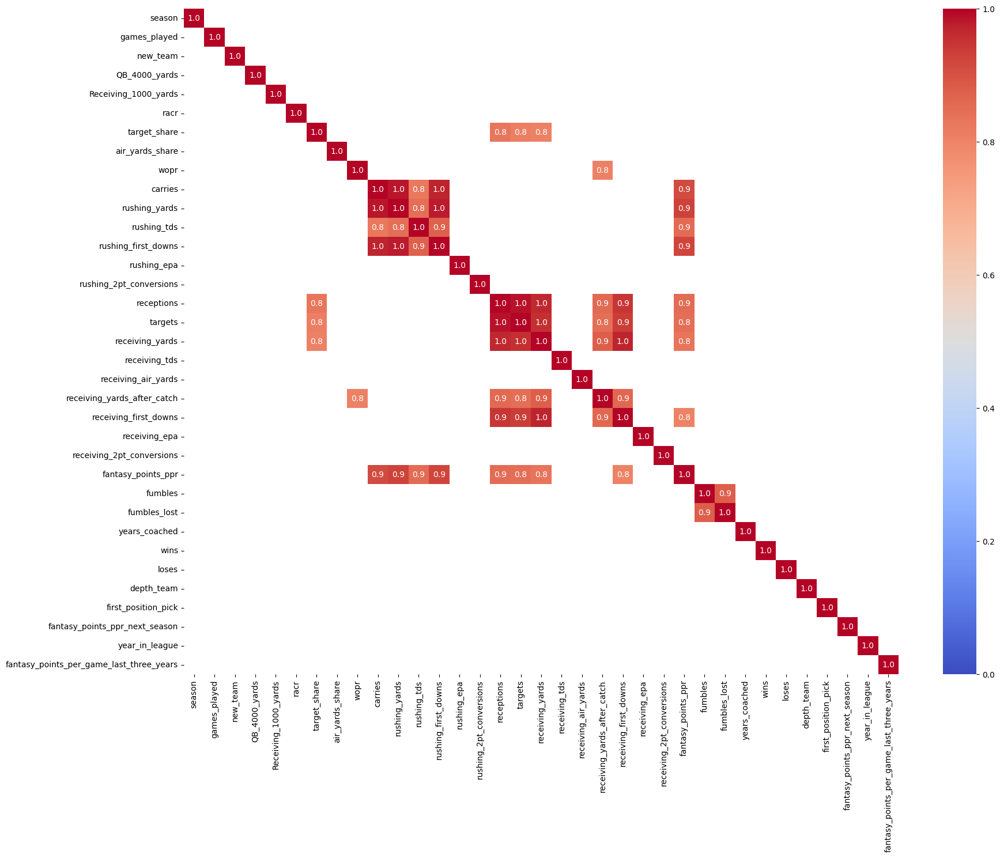

In [58]:
# Select only numeric columns
numeric_cols = rb_df.select_dtypes(include=[np.number])

# Compute the correlation matrix, round it to two decimals, and filter strong correlations
corr = numeric_cols.corr()
strong_corr = corr[corr > 0.80]

# Create the heatmap
fig, ax = plt.subplots()
fig.set_size_inches(20, 15)
sns.heatmap(strong_corr, annot=True, fmt='.1f', vmin=0, cmap='coolwarm', center=0.5, ax=ax)
plt.show()

In [59]:
# Drop highly correlated variables
rb_df.drop(columns=['loses','receiving_yards','fumbles_lost'
,'receptions','rushing_yards','rushing_tds', 'receiving_first_downs',
                    'targets','rushing_first_downs','carries','wopr',
                    'racr','rushing_2pt_conversions','receiving_2pt_conversions',
                   'receiving_air_yards','air_yards_share'],inplace=True)

<ipython-input-59-462edf22d23f>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rb_df.drop(columns=['loses','receiving_yards','fumbles_lost'


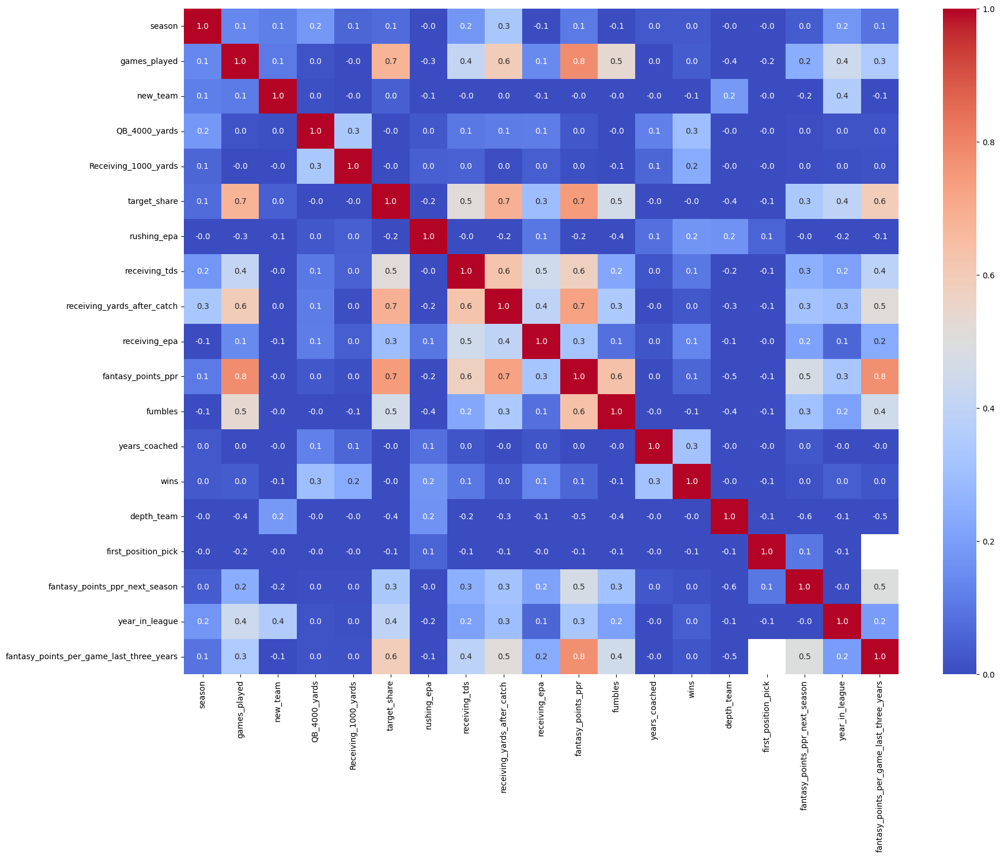

In [60]:
numeric_cols = rb_df.select_dtypes(include=[np.number])

# Compute the correlation matrix, round it to two decimals, and filter strong correlations
corr = numeric_cols.corr()

# Create the heatmap
fig, ax = plt.subplots()
fig.set_size_inches(20, 15)
sns.heatmap(corr, annot=True, fmt='.1f', vmin=0, cmap='coolwarm', center=0.5, ax=ax)
plt.show()


In [61]:
# Receivers df, will split again after seeing correlations
wr_df = df[(df['position'] == 'WR') | (df['position'] == 'TE')]

In [62]:
# Variables that don't apply to receivers
wr_df.drop(columns=['Receiving_1000_yards','completions','attempts',
       'passing_yards', 'passing_tds', 'interceptions', 'sacks', 'sack_yards',
        'passing_air_yards','rushing_1000_yards',
       'passing_yards_after_catch', 'passing_first_downs', 'passing_epa',
       'passing_2pt_conversions', 'pacr', 'dakota', 'fantasy_points'],
           inplace=True)

<ipython-input-62-b30cb6eaac5f>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wr_df.drop(columns=['Receiving_1000_yards','completions','attempts',


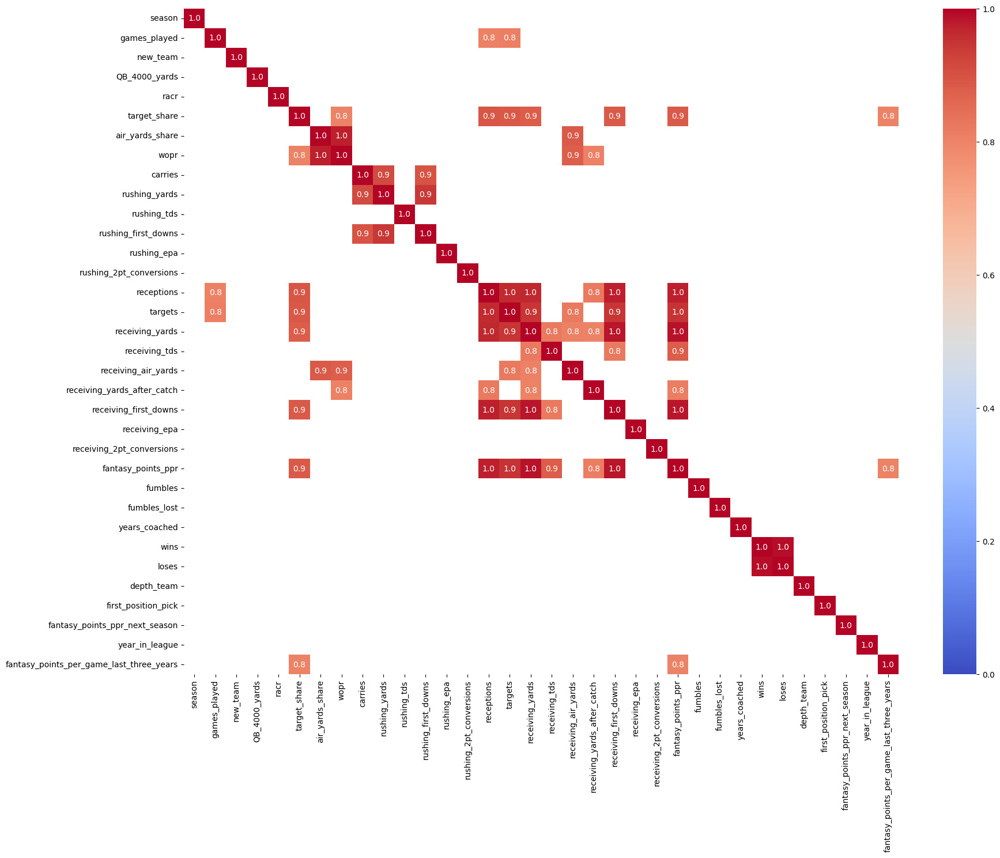

In [63]:
# Select only numeric columns
numeric_cols = wr_df.select_dtypes(include=[np.number])

# Compute the correlation matrix, round it to two decimals, and filter strong correlations
corr = numeric_cols.corr().abs()
strong_corr = corr[corr > 0.80]

# Create the heatmap
fig, ax = plt.subplots()
fig.set_size_inches(20, 15)
sns.heatmap(strong_corr, annot=True, fmt='.1f', vmin=0, cmap='coolwarm', center=0.5, ax=ax)
plt.show()

In [64]:
# Drop highly correlated variables
wr_df.drop(columns=['loses','fumbles_lost','receiving_yards'
,'receptions','receiving_first_downs','target_share','targets','receiving_tds','receiving_air_yards',
                    'wopr','rushing_first_downs','carries','receiving_2pt_conversions',
                    'rushing_2pt_conversions', 'fantasy_points_ppr',
                   'rushing_tds', 'rushing_epa','air_yards_share'],inplace=True)

<ipython-input-64-08105cead4f5>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wr_df.drop(columns=['loses','fumbles_lost','receiving_yards'


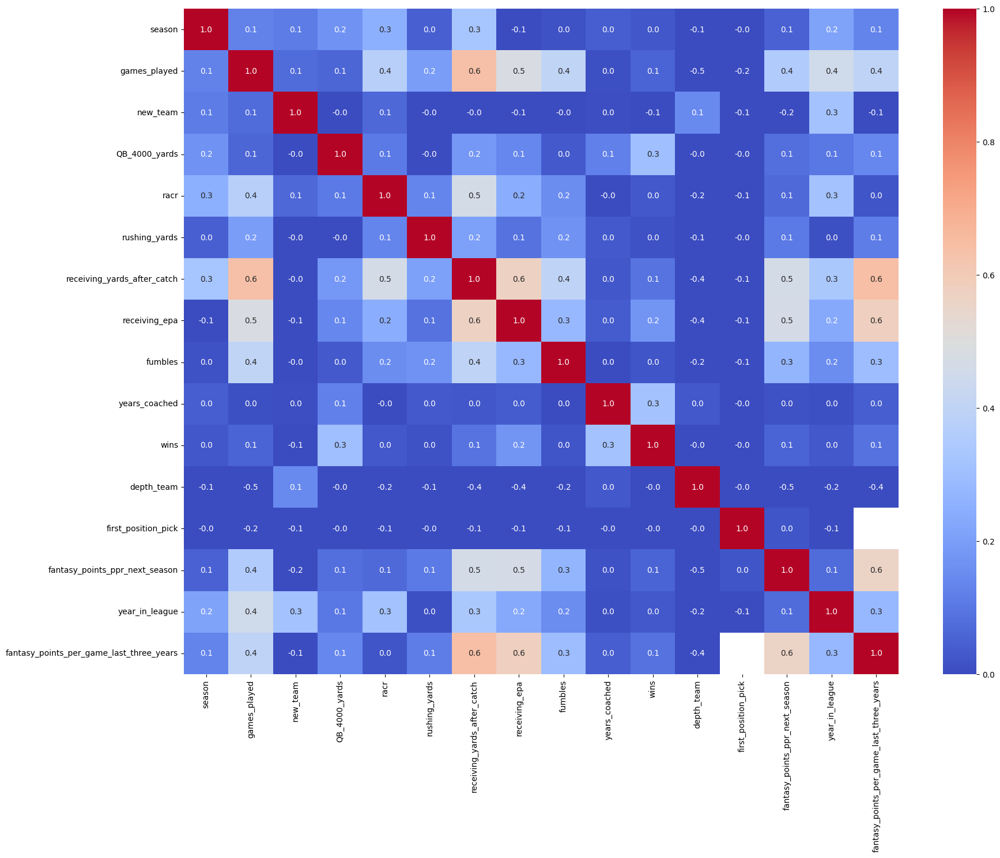

In [65]:
numeric_cols = wr_df.select_dtypes(include=[np.number])

# Compute the correlation matrix, round it to two decimals, and filter strong correlations
corr = numeric_cols.corr()

# Create the heatmap
fig, ax = plt.subplots()
fig.set_size_inches(20, 15)
sns.heatmap(corr, annot=True, fmt='.1f', vmin=0, cmap='coolwarm', center=0.5, ax=ax)
plt.show()

In [66]:
# Create qb df
qb_df = df[df['position'] == 'QB']
qb_df.columns

Index(['player_id', 'player_name', 'position', 'season', 'games_played',
       'injury type', 'injury severity', 'new_team', 'QB_4000_yards',
       'Receiving_1000_yards', 'rushing_1000_yards', 'racr', 'target_share',
       'air_yards_share', 'wopr', 'completions', 'attempts', 'passing_yards',
       'passing_tds', 'interceptions', 'sacks', 'sack_yards',
       'passing_air_yards', 'passing_yards_after_catch', 'passing_first_downs',
       'passing_epa', 'passing_2pt_conversions', 'pacr', 'dakota', 'carries',
       'rushing_yards', 'rushing_tds', 'rushing_first_downs', 'rushing_epa',
       'rushing_2pt_conversions', 'receptions', 'targets', 'receiving_yards',
       'receiving_tds', 'receiving_air_yards', 'receiving_yards_after_catch',
       'receiving_first_downs', 'receiving_epa', 'receiving_2pt_conversions',
       'fantasy_points', 'fantasy_points_ppr', 'fumbles', 'fumbles_lost',
       'years_coached', 'wins', 'loses', 'depth_team', 'binned_weight',
       'binned_height', '

In [67]:
# Variables that don't apply to qbs
qb_df.drop(columns=['receptions', 'targets', 'receiving_yards', 'receiving_tds', 'receiving_air_yards',
       'receiving_yards_after_catch', 'receiving_first_downs', 'receiving_epa',
       'receiving_2pt_conversions', 'fantasy_points',
        'QB_4000_yards', 'racr', 'target_share', 'air_yards_share', 'wopr',
                   'position' ],inplace=True)

<ipython-input-67-d01090978a4d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  qb_df.drop(columns=['receptions', 'targets', 'receiving_yards', 'receiving_tds', 'receiving_air_yards',


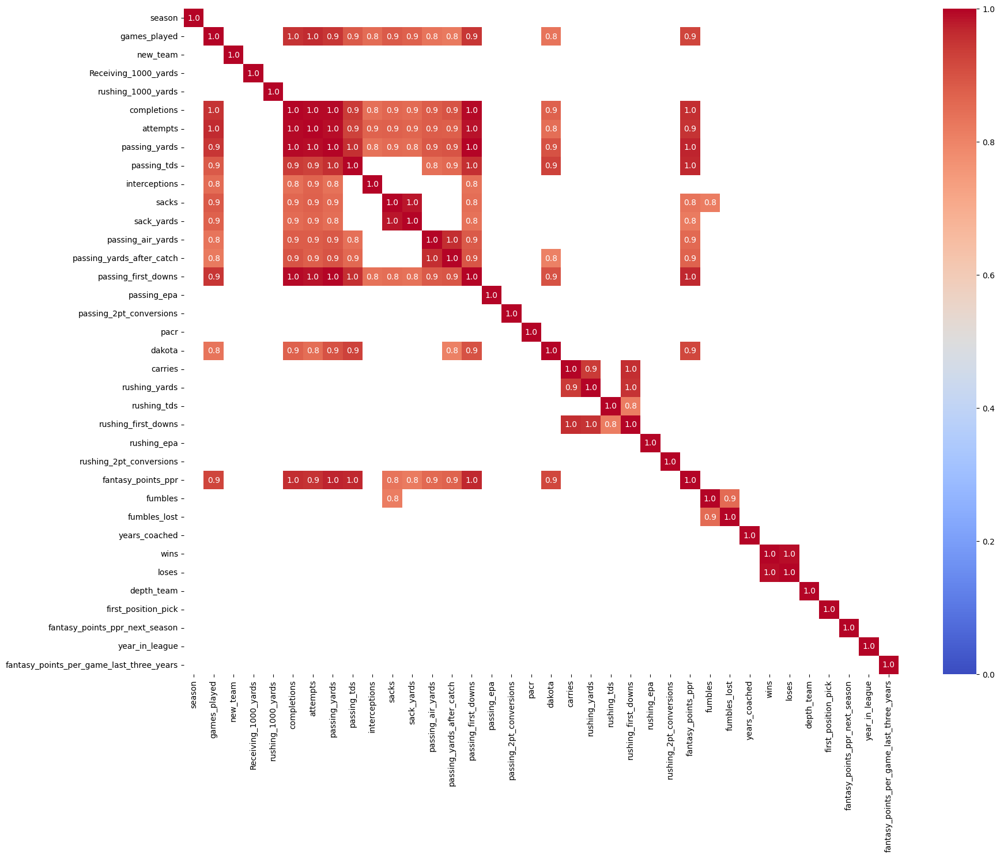

In [68]:
# Select only numeric columns
numeric_cols = qb_df.select_dtypes(include=[np.number])

# Compute the correlation matrix, round it to two decimals, and filter strong correlations
corr = numeric_cols.corr().abs()
strong_corr = corr[corr > 0.80]

# Create the heatmap
fig, ax = plt.subplots()
fig.set_size_inches(20, 15)
sns.heatmap(strong_corr, annot=True, fmt='.1f', vmin=0, cmap='coolwarm', center=0.5, ax=ax)
plt.show()

In [69]:
# Drop highly correlated variables
qb_df.drop(columns=['completions', 'attempts','passing_yards', 'passing_tds','passing_yards_after_catch',
                    'passing_first_downs','dakota','loses','passing_air_yards','sack_yards','games_played',
                    'carries','rushing_first_downs','fumbles_lost','sacks','interceptions','rushing_tds',
                    'passing_2pt_conversions','rushing_2pt_conversions', 'fantasy_points_ppr'],inplace=True)

<ipython-input-69-9838dd567475>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  qb_df.drop(columns=['completions', 'attempts','passing_yards', 'passing_tds','passing_yards_after_catch',


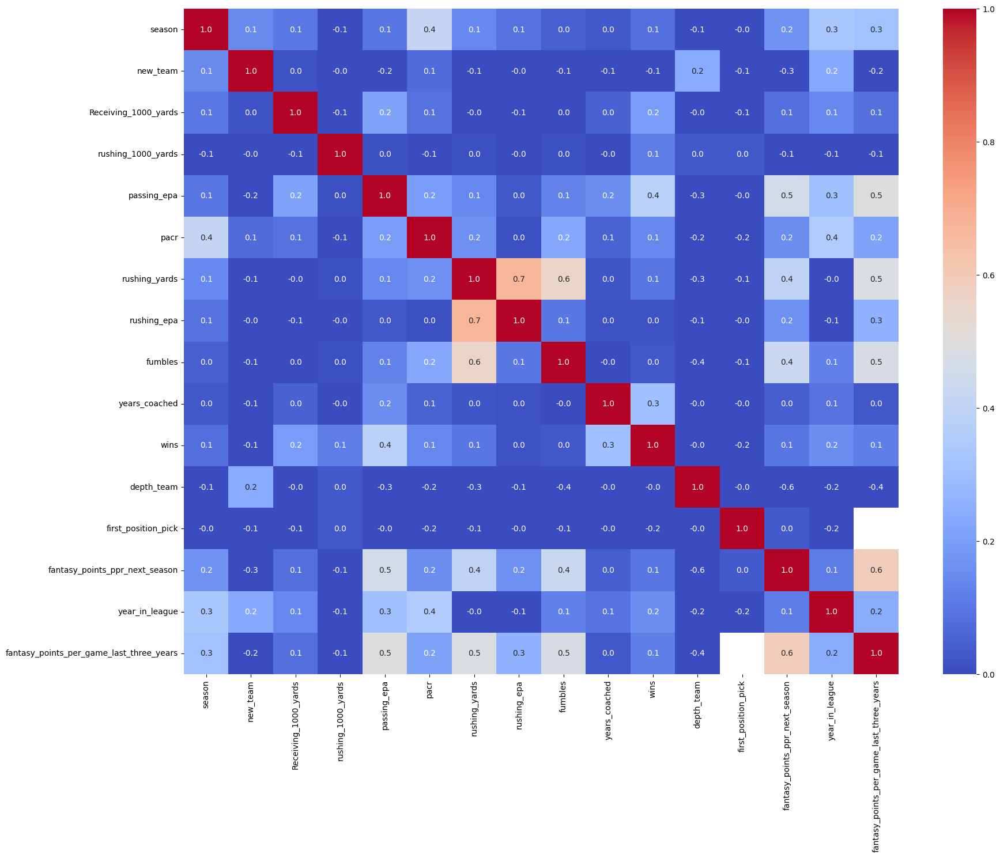

In [70]:
numeric_cols = qb_df.select_dtypes(include=[np.number])

# Compute the correlation matrix, round it to two decimals, and filter strong correlations
corr = numeric_cols.corr()

# Create the heatmap
fig, ax = plt.subplots()
fig.set_size_inches(20, 15)
sns.heatmap(corr, annot=True, fmt='.1f', vmin=0, cmap='coolwarm', center=0.5, ax=ax)
plt.show()

## Position Specific Changes

In [71]:
# This section mostly shows how the injury data was handled. I ended up dropping the qb and rb injury data, but still wanted to show how it was handled

In [72]:
qb_df.groupby(['injury type'])['player_id'].count()

injury type
abdomen         4
achilles        2
acl            20
ankle          27
arm             2
back            6
chest           4
collarbone      5
concussion     21
elbow           6
finger         17
foot            9
groin           3
hamstring       5
hand           11
head            6
hip             2
illness         1
knee           30
leg            18
mcl             3
neck            5
no injury     977
quad            1
ribs            7
shoulder       51
suspension      1
toe             3
wrist           2
Name: player_id, dtype: int64

In [73]:
# Group categories so each has a higher count
qb_df['injury type'] = qb_df['injury type'].replace({
    'suspension': 'other',
    'illness': 'other',
    'elbow': 'arm',
    'wrist': 'arm',
    'quad': 'leg',
    'concussion': 'head',
    'mcl':'knee',
    'collarbone':'shoulder',
    'abdomen':'torso',
    'chest':'torso',
    'ribs':'torso',
    'neck':'head',
    'acl':'knee',
    'hamstring':'leg',
    'finger':'hand',
    'toe':'foot',
    'back':'torso',
    'groin':'leg',
    'hip':'leg',
    'achilles':'ankle'
})

<ipython-input-73-41706f0de5ff>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  qb_df['injury type'] = qb_df['injury type'].replace({


In [74]:
# Drop minor, mild, and suspension injuries
conditions = (qb_df['injury severity'].isin(['minor', 'mild','suspension']))

# Replace 'injury_severity' under specified conditions
qb_df.loc[conditions, 'injury severity'] = 'no injury'

# Replace 'injury_type' and 'season_ending' under specified conditions
qb_df.loc[conditions, ['injury type']] = 'no injury'

In [75]:
# Not much difference in performance between injured and non injured qbs
# Foot and torso signifigant but not enough data to put them in model
qb_injury = qb_df.groupby(['injury type'])['fantasy_points_ppr_next_season'].agg(['mean','median','std','count'])
qb_injury.sort_values(by=['median'])

,mean,median,std,count
injury type,,,,
torso,87.765000,19.75,124.582299,8
foot,85.711429,63.92,93.294110,7
knee,127.852432,79.88,119.425550,37
head,125.491429,85.02,119.865051,7
shoulder,119.676296,96.08,121.065874,27
no injury,125.695897,101.84,112.182718,1053
ankle,133.520000,130.42,106.630659,10
leg,130.354667,145.26,96.021477,15
hand,170.266154,184.62,98.942138,13


In [76]:
qb_df.drop(columns=['injury type', 'injury severity'],inplace=True)

<ipython-input-76-a7ce27f8d481>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  qb_df.drop(columns=['injury type', 'injury severity'],inplace=True)


In [77]:
wr_df.groupby(['injury type'])['player_id'].count()

injury type
abdomen          9
achilles        23
acl             45
ankle          161
arm             11
back            29
chest           17
collarbone       5
concussion      76
elbow            5
finger          13
foot            77
groin           47
hamstring      125
hand            21
head            24
hip             24
illness          3
knee           172
leg             83
mcl             14
neck            10
no injury     3279
quad             8
ribs            21
shoulder        67
suspended        4
suspension      12
toe             18
wrist            7
Name: player_id, dtype: int64

In [78]:
# Group categories so each has a higher count
wr_df['injury type'] = wr_df['injury type'].replace({
    'suspension': 'other',
    'suspended' : 'other',
    'illness': 'other',
    'elbow': 'arm',
    'wrist': 'arm',
    'quad': 'leg',
    'concussion': 'head',
    'mcl':'knee',
    'collarbone':'shoulder',
    'abdomen':'torso',
    'chest':'torso',
    'ribs':'torso',
    'neck':'head',
    'acl':'knee',
    'finger':'hand',
    'toe':'foot',
    'back':'torso',
    'groin':'hip',
    'achilles':'ankle'
})

<ipython-input-78-f9ea22bf651f>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wr_df['injury type'] = wr_df['injury type'].replace({


In [79]:
# Now seperate the receivers
te_df = wr_df[wr_df['position'] == 'TE']
wr_df = wr_df[wr_df['position'] == 'WR']

In [80]:
# Drop minor, mild, and suspension injuries
conditions = (wr_df['injury severity'].isin(['minor', 'mild','suspension']))

# Replace 'injury_severity' under specified conditions
wr_df.loc[conditions, 'injury severity'] = 'no injury'

# Replace 'injury_type' and 'season_ending' under specified conditions
wr_df.loc[conditions, ['injury type']] = 'no injury'

In [81]:
# injuries seem to be signifigant for wrs keep them in model
wr_injury = wr_df.groupby(['injury type'])['fantasy_points_ppr_next_season'].agg(['mean','median','std','count'])
wr_injury.sort_values(by=['median'])

,mean,median,std,count
injury type,,,,
shoulder,62.311538,47.05,56.819562,26
foot,79.702564,62.00,83.507682,39
hip,79.753333,75.40,57.814628,15
arm,68.650000,75.45,51.308703,6
hand,113.883333,75.60,116.679277,6
head,101.195294,81.70,74.192345,17
knee,99.983368,85.90,80.684885,95
ankle,86.561569,87.30,67.275181,51
no injury,109.697911,97.74,83.680388,2652


In [82]:
# Further group categories
wr_df['injury type'] = wr_df['injury type'].replace({
    'other':'no injury',
    'hamstring':'leg',
    'hand':'arm'
})

<ipython-input-82-4fe3cf7c39b4>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wr_df['injury type'] = wr_df['injury type'].replace({


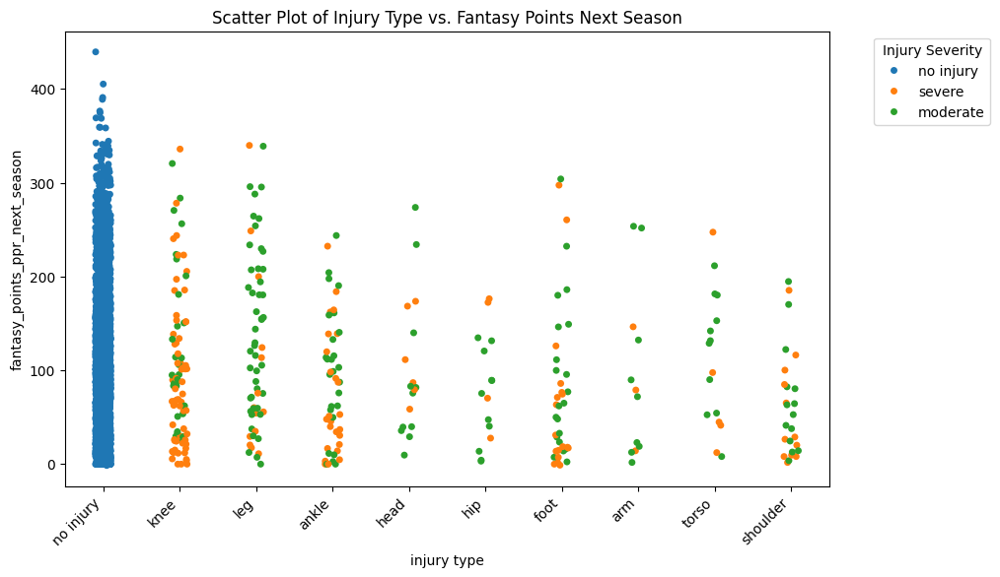

In [83]:
plt.figure(figsize=(10, 6))

# Use seaborn to create a scatter plot with hue based on injury severity
sns.stripplot(x='injury type', y='fantasy_points_ppr_next_season', hue='injury severity', data=wr_df)

# Providing a title for the plot
plt.title('Scatter Plot of Injury Type vs. Fantasy Points Next Season')

# Improve plot readability by rotating x labels if they are too long or numerous
plt.xticks(rotation=45, ha='right')

# Show the legend and improve its placement
plt.legend(title='Injury Severity', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()

In [84]:
# Drop minor, mild, moderate, and suspension injuries
conditions = (te_df['injury severity'].isin(['minor', 'mild','suspension','moderate']))

# Replace 'injury_severity' under specified conditions
te_df.loc[conditions, 'injury severity'] = 'no injury'

# Replace 'injury_type' and 'season_ending' under specified conditions
te_df.loc[conditions, ['injury type']] = 'no injury'

te_df.drop(columns=['injury severity'],inplace=True)

In [85]:
# injuries seem to be signifigant for tes keep them in model
te_injury = te_df.groupby(['injury type'])['fantasy_points_ppr_next_season'].agg(['mean','median','std','count'])
te_injury.sort_values(by=['median'])

,mean,median,std,count
injury type,,,,
torso,45.712500,37.95,36.220335,8
foot,53.887500,57.35,45.236535,8
hamstring,60.400000,60.90,54.849309,4
shoulder,79.516667,67.65,72.775997,6
hip,78.475000,72.50,78.056406,4
knee,81.507407,73.90,59.299208,27
arm,80.260000,75.20,69.167355,5
leg,73.030000,75.25,56.741246,10
no injury,83.929358,75.70,64.599445,1122


In [86]:
# Further group categories
te_df['injury type'] = te_df['injury type'].replace({
    'hamstring':'leg',
    'head':'no injury',
    'hip':'torso',
    'arm':'arm/shoulder',
    'shoulder':'arm/shoulder'
})

In [87]:
rb_df.groupby(['injury type'])['player_id'].count()

injury type
abdomen          4
achilles        12
achillies        1
acl             28
ankle           99
arm              6
back             7
chest            7
collarbone       2
concussion      28
elbow            1
finger           5
foot            29
groin           18
hamstring       39
hand             7
head             5
hip             12
knee           106
leg             65
mcl             19
neck             9
no injury     1584
quad             5
ribs            12
shoulder        26
suspension       7
toe             17
wrist            6
Name: player_id, dtype: int64

In [88]:
# Group categories so each has a higher count
rb_df['injury type'] = rb_df['injury type'].replace({
    'suspension': 'other',
    'suspended' : 'other',
    'illness': 'other',
    'elbow': 'arm',
    'wrist': 'arm',
    'quad': 'leg',
    'concussion': 'head',
    'mcl':'knee',
    'collarbone':'shoulder',
    'abdomen':'torso',
    'chest':'torso',
    'ribs':'torso',
    'neck':'head',
    'acl':'knee',
    'finger':'hand',
    'toe':'foot',
    'back':'torso',
    'groin':'hip',
    'achilles':'ankle',
    'achillies':'ankle',
    'hand':'arm'
})

<ipython-input-88-29e6d0a77034>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rb_df['injury type'] = rb_df['injury type'].replace({


In [89]:
conditions = (rb_df['injury severity'].isin(['minor', 'mild','suspension','moderate']))

# Replace 'injury_severity' under specified conditions
rb_df.loc[conditions, 'injury severity'] = 'no injury'

# Replace 'injury_type' and 'season_ending' under specified conditions
rb_df.loc[conditions, ['injury type']] = 'no injury'


In [90]:
# Injury does seem somewhat signifigant, but it didn't improve the model when I used it
rb_injury = rb_df.groupby(['injury type'])['fantasy_points_ppr_next_season'].agg(['mean','median','std','count'])
rb_injury.sort_values(by=['median'])

,mean,median,std,count
injury type,,,,
head,60.616667,50.50,48.331084,6
leg,71.407059,51.60,68.122875,17
foot,121.488571,68.00,127.239615,7
ankle,80.850000,71.95,70.188038,22
torso,74.925000,78.55,55.721532,4
knee,110.521176,85.70,89.790571,68
hamstring,88.100000,88.10,47.517576,2
no injury,109.159627,92.50,89.040532,1930
shoulder,113.587500,113.20,90.134113,8


In [91]:
rb_df.drop(columns=['injury type','injury severity'],inplace=True)

<ipython-input-91-ca6cc4dedd6e>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rb_df.drop(columns=['injury type','injury severity'],inplace=True)


In [92]:
df[df['year_in_league']==1].groupby(['position','binned_height'])['player_id'].count()

position  binned_height
QB        66-68              0
          69-71              4
          72-74             57
          75-77             86
          78-80             10
RB        66-68             33
          69-71            204
          72-74            123
          75-77              5
          78-80              0
TE        66-68              0
          69-71              0
          72-74             11
          75-77            128
          78-80             37
WR        66-68             20
          69-71            120
          72-74            244
          75-77            110
          78-80              3
Name: player_id, dtype: int64

In [93]:
# Add bins with low count to nearest bin
qb_df['binned_height'] = qb_df['binned_height'].replace({
    '66-68':'72-74',
    '69-71':'72-74'
})

rb_df['binned_height'] = rb_df['binned_height'].replace({
    '75-77':'72-74',
    '78-80':'72-74'
})

te_df['binned_height'] = te_df['binned_height'].replace({
    '66-68':'72-74',
    '69-71':'72-74'
})

wr_df['binned_height'] = wr_df['binned_height'].replace({
    '78-80':'75-77'
})

<ipython-input-93-2dce262b30e3>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  qb_df['binned_height'] = qb_df['binned_height'].replace({
<ipython-input-93-2dce262b30e3>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rb_df['binned_height'] = rb_df['binned_height'].replace({


In [94]:
df[df['year_in_league']==1].groupby(['position','binned_weight'])['player_id'].count()

position  binned_weight
QB        160-179            0
          180-199            2
          200-219           58
          220-239           83
          240-259           11
          260-279            3
RB        160-179            0
          180-199           33
          200-219          180
          220-239          132
          240-259           18
          260-279            2
TE        160-179            0
          180-199            0
          200-219            0
          220-239           13
          240-259          119
          260-279           44
WR        160-179           42
          180-199          174
          200-219          225
          220-239           54
          240-259            2
          260-279            0
Name: player_id, dtype: int64

In [95]:
# Add bins with low count to nearest bin
qb_df['binned_height'] = qb_df['binned_height'].replace({
    '160-179':'200-219',
    '180-199':'200-219',
    '260-279':'240-259'
})

rb_df['binned_height'] = rb_df['binned_height'].replace({
    '160-179':'180-199',
    '260-279':'240-259'
})

te_df['binned_height'] = te_df['binned_height'].replace({
    '160-179':'220-239',
    '180-199':'220-239',
    '200-219':'220-239'
})

wr_df['binned_height'] = wr_df['binned_height'].replace({
    '260-279':'220-239',
    '240-259':'220-239'
})

<ipython-input-95-5882f5d89b72>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  qb_df['binned_height'] = qb_df['binned_height'].replace({
<ipython-input-95-5882f5d89b72>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rb_df['binned_height'] = rb_df['binned_height'].replace({


In [96]:
df[df['year_in_league']==1].groupby(['position','binned_draft_pick'])['player_id'].count()

position  binned_draft_pick 
QB        Top 5                 37
          Early First Round     23
          Late First Round      17
          Early Second Round     8
          Late Second Round      9
          Third Round           15
          Middle Round          18
          Late Round            13
          Undrafted             17
RB        Top 5                 12
          Early First Round     14
          Late First Round      29
          Early Second Round    24
          Late Second Round     30
          Third Round           57
          Middle Round          79
          Late Round            43
          Undrafted             77
TE        Top 5                  1
          Early First Round      7
          Late First Round      19
          Early Second Round    19
          Late Second Round     17
          Third Round           29
          Middle Round          40
          Late Round            17
          Undrafted             27
WR        Top 5           

In [97]:
# Only one entry for top 5 tight end so assign it to early first round

te_df['binned_draft_pick'] = te_df['binned_draft_pick'].replace({
    'Top 5':'Early First Round'
})

# Modeling

## Quaterback Analysis

### Regression

In [98]:
# Import all libraries needed for models

import warnings
from  sklearn.linear_model  import LinearRegression, Lasso, Ridge
from sklearn.impute import KNNImputer
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, VotingRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import mean_squared_error, r2_score
import xgboost as xgb
import statsmodels.api as sm
from scipy import stats
from scipy.stats import rankdata
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statistics as stat
import math
import itertools


In [99]:
#function to check for correlation
def prediction_scatterplot(actual, pred):
  plt.figure(figsize=(8, 6))
  plt.scatter(actual, pred, color='blue')
  plt.plot([actual.min(), actual.max()], [actual.min(), actual.max()], 'k--', lw=2)
  plt.xlabel('Actual')
  plt.ylabel('Predicted')
  plt.title('Actual vs. Predicted')
  plt.show()


In [100]:
# Function to create bar graph of results
def top_predictions(results):
    melted_results = pd.melt(results, id_vars=['player_id', 'player_name'],
                         value_vars=['actual_fantasy_points', 'predicted_fantasy_points'],
                         var_name='Fantasy Points Type', value_name='Fantasy Points')

    sns.set(style="whitegrid")
    plt.figure(figsize=(12, 6))
    sns.barplot(x='player_name', y='Fantasy Points', hue='Fantasy Points Type', data=melted_results)
    plt.xlabel('Player Name')
    plt.ylabel('Fantasy Points')
    plt.title('Actual vs. Predicted Fantasy Points for Each Player')
    plt.xticks(rotation=90)
    plt.legend()
    plt.tight_layout()
    plt.show()

In [101]:
# Rookie qb model for regression
rookie_qb_df = qb_df[qb_df['year_in_league']==1]
# Drop all columns that don't apply to rookies
rookie_qb_df.drop(columns=[
       'new_team','passing_epa',
       'pacr', 'rushing_yards',
       'rushing_epa', 'fumbles', 'year_in_league',
       'fantasy_points_per_game_last_three_years'],inplace=True)

train_rookie = rookie_qb_df[rookie_qb_df['season']<2023]
test_rookie = rookie_qb_df[rookie_qb_df['season']==2023]

train_ids_rookie = train_rookie[['player_id', 'player_name']]
test_ids_rookie = test_rookie[['player_id', 'player_name']]

train_X_rok = pd.get_dummies(train_rookie.drop(columns=['player_id','player_name',
                                                'season','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
train_y_rok = train_rookie['fantasy_points_ppr_next_season'].astype(float)
test_X_rok = pd.get_dummies(test_rookie.drop(columns=['player_id','player_name',
                                                'season','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
test_y_rok = test_rookie['fantasy_points_ppr_next_season'].astype(float)
test_X_rok = test_X_rok.reindex(columns=train_X_rok.columns, fill_value=0)

<ipython-input-101-04ed5e9c2419>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rookie_qb_df.drop(columns=[


In [102]:
def lasso_regression(train_X, test_X, train_y, test_y, test_ids_names):
    # Feature Scaling
    scaler = StandardScaler()
    train_X_scaled = scaler.fit_transform(train_X)
    test_X_scaled = scaler.transform(test_X)

    # Initialize the Lasso model
    lasso = Lasso(random_state=0)

    # Define a grid of hyperparameters to search
    param_grid = {'alpha': [0.01, 0.1, 1, 10, 100]}

    # Perform Grid Search with cross-validation
    grid_search = GridSearchCV(estimator=lasso, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5, verbose=1)
    grid_search.fit(train_X_scaled, train_y)

    # Get the best model from grid search
    best_lasso = grid_search.best_estimator_

    # Make predictions on the test set
    y_pred = best_lasso.predict(test_X_scaled)

    mse = mean_squared_error(test_y, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(test_y, y_pred)

    print("Best alpha:", grid_search.best_params_)
    print("Root Mean Squared Error:", rmse)
    print("R-squared:", r2)

    # Get the coefficients from the best Lasso model
    coefficients = pd.DataFrame({'Feature': train_X.columns, 'Coefficient': best_lasso.coef_})
    important_features = coefficients[coefficients['Coefficient'] != 0].sort_values(by='Coefficient', ascending=False)

    print("Selected Features and their coefficients:")
    print(important_features)

    # Plot the coefficients of the features
    plt.figure(figsize=(10, 6))
    plt.barh(important_features['Feature'], important_features['Coefficient'], color='skyblue')
    plt.xlabel('Coefficient Value')
    plt.ylabel('Features')
    plt.title('Feature Coefficients from Lasso Regression')
    plt.gca().invert_yaxis()
    plt.show()

    # Evaluate predictions
    prediction_scatterplot(test_y, y_pred)

    results = pd.DataFrame({
        'player_id': test_ids_names['player_id'],
        'player_name': test_ids_names['player_name'],
        'actual_fantasy_points': test_y,
        'predicted_fantasy_points': y_pred
    })

    results['actual_points_rank'] = results['actual_fantasy_points'].rank(ascending=False)
    results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
    results = results.sort_values('predicted_fantasy_points',ascending=False)
    top = results.head(10)

    top_predictions(top)

    return results, best_lasso


Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best alpha: {'alpha': 10}
Root Mean Squared Error: 79.22875138508807
R-squared: -0.4054713764634972
Selected Features and their coefficients:
                                Feature  Coefficient
5                   first_position_pick     5.276663
13  binned_draft_pick_Early First Round     4.314343
9                 binned_weight_240-259     1.619800
16  binned_draft_pick_Late Second Round    -2.835221
3                                  wins   -10.817885
4                            depth_team   -39.543803


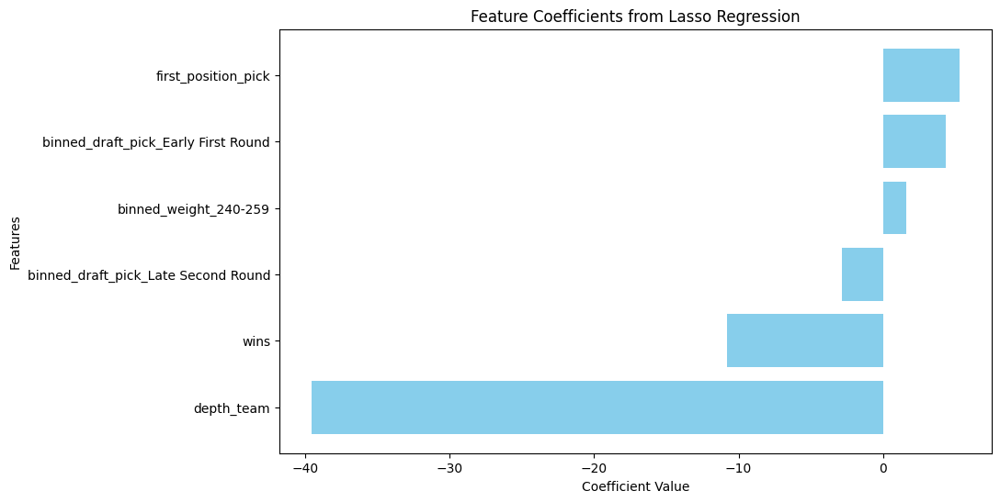

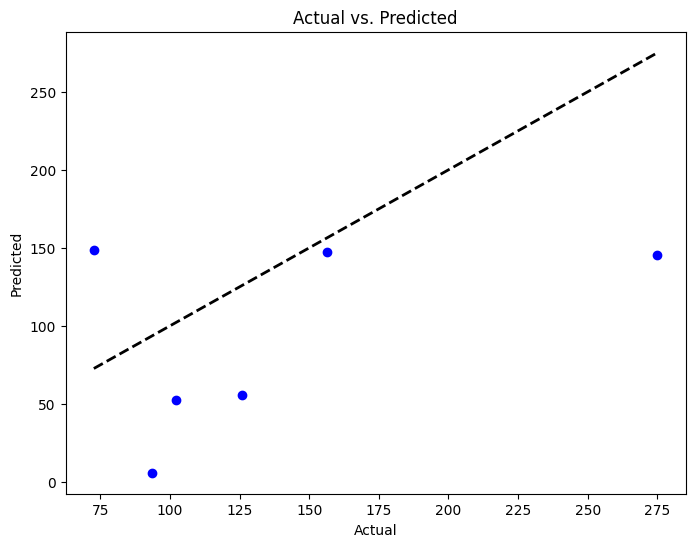

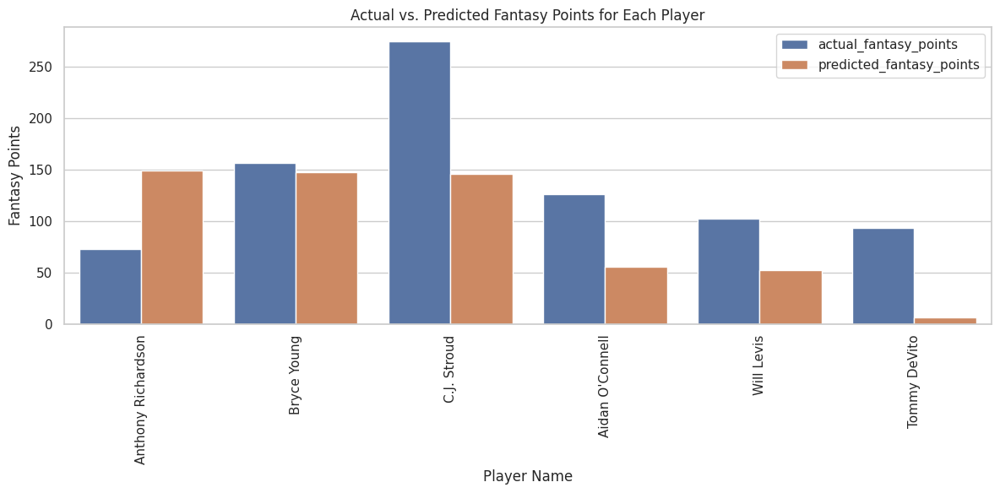

In [103]:
# qb rookie lasso model
rookie_results, best_lasso_rookie = lasso_regression(train_X_rok, test_X_rok, train_y_rok, test_y_rok, test_ids_rookie)

In [104]:
# Veteran qb model for regression
# qb_df.dropna(axis = 0, inplace=True)
train_qb = qb_df[qb_df['season']<2023].dropna(axis = 0)
test_qb = qb_df[qb_df['season']==2023].dropna(axis = 0)

# Saving player_id and player_name before dropping them
train_ids_veteran = train_qb[['player_id', 'player_name']]
test_ids_veteran = test_qb[['player_id', 'player_name']]

train_X = pd.get_dummies(train_qb.drop(columns=['player_id','player_name','season','fantasy_points_ppr_next_season','first_position_pick']),drop_first=True).astype(float)
train_y = train_qb['fantasy_points_ppr_next_season'].astype(float)
test_X = pd.get_dummies(test_qb.drop(columns=['player_id','player_name','season','fantasy_points_ppr_next_season','first_position_pick']),drop_first=True).astype(float)
test_y = test_qb['fantasy_points_ppr_next_season'].astype(float)
test_X = test_X.reindex(columns=train_X.columns, fill_value=0)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best alpha: {'alpha': 1}
Root Mean Squared Error: 83.95249811381657
R-squared: 0.49153529236455673
Selected Features and their coefficients:
                                     Feature  Coefficient
12  fantasy_points_per_game_last_three_years    26.297839
3                                passing_epa    23.248659
7                                    fumbles     9.947632
5                              rushing_yards     8.796449
8                              years_coached     1.833705
1                       Receiving_1000_yards     1.726842
16                     binned_weight_240-259     0.324959
19                       binned_height_78-80    -0.879031
25            binned_draft_pick_Middle Round    -1.204012
15                     binned_weight_220-239    -1.361900
4                                       pacr    -1.407842
26              binned_draft_pick_Late Round    -1.416802
17                     binned_weight_260-279 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.281e+03, tolerance: 9.906e+02
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.318e+03, tolerance: 1.007e+03
  model = cd_fast.enet_coordinate_descent(


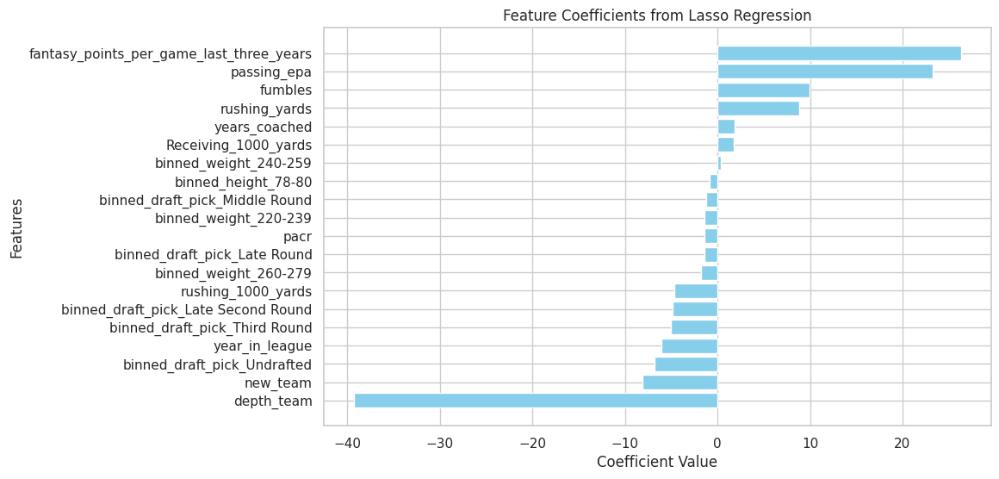

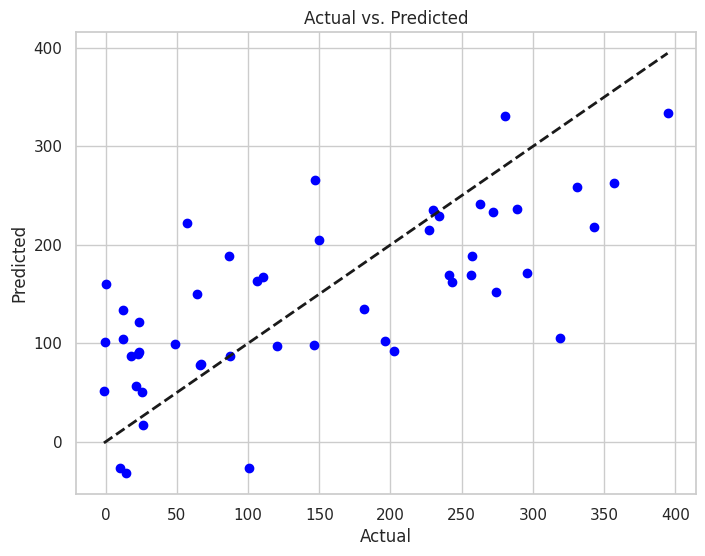

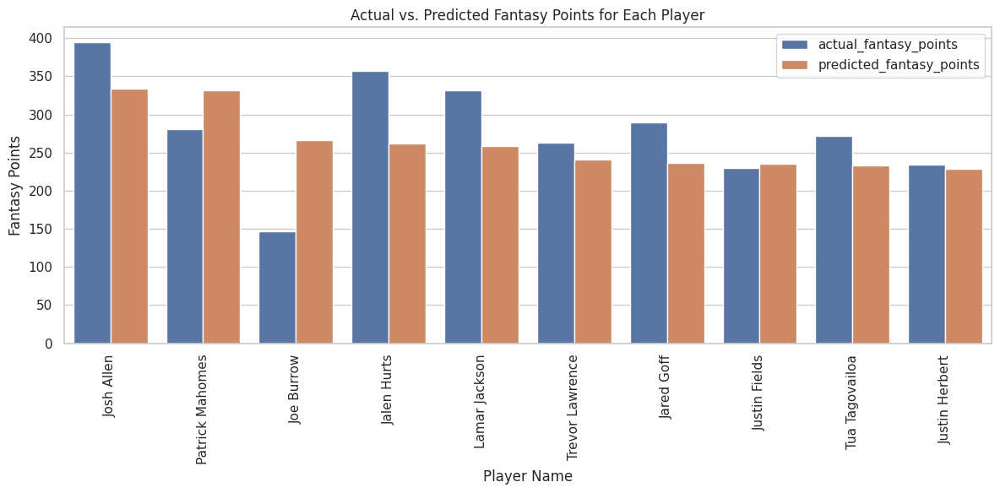

In [105]:
# Veteran qb lasso model
veteran_results, best_lasso_veteran = lasso_regression(train_X, test_X, train_y, test_y, test_ids_veteran)

In [106]:
# Results for lasso model
results = pd.concat([rookie_results, veteran_results], ignore_index=True)

# Rank based on actual and predictive performance, best way to gauge accuracy
results['actual_points_rank'] = results['actual_fantasy_points'].rank(ascending=False)
results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
results = results.sort_values('predicted_fantasy_points',ascending=False)

results.sort_values('predicted_fantasy_points',ascending=False).head(60)

,player_id,player_name,actual_fantasy_points,predicted_fantasy_points,actual_points_rank,predicted_points_rank
6,00-0034857,Josh Allen,394.64,334.325188,1.0,1.0
7,00-0033873,Patrick Mahomes,280.22,331.129322,8.0,2.0
8,00-0036442,Joe Burrow,147.16,266.324887,25.0,3.0
9,00-0036389,Jalen Hurts,356.82,262.429635,2.0,4.0
10,00-0034796,Lamar Jackson,331.22,258.982985,4.0,5.0
11,00-0036971,Trevor Lawrence,262.54,241.252064,12.0,6.0
12,00-0033106,Jared Goff,289.10,236.575256,7.0,7.0
13,00-0036945,Justin Fields,230.18,234.913383,18.0,8.0
14,00-0036212,Tua Tagovailoa,272.36,233.523755,11.0,9.0
15,00-0036355,Justin Herbert,234.16,228.870505,17.0,10.0


### Random Forest

In [ ]:
#random forrest regression model
def randomforest(train_X, test_X, train_y, test_y, test_ids_names):

    forest_params = {
    'n_estimators': [200,300,400],
    'max_depth': [3,5,6]
    }

    forest_grid = GridSearchCV(
      estimator = RandomForestRegressor(random_state=0), param_grid =  forest_params, scoring="neg_mean_squared_error",cv=5,verbose=1
    )
    forest_grid.fit(train_X, train_y)

    # Get best estimator from grid search
    best_forest_reg = forest_grid.best_estimator_
    print('Best parameters: ', best_forest_reg)
    # Make predictions on test data
    pred_y = best_forest_reg.predict(test_X)

    # Evaluating the model
    mse = mean_squared_error(test_y, pred_y)
    print(f'Root Mean Squared Error: {math.sqrt(mse)}')

    r2 = r2_score(test_y, pred_y)
    print(f'R-squared: {r2}')

    # Prepare DataFrame to show predictions with player information
    results = pd.DataFrame({
        'player_id': test_ids_names['player_id'],
        'player_name': test_ids_names['player_name'],
        'actual_fantasy_points': test_y,
        'predicted_fantasy_points': pred_y
    })

    results['actual_points_rank'] = results['actual_fantasy_points'].rank(ascending=False)
    results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
    results = results.sort_values('predicted_fantasy_points',ascending=False)
    top = results.head(10)

    top_predictions(top)
    prediction_scatterplot(test_y, pred_y)
    return results, best_forest_reg


In [ ]:
# Rookie data for ensemble modelst
train_ids_rookie = train_rookie[['player_id', 'player_name']]
test_ids_rookie = test_rookie[['player_id', 'player_name']]

train_X_rok = pd.get_dummies(train_rookie.drop(columns=['player_id','player_name',
                                                'season','fantasy_points_ppr_next_season']),drop_first=False).astype(float)
train_y_rok = train_rookie['fantasy_points_ppr_next_season'].astype(float)
test_X_rok = pd.get_dummies(test_rookie.drop(columns=['player_id','player_name',
                                                'season','fantasy_points_ppr_next_season']),drop_first=False).astype(float)
test_y_rok = test_rookie['fantasy_points_ppr_next_season'].astype(float)
test_X_rok = test_X_rok.reindex(columns=train_X_rok.columns, fill_value=0)

In [ ]:
# Veteran data for ensemble models
train_ids_veteran = train_qb[['player_id', 'player_name']]
test_ids_veteran = test_qb[['player_id', 'player_name']]

train_X = pd.get_dummies(train_qb.drop(columns=['player_id','player_name','season','fantasy_points_ppr_next_season',
                                                'first_position_pick']),drop_first=False).astype(float)
train_y = train_qb['fantasy_points_ppr_next_season'].astype(float)
test_X = pd.get_dummies(test_qb.drop(columns=['player_id','player_name','season','fantasy_points_ppr_next_season',
                                              'first_position_pick']),drop_first=False).astype(float)
test_y = test_qb['fantasy_points_ppr_next_season'].astype(float)
test_X = test_X.reindex(columns=train_X.columns, fill_value=0)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best parameters:  RandomForestRegressor(max_depth=3, n_estimators=400, random_state=0)
Root Mean Squared Error: 99.90889755136793
R-squared: -1.234934066870939


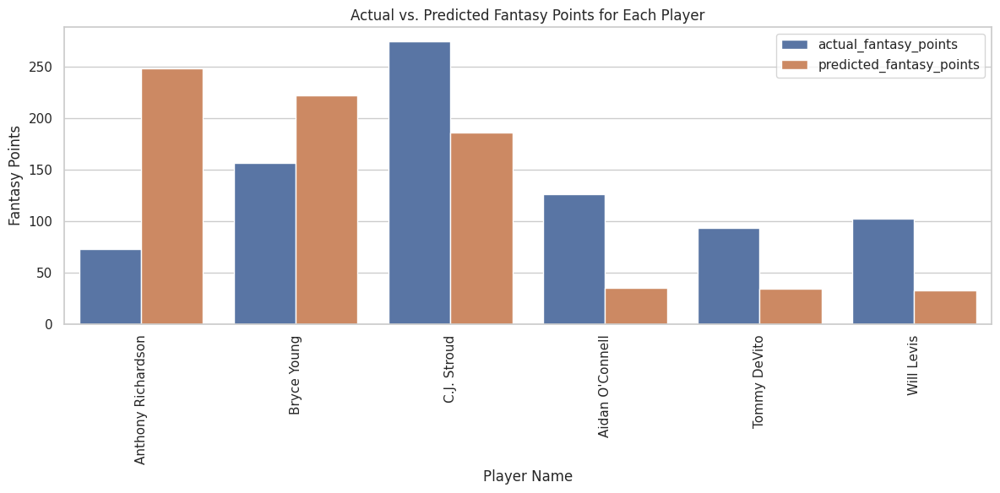

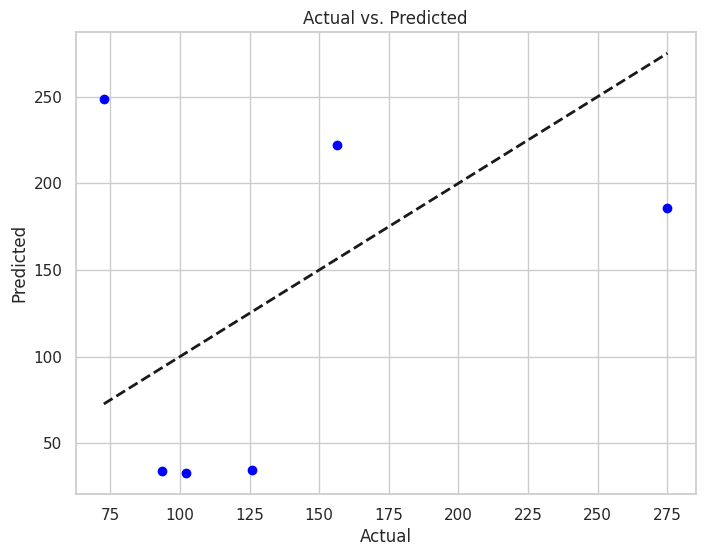

In [ ]:
forest_rookie_results, best_forest_rookie  = randomforest(train_X_rok, test_X_rok, train_y_rok, test_y_rok, test_ids_rookie)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best parameters:  RandomForestRegressor(max_depth=3, n_estimators=300, random_state=0)
Root Mean Squared Error: 82.07909869317062
R-squared: 0.5139748707677319


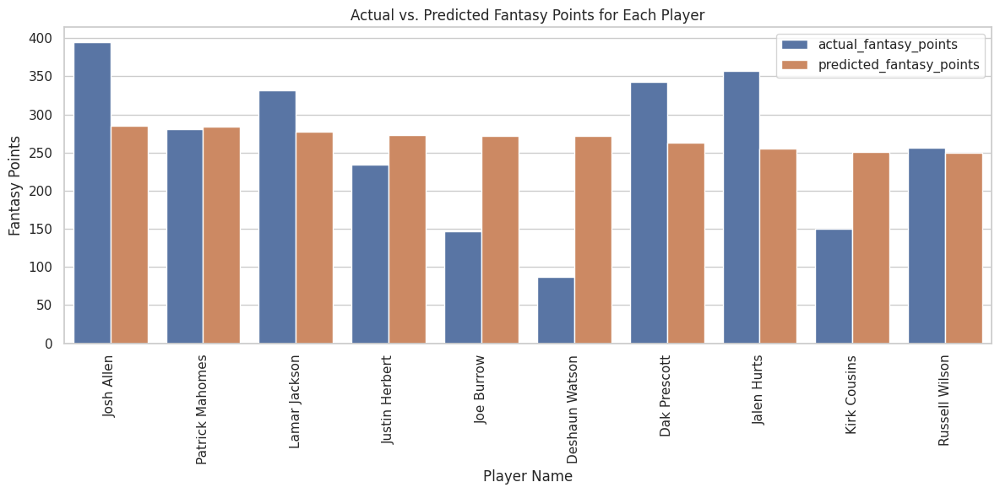

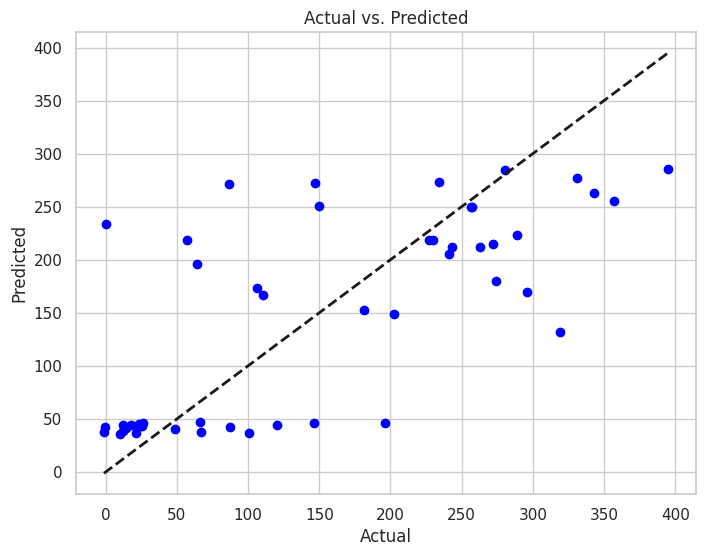

In [ ]:
forest_veteran_results, best_forest_veteran = randomforest(train_X, test_X, train_y, test_y, test_ids_veteran)

In [ ]:
# Results for random forest
results = pd.concat([forest_rookie_results, forest_veteran_results], ignore_index=True)

# Rank based on actual and predictive performance, best way to gauge accuracy
results['actual_points_rank'] = results['actual_fantasy_points'].rank(ascending=False)
results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
results = results.sort_values('predicted_fantasy_points',ascending=False)

results.sort_values('predicted_fantasy_points',ascending=False).head(60)

,player_id,player_name,actual_fantasy_points,predicted_fantasy_points,actual_points_rank,predicted_points_rank
6,00-0034857,Josh Allen,394.64,285.367170,1.0,1.0
7,00-0033873,Patrick Mahomes,280.22,284.583190,8.0,2.0
8,00-0034796,Lamar Jackson,331.22,277.154576,4.0,3.0
9,00-0036355,Justin Herbert,234.16,273.243377,17.0,4.0
10,00-0036442,Joe Burrow,147.16,272.126684,25.0,5.0
11,00-0033537,Deshaun Watson,86.80,271.591714,35.0,6.0
12,00-0033077,Dak Prescott,342.84,262.750172,3.0,7.0
13,00-0036389,Jalen Hurts,356.82,255.526782,2.0,8.0
14,00-0029604,Kirk Cousins,149.74,250.312601,24.0,9.0
15,00-0029263,Russell Wilson,256.90,249.514308,14.0,10.0


### XGBoost

In [ ]:
# XGBoost model
def xgboost(train_X, test_X, train_y, test_y, test_ids_names ):
    xg_reg = xgb.XGBRegressor(objective = "reg:squarederror",n_estimators = 10,random_state=0)
    xg_reg.fit(train_X,train_y)
    feature_importance = [(train_X.columns[i], item) for i, item in enumerate(xg_reg.feature_importances_)]

    sorted_feature_importance = sorted(feature_importance, key=lambda x: x[1], reverse=True)
    for feature, importance in sorted_feature_importance:
        print("{0:s}: {1:.6f}".format(feature, importance))
    features = [feature[0] for feature in sorted_feature_importance]
    importance_scores = [feature[1] for feature in sorted_feature_importance]
    plt.figure(figsize=(10, 6))
    plt.barh(features[:20], importance_scores[:20], color='skyblue')
    plt.xlabel('Feature Importance Score')
    plt.ylabel('Features')
    plt.title('Feature Importance')
    plt.gca().invert_yaxis()  # Invert y-axis to show the most important features at the top
    plt.show()

    xgb_params = {
    'n_estimators': [30,40,50],
    'max_depth': [2,3,4]
    }

    xgb_grid = GridSearchCV(
      estimator = xg_reg, param_grid =  xgb_params, scoring="neg_mean_squared_error",cv=5,verbose=1
    )
    xgb_grid.fit(train_X, train_y)

    # Get best estimator from grid search
    best_xgb_reg = xgb_grid.best_estimator_

    # Make predictions on test data
    Y_pred = best_xgb_reg.predict(test_X)
    mse = mean_squared_error(test_y, Y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(test_y, Y_pred)


    print("Root Mean Squared Error:", rmse)
    print("R-squared:", r2)


    prediction_scatterplot(test_y, Y_pred)

    results = pd.DataFrame({
    'player_id': test_ids_names['player_id'],
    'player_name': test_ids_names['player_name'],
    'actual_fantasy_points': test_y,
    'predicted_fantasy_points': Y_pred
    })

    results['actual_points_rank'] = results['actual_fantasy_points'].rank(ascending=False)
    results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
    results = results.sort_values('predicted_fantasy_points',ascending=False)
    top = results.head(10)

    top_predictions(top)
    #results.sort_values('predicted_fantasy_points',ascending=False)

    return results, best_xgb_reg




depth_team: 0.373513
binned_draft_pick_Early First Round: 0.144548
binned_draft_pick_Top 5: 0.100910
binned_height_75-77: 0.043381
binned_draft_pick_Third Round: 0.037457
binned_height_78-80: 0.030787
wins: 0.029435
rushing_1000_yards: 0.024612
binned_draft_pick_Late Round: 0.024473
binned_draft_pick_Late Second Round: 0.023773
first_position_pick: 0.023467
years_coached: 0.022972
binned_weight_240-259: 0.022856
binned_draft_pick_Late First Round: 0.020097
binned_weight_220-239: 0.016809
binned_height_72-74: 0.015946
binned_draft_pick_Middle Round: 0.015122
binned_weight_260-279: 0.010423
Receiving_1000_yards: 0.006918
binned_weight_200-219: 0.006497
binned_draft_pick_Early Second Round: 0.006002
binned_weight_160-179: 0.000000
binned_weight_180-199: 0.000000
binned_draft_pick_Undrafted: 0.000000


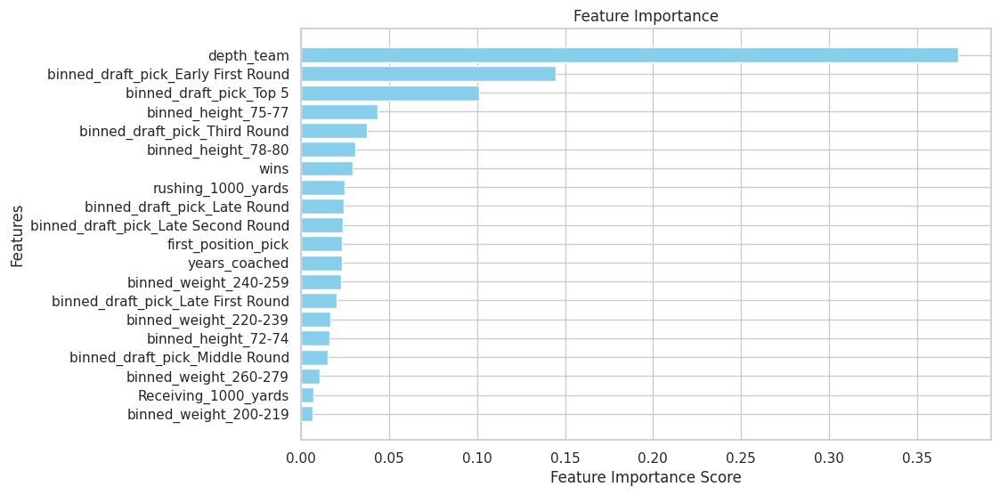

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Root Mean Squared Error: 96.26671845764243
R-squared: -1.0749551676678872


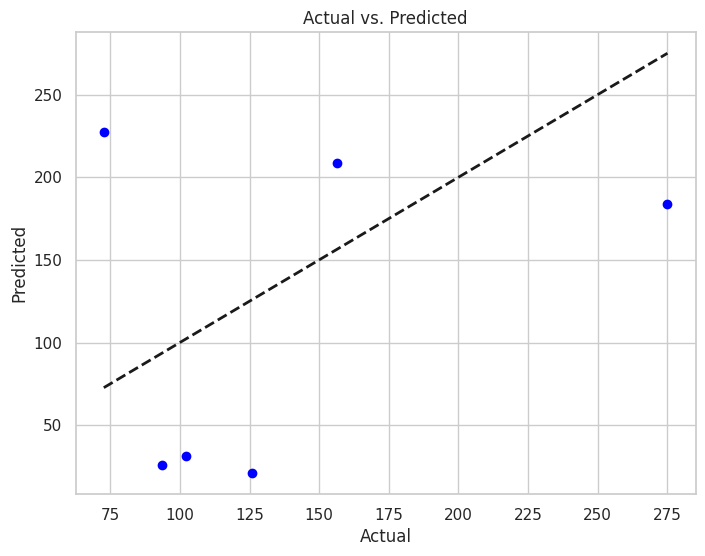

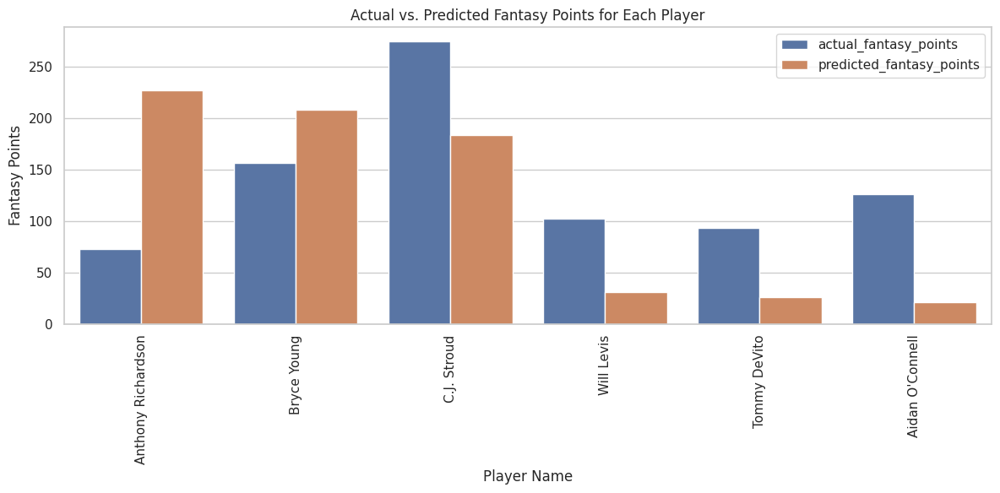

In [ ]:
xgb_rookie_results, best_xgb_rookie = xgboost(train_X_rok, test_X_rok, train_y_rok, test_y_rok, test_ids_rookie)

depth_team: 0.654845
fantasy_points_per_game_last_three_years: 0.039683
binned_draft_pick_Top 5: 0.026118
binned_height_75-77: 0.022695
binned_weight_200-219: 0.017707
binned_draft_pick_Late Second Round: 0.017236
rushing_yards: 0.015522
rushing_epa: 0.013570
binned_weight_220-239: 0.013302
fumbles: 0.013222
binned_height_78-80: 0.012662
passing_epa: 0.012467
wins: 0.012392
year_in_league: 0.012351
binned_weight_260-279: 0.011869
binned_draft_pick_Early First Round: 0.011277
binned_draft_pick_Undrafted: 0.010544
binned_draft_pick_Late First Round: 0.010376
pacr: 0.009915
years_coached: 0.009767
new_team: 0.009411
binned_draft_pick_Middle Round: 0.009233
binned_draft_pick_Early Second Round: 0.008904
binned_draft_pick_Late Round: 0.007385
binned_weight_240-259: 0.007106
rushing_1000_yards: 0.006427
Receiving_1000_yards: 0.003352
binned_height_72-74: 0.000663
binned_weight_160-179: 0.000000
binned_weight_180-199: 0.000000
binned_draft_pick_Third Round: 0.000000


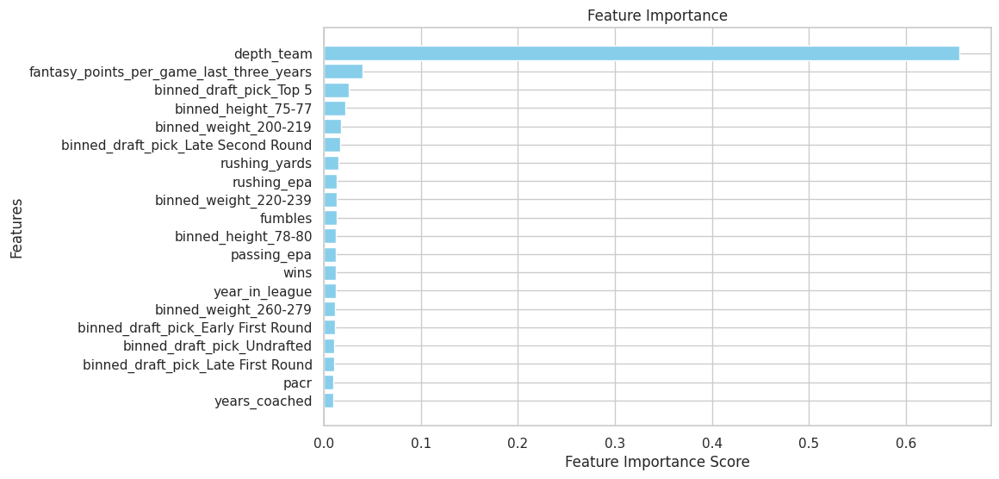

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Root Mean Squared Error: 77.92751385917497
R-squared: 0.5618980271619036


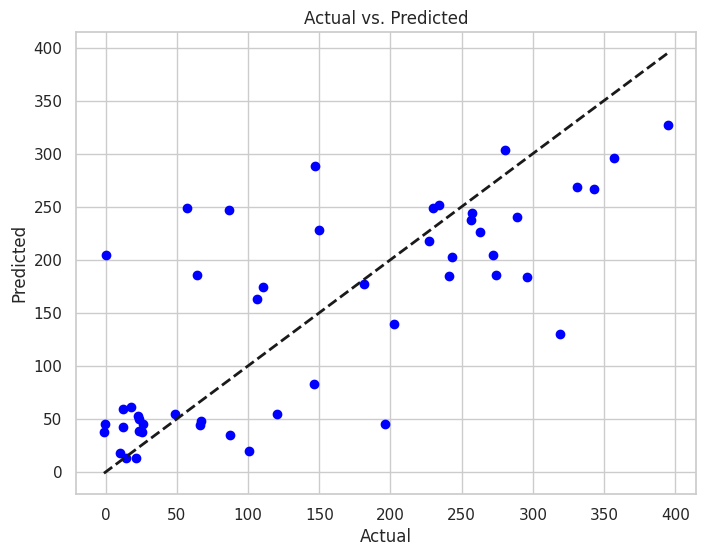

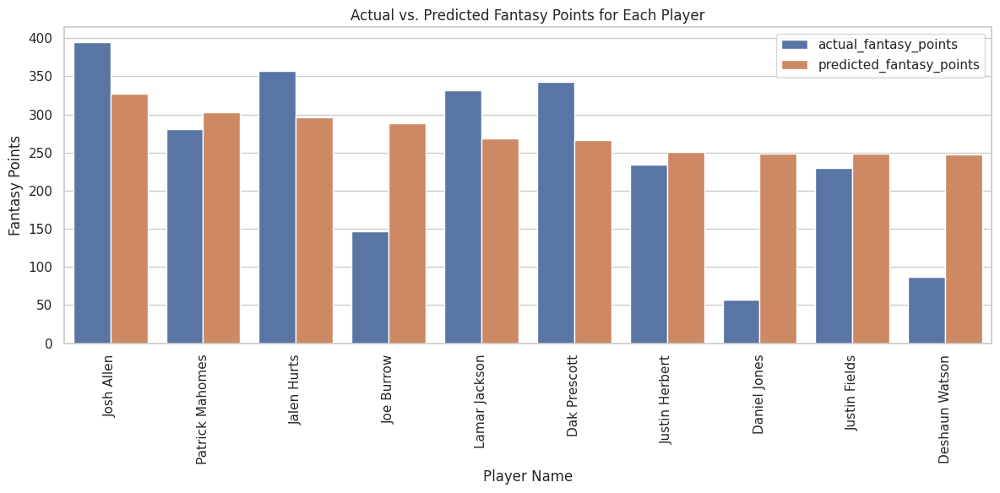

In [ ]:
xgb_veteran_results, best_xgb_veteran = xgboost(train_X, test_X, train_y, test_y, test_ids_veteran)

In [ ]:
# Results for XGBoost
results = pd.concat([xgb_rookie_results, xgb_veteran_results], ignore_index=True)

# Rank based on actual and predictive performance, best way to gauge accuracy
results['actual_points_rank'] = results['actual_fantasy_points'].rank(ascending=False)
results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
results = results.sort_values('predicted_fantasy_points',ascending=False)

results.sort_values('predicted_fantasy_points',ascending=False).head(60)

,player_id,player_name,actual_fantasy_points,predicted_fantasy_points,actual_points_rank,predicted_points_rank
6,00-0034857,Josh Allen,394.64,327.022491,1.0,1.0
7,00-0033873,Patrick Mahomes,280.22,303.085114,8.0,2.0
8,00-0036389,Jalen Hurts,356.82,296.045837,2.0,3.0
9,00-0036442,Joe Burrow,147.16,288.361877,25.0,4.0
10,00-0034796,Lamar Jackson,331.22,268.807922,4.0,5.0
11,00-0033077,Dak Prescott,342.84,266.810699,3.0,6.0
12,00-0036355,Justin Herbert,234.16,251.334015,17.0,7.0
13,00-0035710,Daniel Jones,56.96,248.425079,40.0,8.0
14,00-0036945,Justin Fields,230.18,248.300491,18.0,9.0
15,00-0033537,Deshaun Watson,86.80,247.339569,35.0,10.0


### Gradient Boosting

In [ ]:
# Gradient Boosting Model
def gradientboosting(train_X, test_X, train_y, test_y, test_ids_names):
    gb = GradientBoostingRegressor(random_state=0)
    gb.fit(train_X,train_y)
    feature_importance = [(train_X.columns[i], item) for i, item in enumerate(gb.feature_importances_)]

    sorted_feature_importance = sorted(feature_importance, key=lambda x: x[1], reverse=True)
    for feature, importance in sorted_feature_importance:
        print("{0:s}: {1:.6f}".format(feature, importance))
    features = [feature[0] for feature in sorted_feature_importance]
    importance_scores = [feature[1] for feature in sorted_feature_importance]
    plt.figure(figsize=(10, 6))
    plt.barh(features[:20], importance_scores[:20], color='skyblue')
    plt.xlabel('Feature Importance Score')
    plt.ylabel('Features')
    plt.title('Feature Importance')
    plt.gca().invert_yaxis()  # Invert y-axis to show the most important features at the top
    plt.show()
    gb_params = {
      'max_depth':[2,3,4],
      'n_estimators':[20,30,35]
    }

    gb_grid = GridSearchCV(
      estimator = gb, param_grid =  gb_params, scoring="neg_mean_squared_error",cv=5,verbose=1
      )

    gb_grid.fit(train_X, train_y)

    # Get best estimator from grid search
    best_gb_reg = gb_grid.best_estimator_

    # Make predictions on test data
    Y_pred = best_gb_reg.predict(test_X)
    mse = mean_squared_error(test_y, Y_pred)


    # Evaluate performance

    rmse = np.sqrt(mse)
    r2 = r2_score(test_y, Y_pred)


    print("Root Mean Squared Error:", rmse)
    print("R-squared:", r2)

    prediction_scatterplot(test_y, Y_pred)

    results = pd.DataFrame({
    'player_id': test_ids_names['player_id'],
    'player_name': test_ids_names['player_name'],
    'actual_fantasy_points': test_y,
    'predicted_fantasy_points': Y_pred
    })

    results['actual_points_rank'] = results['actual_fantasy_points'].rank(ascending=False)
    results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
    results = results.sort_values('predicted_fantasy_points',ascending=False)
    top = results.head(10)

    top_predictions(top)
    #results.sort_values('predicted_fantasy_points',ascending=False)

    return results, best_gb_reg

depth_team: 0.474353
wins: 0.111636
binned_draft_pick_Early First Round: 0.093806
years_coached: 0.081918
binned_draft_pick_Top 5: 0.042480
binned_height_78-80: 0.037836
binned_weight_240-259: 0.030429
rushing_1000_yards: 0.020056
binned_height_72-74: 0.014584
first_position_pick: 0.014408
binned_draft_pick_Late Second Round: 0.012302
binned_draft_pick_Late Round: 0.011596
binned_draft_pick_Middle Round: 0.010113
binned_draft_pick_Late First Round: 0.008558
Receiving_1000_yards: 0.007795
binned_draft_pick_Third Round: 0.006776
binned_height_75-77: 0.005412
binned_weight_200-219: 0.004436
binned_draft_pick_Undrafted: 0.004311
binned_weight_220-239: 0.003734
binned_weight_260-279: 0.002366
binned_draft_pick_Early Second Round: 0.001095
binned_weight_160-179: 0.000000
binned_weight_180-199: 0.000000


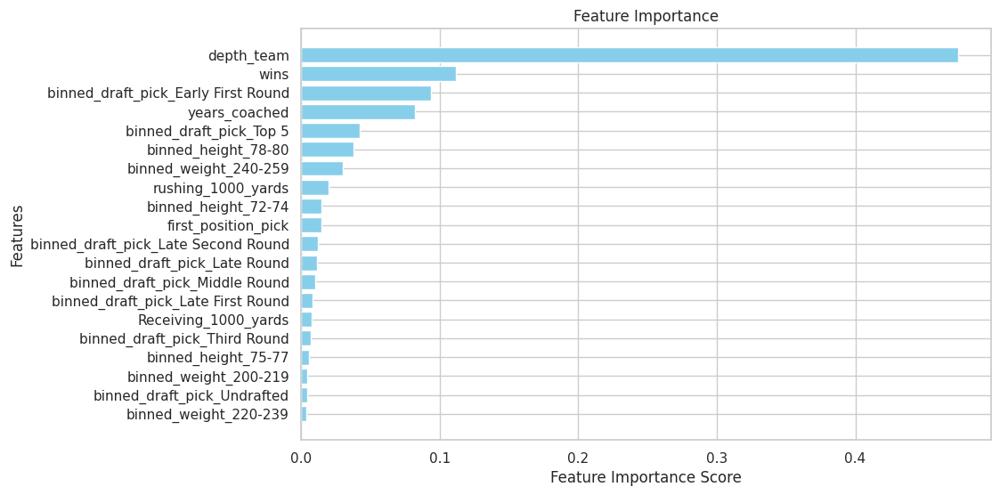

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Root Mean Squared Error: 83.68976721014234
R-squared: -0.5681987437723377


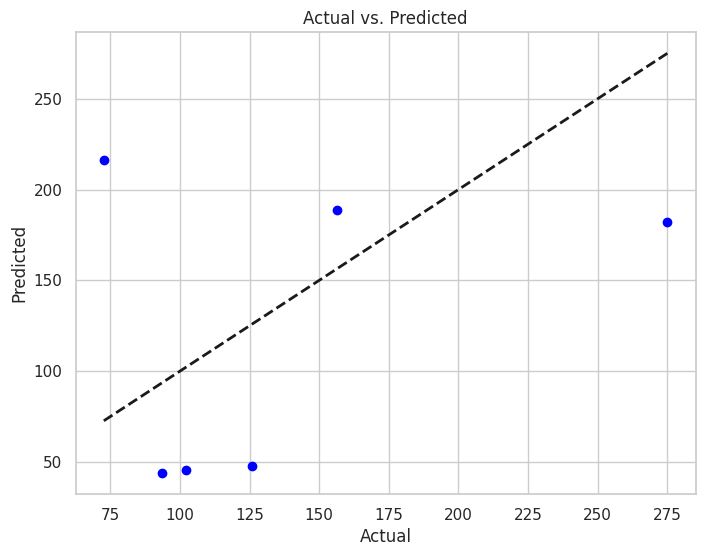

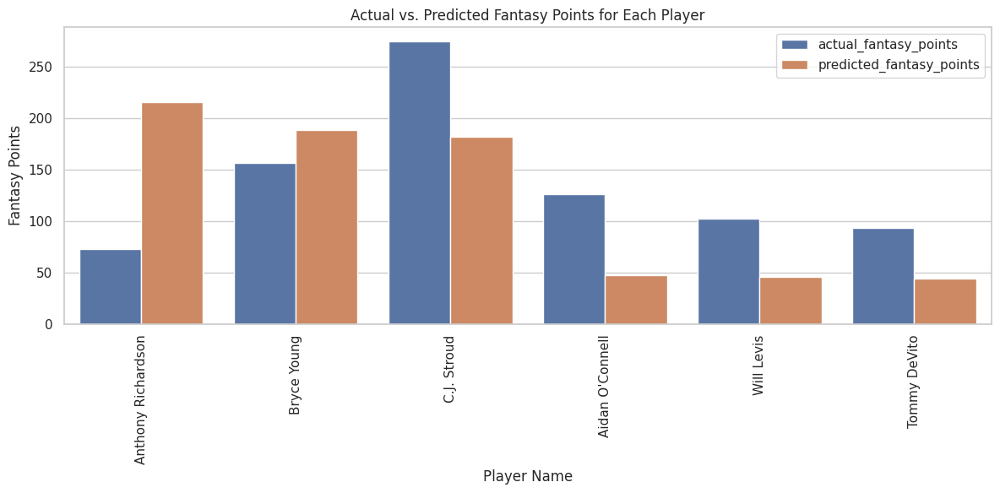

In [ ]:
gb_rookie_results, best_gb_rookie = gradientboosting(train_X_rok, test_X_rok, train_y_rok, test_y_rok, test_ids_rookie)

depth_team: 0.641704
fantasy_points_per_game_last_three_years: 0.135699
passing_epa: 0.049881
rushing_yards: 0.044435
rushing_epa: 0.032912
year_in_league: 0.025743
new_team: 0.014002
wins: 0.011826
years_coached: 0.007811
fumbles: 0.007718
pacr: 0.007424
binned_weight_260-279: 0.005259
binned_draft_pick_Top 5: 0.003638
binned_draft_pick_Late Second Round: 0.003339
binned_height_78-80: 0.001888
rushing_1000_yards: 0.001521
binned_draft_pick_Early Second Round: 0.001082
binned_weight_240-259: 0.001023
binned_weight_200-219: 0.000940
Receiving_1000_yards: 0.000520
binned_draft_pick_Early First Round: 0.000447
binned_draft_pick_Third Round: 0.000402
binned_draft_pick_Late First Round: 0.000239
binned_weight_220-239: 0.000211
binned_draft_pick_Late Round: 0.000117
binned_draft_pick_Middle Round: 0.000114
binned_height_72-74: 0.000105
binned_weight_160-179: 0.000000
binned_weight_180-199: 0.000000
binned_height_75-77: 0.000000
binned_draft_pick_Undrafted: 0.000000


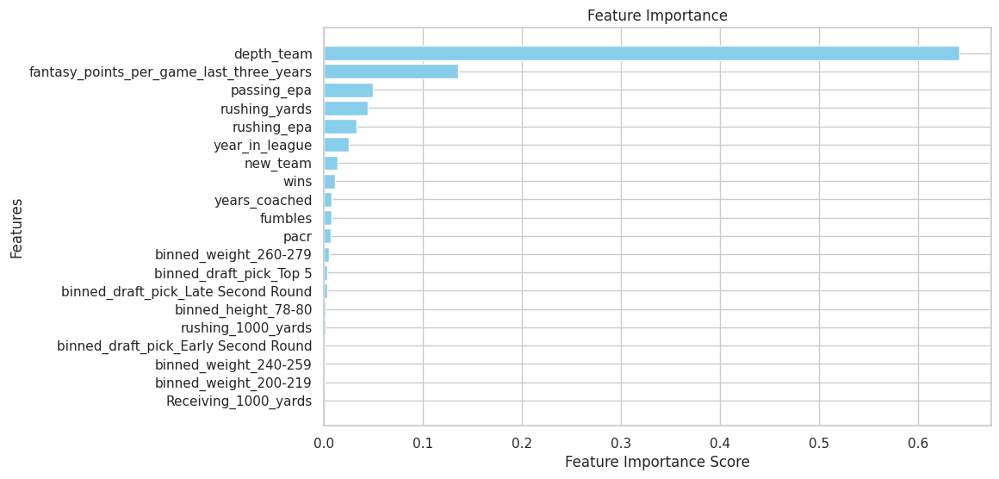

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Root Mean Squared Error: 79.29013910886022
R-squared: 0.5464429453770505


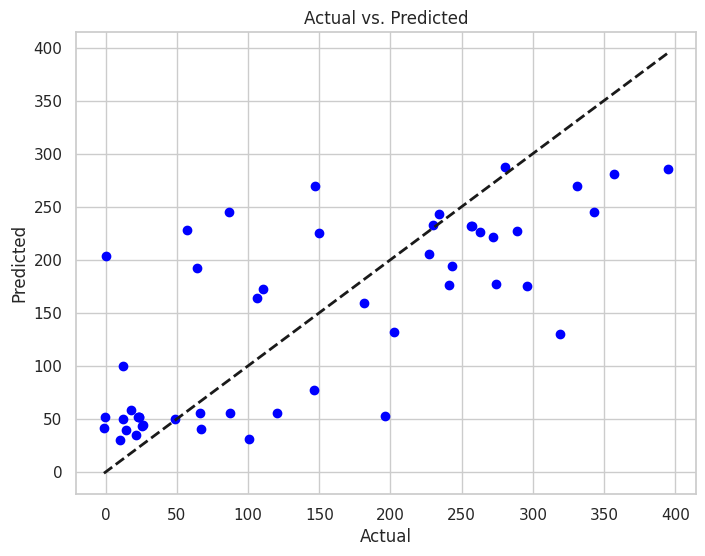

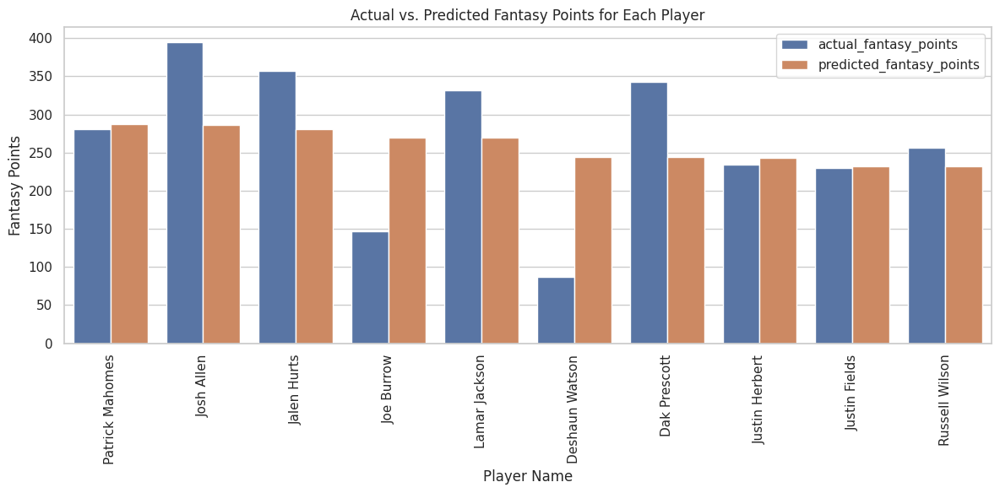

In [ ]:
gb_veteran_results, best_gb_veteran = gradientboosting(train_X, test_X, train_y, test_y, test_ids_veteran)

In [ ]:
results = pd.concat([gb_rookie_results, gb_veteran_results], ignore_index=True)

results['actual_points_rank'] = results['actual_fantasy_points'].rank(ascending=False)
results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
results = results.sort_values('predicted_fantasy_points',ascending=False)

results.sort_values('predicted_fantasy_points',ascending=False).head(60)

,player_id,player_name,actual_fantasy_points,predicted_fantasy_points,actual_points_rank,predicted_points_rank
6,00-0033873,Patrick Mahomes,280.22,286.940516,8.0,1.0
7,00-0034857,Josh Allen,394.64,285.958231,1.0,2.0
8,00-0036389,Jalen Hurts,356.82,280.927176,2.0,3.0
9,00-0036442,Joe Burrow,147.16,269.734356,25.0,4.0
10,00-0034796,Lamar Jackson,331.22,269.470681,4.0,5.0
11,00-0033537,Deshaun Watson,86.80,244.702468,35.0,6.0
12,00-0033077,Dak Prescott,342.84,244.562410,3.0,7.0
13,00-0036355,Justin Herbert,234.16,242.863990,17.0,8.0
14,00-0036945,Justin Fields,230.18,232.499058,18.0,9.0
15,00-0029263,Russell Wilson,256.90,232.204402,14.0,10.0


### Voting Regression

In [ ]:
# Voting regressor model
def votingregressor(xgb_results, gb_results, lasso_results,forest_results, test_ids_names, train_X, train_y, test_X, test_y):
    # Check lengths of test_y and test_ids_names
    if len(test_y) != len(test_ids_names):
        raise ValueError(f"Length mismatch: test_y has length {len(test_y)}, test_ids_names has length {len(test_ids_names)}")

    # Check lengths of predicted results
    if len(test_X) != len(test_y):
        raise ValueError(f"Length mismatch: test_X has length {len(test_X)}, test_y has length {len(test_y)}")

    regressors = [('XGBRegressor', xgb_results), ('GradientBoostingRegressor', gb_results), ('Lasso', lasso_results),('RandomForestRegressor',forest_results)]

    # Combining variables in a voting regression
    vr = VotingRegressor(estimators=regressors)
    vr.fit(train_X, train_y)
    Y_pred = vr.predict(test_X)

    # Check length of Y_pred
    if len(Y_pred) != len(test_y):
        raise ValueError(f"Length mismatch: Y_pred has length {len(Y_pred)}, test_y has length {len(test_y)}")

    mse = mean_squared_error(test_y, Y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(test_y, Y_pred)

    print("Root Mean Squared Error:", rmse)
    print("R-squared:", r2)

    prediction_scatterplot(test_y, Y_pred)

    results = pd.DataFrame({
        'player_id': test_ids_names['player_id'],
        'player_name': test_ids_names['player_name'],
        'actual_fantasy_points': test_y,
        'predicted_fantasy_points': Y_pred
    })

    results['actual_points_rank'] = results['actual_fantasy_points'].rank(ascending=False)
    results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
    results = results.sort_values('predicted_fantasy_points', ascending=False)
    top = results.head(10)

    top_predictions(top)

    return results

Root Mean Squared Error: 86.50837327564804
R-squared: -0.675608956071813


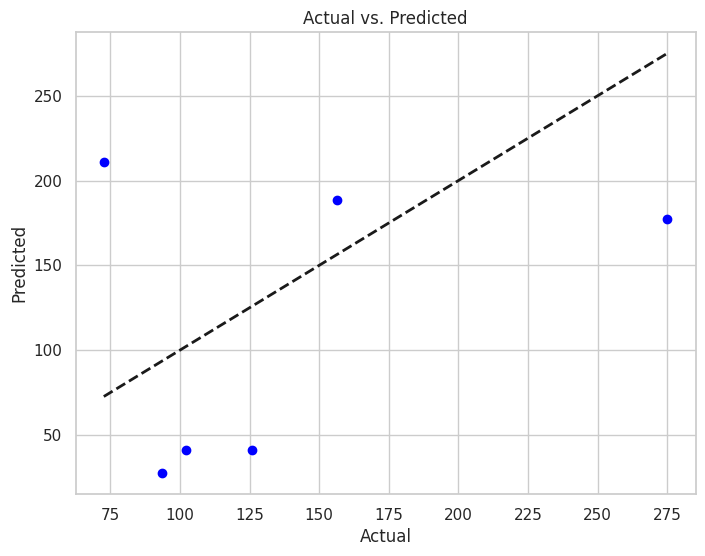

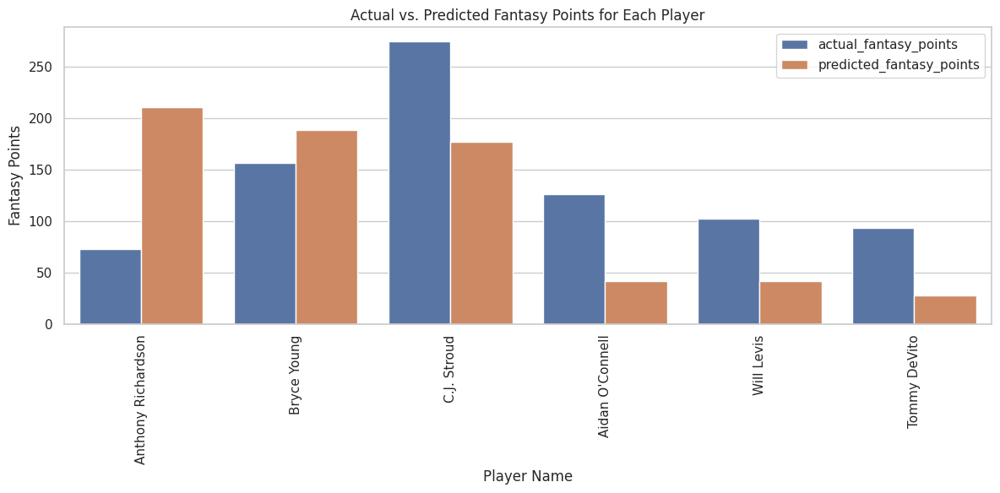

In [ ]:
rookie_results = votingregressor(best_xgb_rookie, best_gb_rookie, best_lasso_rookie, best_forest_rookie ,test_ids_rookie, train_X_rok, train_y_rok, test_X_rok, test_y_rok)

Root Mean Squared Error: 78.71811091912703
R-squared: 0.5529635934501299


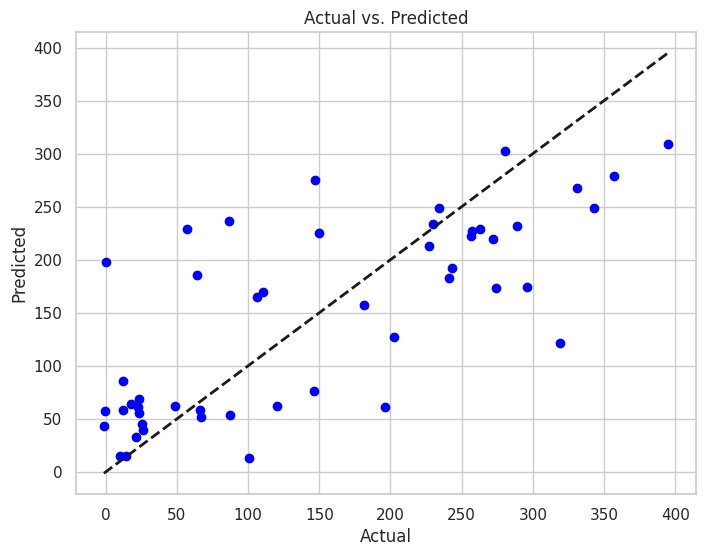

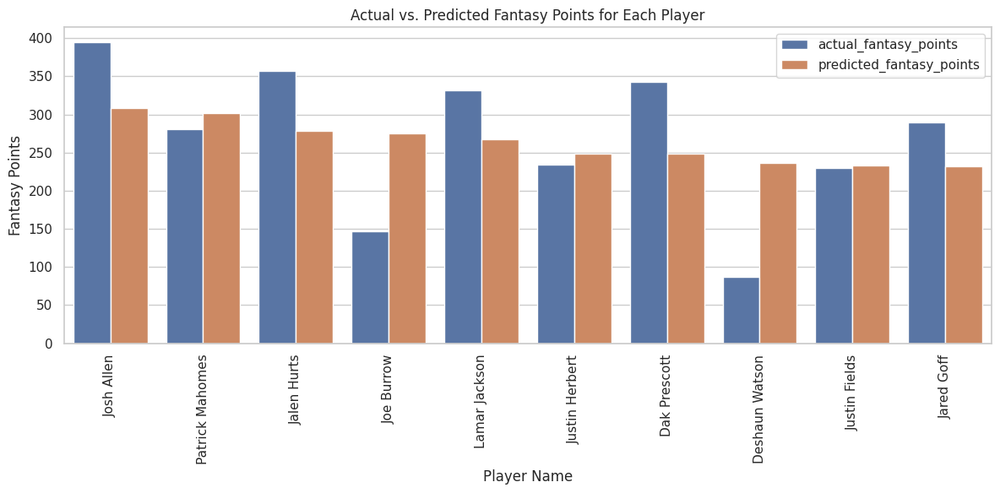

In [ ]:
veteran_results = votingregressor(best_xgb_veteran, best_gb_veteran,best_lasso_veteran,best_forest_veteran,test_ids_veteran, train_X, train_y, test_X, test_y)

In [ ]:
results = pd.concat([rookie_results, veteran_results], ignore_index=True)

results['actual_points_rank'] = results['actual_fantasy_points'].rank(ascending=False)
results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
results = results.sort_values('predicted_fantasy_points',ascending=False)

results.sort_values('predicted_fantasy_points',ascending=False).head(60)

,player_id,player_name,actual_fantasy_points,predicted_fantasy_points,actual_points_rank,predicted_points_rank
6,00-0034857,Josh Allen,394.64,308.689074,1.0,1.0
7,00-0033873,Patrick Mahomes,280.22,302.243398,8.0,2.0
8,00-0036389,Jalen Hurts,356.82,278.566982,2.0,3.0
9,00-0036442,Joe Burrow,147.16,275.083503,25.0,4.0
10,00-0034796,Lamar Jackson,331.22,267.459262,4.0,5.0
11,00-0036355,Justin Herbert,234.16,249.141187,17.0,6.0
12,00-0033077,Dak Prescott,342.84,248.384983,3.0,7.0
13,00-0033537,Deshaun Watson,86.80,236.269163,35.0,8.0
14,00-0036945,Justin Fields,230.18,233.345054,18.0,9.0
15,00-0033106,Jared Goff,289.10,231.760492,7.0,10.0


### Rookie Testing

In [ ]:
# Lasso model for cross validation testing
def lasso_results(train_X, test_X, train_y, test_y, params_list, r2_list, rmse_list, top_list, top_num, top_list2, top_num2):
    # Feature Scaling
    scaler = StandardScaler()
    train_X_scaled = scaler.fit_transform(train_X)
    test_X_scaled = scaler.transform(test_X)

    # Initialize the Lasso model
    lasso = Lasso(random_state=0)

    # Define a grid of hyperparameters to search
    param_grid = {'alpha': [0.1,0.5, 0.8, 1, 3, 5]}

    # Perform Grid Search with cross-validation
    grid_search = GridSearchCV(estimator=lasso, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5, verbose=1)
    grid_search.fit(train_X_scaled, train_y)

    # Get the best model from grid search
    best_lasso = grid_search.best_estimator_

    # Make predictions on the test set
    y_pred = best_lasso.predict(test_X_scaled)

    mse = mean_squared_error(test_y, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(test_y, y_pred)

    pred_results = pd.DataFrame({
        'actual_fantasy_points': test_y,
        'predicted_fantasy_points': y_pred,
    })

    pred_results['actual_points_rank'] = pred_results['actual_fantasy_points'].rank(ascending=False)
    pred_results['predicted_points_rank'] = pred_results['predicted_fantasy_points'].rank(ascending=False)
    pred_results = pred_results.sort_values('predicted_fantasy_points', ascending=False)

    # Find out how accurate model is at guessing top X players
    top_actual = set(pred_results.nsmallest(top_num, 'actual_points_rank').index)
    top_predicted = set(pred_results.nsmallest(top_num, 'predicted_points_rank').index)
    top_correct = len(top_actual.intersection(top_predicted))

    top_actual2 = set(pred_results.nsmallest(top_num2, 'actual_points_rank').index)
    top_predicted2 = set(pred_results.nsmallest(top_num2, 'predicted_points_rank').index)
    top_correct2 = len(top_actual2.intersection(top_predicted2))

    # Add to main list
    params_list.append(grid_search.best_params_)
    r2_list.append(r2)
    rmse_list.append(rmse)
    top_list.append(top_correct/top_num)
    top_list2.append(top_correct2/top_num2)

    return best_lasso


In [ ]:
#random forest model for cross validation testing
def randomforest_results(train_X, test_X, train_y, test_y, params_list, r2_list, rmse_list, top_list, top_num, top_list2, top_num2):

    forest_params = {
    'n_estimators': [200,250,300,350],
    'max_depth': [3,4,5]
    }

    forest_grid = GridSearchCV(
      estimator = RandomForestRegressor(random_state=0), param_grid =  forest_params, scoring="neg_mean_squared_error",cv=5,verbose=1
    )
    forest_grid.fit(train_X, train_y)

    # Get best estimator from grid search
    best_forest_reg = forest_grid.best_estimator_

    # Make predictions on test data
    pred_y = best_forest_reg.predict(test_X)

    # Evaluating the model
    mse = mean_squared_error(test_y, pred_y)
    rmse = np.sqrt(mse)

    r2 = r2_score(test_y, pred_y)

    # Prepare DataFrame to show predictions with player information
    pred_results = pd.DataFrame({
        'actual_fantasy_points': test_y,
        'predicted_fantasy_points': pred_y,
    })

    pred_results['actual_points_rank'] = pred_results['actual_fantasy_points'].rank(ascending=False)
    pred_results['predicted_points_rank'] = pred_results['predicted_fantasy_points'].rank(ascending=False)
    pred_results = pred_results.sort_values('predicted_fantasy_points', ascending=False)

    # Find out how accurate model is at guessing top X players
    top_actual = set(pred_results.nsmallest(top_num, 'actual_points_rank').index)
    top_predicted = set(pred_results.nsmallest(top_num, 'predicted_points_rank').index)
    top_correct = len(top_actual.intersection(top_predicted))

    top_actual2 = set(pred_results.nsmallest(top_num2, 'actual_points_rank').index)
    top_predicted2 = set(pred_results.nsmallest(top_num2, 'predicted_points_rank').index)
    top_correct2 = len(top_actual2.intersection(top_predicted2))

    # Add to main list
    params_list.append(forest_grid.best_params_)
    r2_list.append(r2)
    rmse_list.append(rmse)
    top_list.append(top_correct/top_num)
    top_list2.append(top_correct2/top_num2)

    return best_forest_reg


In [ ]:
#XGBoost model for cross validation testing
def xgboost_results(train_X, test_X, train_y, test_y, params_list, r2_list, rmse_list, top_list, top_num, top_list2, top_num2):
    xg_reg = xgb.XGBRegressor(objective = "reg:squarederror",random_state=0)

    xgb_params = {
    'n_estimators': [10,15,20],
    'max_depth': [2,3,4]
    }

    xgb_grid = GridSearchCV(
      estimator = xg_reg, param_grid =  xgb_params, scoring="neg_mean_squared_error",cv=5,verbose=1
    )
    xgb_grid.fit(train_X, train_y)

    # Get best estimator from grid search
    best_xgb_reg = xgb_grid.best_estimator_

    # Make predictions on test data
    pred_y = best_xgb_reg.predict(test_X)
    mse = mean_squared_error(test_y, pred_y)
    rmse = np.sqrt(mse)
    r2 = r2_score(test_y, pred_y)

    pred_results = pd.DataFrame({
        'actual_fantasy_points': test_y,
        'predicted_fantasy_points': pred_y,
    })

    pred_results['actual_points_rank'] = pred_results['actual_fantasy_points'].rank(ascending=False)
    pred_results['predicted_points_rank'] = pred_results['predicted_fantasy_points'].rank(ascending=False)
    pred_results = pred_results.sort_values('predicted_fantasy_points', ascending=False)

    # Find out how accurate model is at guessing top X players
    top_actual = set(pred_results.nsmallest(top_num, 'actual_points_rank').index)
    top_predicted = set(pred_results.nsmallest(top_num, 'predicted_points_rank').index)
    top_correct = len(top_actual.intersection(top_predicted))

    top_actual2 = set(pred_results.nsmallest(top_num2, 'actual_points_rank').index)
    top_predicted2 = set(pred_results.nsmallest(top_num2, 'predicted_points_rank').index)
    top_correct2 = len(top_actual2.intersection(top_predicted2))

    # Add to main list
    params_list.append(xgb_grid.best_params_)
    r2_list.append(r2)
    rmse_list.append(rmse)
    top_list.append(top_correct/top_num)
    top_list2.append(top_correct2/top_num2)

    return best_xgb_reg

In [ ]:
# Gradient Boosting model for cross validation testing
def gb_results(train_X, test_X, train_y, test_y, params_list, r2_list, rmse_list, top_list, top_num, top_list2, top_num2):
    gb = GradientBoostingRegressor(random_state=0)
    gb_params = {
    'n_estimators': [30,40,50,60],
    'max_depth': [2,3]
    }

    gb_grid = GridSearchCV(
      estimator = gb, param_grid =  gb_params, scoring="neg_mean_squared_error",cv=5,verbose=1
      )

    gb_grid.fit(train_X, train_y)

    # Get best estimator from grid search
    best_gb_reg = gb_grid.best_estimator_

    # Make predictions on test data
    pred_y = best_gb_reg.predict(test_X)
    mse = mean_squared_error(test_y, pred_y)

    # Evaluate performance

    rmse = np.sqrt(mse)
    r2 = r2_score(test_y, pred_y)

    pred_results = pd.DataFrame({
        'actual_fantasy_points': test_y,
        'predicted_fantasy_points': pred_y,
    })

    pred_results['actual_points_rank'] = pred_results['actual_fantasy_points'].rank(ascending=False)
    pred_results['predicted_points_rank'] = pred_results['predicted_fantasy_points'].rank(ascending=False)
    pred_results = pred_results.sort_values('predicted_fantasy_points', ascending=False)

    # Find out how accurate model is at guessing top X players
    top_actual = set(pred_results.nsmallest(top_num, 'actual_points_rank').index)
    top_predicted = set(pred_results.nsmallest(top_num, 'predicted_points_rank').index)
    top_correct = len(top_actual.intersection(top_predicted))

    top_actual2 = set(pred_results.nsmallest(top_num2, 'actual_points_rank').index)
    top_predicted2 = set(pred_results.nsmallest(top_num2, 'predicted_points_rank').index)
    top_correct2 = len(top_actual2.intersection(top_predicted2))

    # Add to main list
    params_list.append(gb_grid.best_params_)
    r2_list.append(r2)
    rmse_list.append(rmse)
    top_list.append(top_correct/top_num)
    top_list2.append(top_correct2/top_num2)

    return best_gb_reg

In [ ]:
# Voting Regressor model for cross validation testing
def evaluate_voting_regressor(combination, train_X, test_X, train_y, test_y):
    vr = VotingRegressor(estimators=list(combination))  # Convert tuple to list
    vr.fit(train_X, train_y)
    pred_y = vr.predict(test_X)
    mse = mean_squared_error(test_y, pred_y)
    rmse = np.sqrt(mse)
    return rmse

def hypertune_voting_regressor(xgb_results, gb_results, lasso_results, forest_results,
                               train_X, test_X, train_y, test_y, params_list, r2_list, rmse_list, top_list, top_num, top_list2, top_num2):
    regressors = [('XGBRegressor', xgb_results), ('GradientBoostingRegressor', gb_results),
                  ('Lasso', lasso_results), ('RandomForestRegressor', forest_results)]
    best_rmse = np.inf
    best_combination = None

    for i in range(2, len(regressors) + 1):  # Try combinations of 2, 3, and 4 models
        for combination in itertools.combinations(regressors, i):
            rmse = evaluate_voting_regressor(combination, train_X, test_X, train_y, test_y)
            if rmse < best_rmse:
                best_rmse = rmse
                best_combination = combination

    vr = VotingRegressor(estimators=list(best_combination))  # Convert tuple to list
    vr.fit(train_X, train_y)
    pred_y = vr.predict(test_X)

    mse = mean_squared_error(test_y, pred_y)
    rmse = np.sqrt(mse)
    r2 = r2_score(test_y, pred_y)

    pred_results = pd.DataFrame({
        'actual_fantasy_points': test_y,
        'predicted_fantasy_points': pred_y,
    })

    pred_results['actual_points_rank'] = pred_results['actual_fantasy_points'].rank(ascending=False)
    pred_results['predicted_points_rank'] = pred_results['predicted_fantasy_points'].rank(ascending=False)
    pred_results = pred_results.sort_values('predicted_fantasy_points', ascending=False)

    # Find out how accurate model is at guessing top X players
    top_actual = set(pred_results.nsmallest(top_num, 'actual_points_rank').index)
    top_predicted = set(pred_results.nsmallest(top_num, 'predicted_points_rank').index)
    top_correct = len(top_actual.intersection(top_predicted))

    top_actual2 = set(pred_results.nsmallest(top_num2, 'actual_points_rank').index)
    top_predicted2 = set(pred_results.nsmallest(top_num2, 'predicted_points_rank').index)
    top_correct2 = len(top_actual2.intersection(top_predicted2))

    # Add to main list
    params_list.append([name for name, _ in best_combination])
    r2_list.append(r2)
    rmse_list.append(rmse)
    top_list.append(top_correct/top_num)
    top_list2.append(top_correct2/top_num2)

    print(f"Best combination: {[name for name, _ in best_combination]}")
    print(f"Best RMSE: {best_rmse}")

In [ ]:
# Lists that will become columns in dataframe
model = []
qb_rok_params = []
qb_rok_r2 = []
qb_rok_rmse = []
qb_rok_top3_percent = []
qb_rok_top1_percent = []

In [ ]:
# Run each model on each of the past 5 years to figure out which is best model to use
rookie_qb_df = qb_df[qb_df['year_in_league']==1]
rookie_qb_df.drop(columns=[
       'new_team','passing_epa',
       'pacr', 'rushing_yards',
       'rushing_epa', 'fumbles',
       'fantasy_points_per_game_last_three_years'],inplace=True)

test_years = [2023, 2022, 2021, 2020, 2019]
for test_year in test_years:

  train_rookie = rookie_qb_df[rookie_qb_df['season']<test_year]
  test_rookie = rookie_qb_df[rookie_qb_df['season']==test_year]

  train_X_rok = pd.get_dummies(train_rookie.drop(columns=['player_id','player_name',
                                                  'season','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
  train_y_rok = train_rookie['fantasy_points_ppr_next_season'].astype(float)
  test_X_rok = pd.get_dummies(test_rookie.drop(columns=['player_id','player_name',
                                                  'season','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
  test_y_rok = test_rookie['fantasy_points_ppr_next_season'].astype(float)
  test_X_rok = test_X_rok.reindex(columns=train_X_rok.columns, fill_value=0)

  model.append('lasso')
  rookie_lasso = lasso_results(train_X_rok, test_X_rok, train_y_rok, test_y_rok, qb_rok_params, qb_rok_r2, qb_rok_rmse, qb_rok_top3_percent,3, qb_rok_top1_percent,1)

  train_rookie = rookie_qb_df[rookie_qb_df['season']<test_year]
  test_rookie = rookie_qb_df[rookie_qb_df['season']==test_year]

  train_X_rok = pd.get_dummies(train_rookie.drop(columns=['player_id','player_name',
                                                  'season','fantasy_points_ppr_next_season']),drop_first=False).astype(float)
  train_y_rok = train_rookie['fantasy_points_ppr_next_season'].astype(float)
  test_X_rok = pd.get_dummies(test_rookie.drop(columns=['player_id','player_name',
                                                  'season','fantasy_points_ppr_next_season']),drop_first=False).astype(float)
  test_y_rok = test_rookie['fantasy_points_ppr_next_season'].astype(float)
  test_X_rok = test_X_rok.reindex(columns=train_X_rok.columns, fill_value=0)

  model.append('random forest')
  rookie_forest = randomforest_results(train_X_rok, test_X_rok, train_y_rok, test_y_rok, qb_rok_params, qb_rok_r2, qb_rok_rmse, qb_rok_top3_percent,3,qb_rok_top1_percent,1)
  model.append('xgb')
  rookie_xgb = xgboost_results(train_X_rok, test_X_rok, train_y_rok, test_y_rok, qb_rok_params, qb_rok_r2, qb_rok_rmse, qb_rok_top3_percent,3, qb_rok_top1_percent,1)
  model.append('gb')
  rookie_gb = gb_results(train_X_rok, test_X_rok, train_y_rok, test_y_rok, qb_rok_params, qb_rok_r2, qb_rok_rmse, qb_rok_top3_percent,3, qb_rok_top1_percent,1)
  model.append('voting regressor')
  hypertune_voting_regressor(rookie_xgb, rookie_gb, rookie_lasso, rookie_forest,
                            train_X_rok, test_X_rok, train_y_rok, test_y_rok, qb_rok_params, qb_rok_r2, qb_rok_rmse, qb_rok_top3_percent,3, qb_rok_top1_percent,1)

<ipython-input-788-9dfd9f58a666>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rookie_qb_df.drop(columns=[


Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best combination: ['GradientBoostingRegressor', 'Lasso']
Best RMSE: 80.56264489531344
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best combination: ['GradientBoostingRegressor', 'RandomForestRegressor']
Best RMSE: 74.95220818797269
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best combination: ['GradientBoostingRegressor', 'Lasso']
Best RMSE: 45.20909016804461
Fit

In [ ]:
qb_rookie_results = pd.DataFrame({
    'model' : model,
    'params': qb_rok_params,
    'R2' : qb_rok_r2,
    'RMSE' : qb_rok_rmse,
    'Top 3 Accuracy' : qb_rok_top3_percent
})

qb_rookie_results.head(60)

,model,params,R2,RMSE,Top 3 Accuracy
0,lasso,{'alpha': 5},-0.710237,87.397697,0.666667
1,random forest,"{'max_depth': 3, 'n_estimators': 350}",-1.248569,100.213205,0.666667
2,xgb,"{'max_depth': 4, 'n_estimators': 10}",-1.706597,109.947047,0.666667
3,gb,"{'max_depth': 2, 'n_estimators': 30}",-0.713974,87.493113,0.666667
4,voting regressor,"[GradientBoostingRegressor, Lasso]",-0.453195,80.562645,0.666667
5,lasso,{'alpha': 0.8},-1.858055,88.952265,0.666667
6,random forest,"{'max_depth': 4, 'n_estimators': 350}",-1.064432,75.600034,0.666667
7,xgb,"{'max_depth': 4, 'n_estimators': 10}",-1.130304,76.796683,0.666667
8,gb,"{'max_depth': 3, 'n_estimators': 30}",-1.003633,74.478470,0.666667
9,voting regressor,"[GradientBoostingRegressor, RandomForestRegres...",-1.029203,74.952208,0.666667


In [ ]:
agg_results = qb_rookie_results.groupby('model')[['RMSE', 'R2', 'Top 3 Accuracy']].agg(['mean', 'median', 'std'])

# Sorting by the 'median' of any of the metrics (e.g., 'RMSE')
sorted_results = agg_results.sort_values(by=('RMSE', 'mean'), ascending=True)

sorted_results

# Voting Regressor seemed to be to best for rookie qbs and it usually contained gb and lasso models

RMSE                               R2            \
                       mean      median        std      mean    median   
model                                                                    
voting regressor  79.090135   80.562645  21.464841 -0.352302 -0.453195   
gb                82.944008   87.493113  22.679125 -0.477762 -0.713974   
lasso             82.996203   88.952265  24.543194 -0.517951 -0.343698   
random forest     86.909279  100.213205  21.236107 -0.704862 -1.064432   
xgb               88.950981  101.657368  23.130131 -0.798195 -1.130304   

                           Top 3 Accuracy                      
                       std           mean    median       std  
model                                                          
voting regressor  0.532020       0.733333  0.666667  0.149071  
gb                0.536457       0.733333  0.666667  0.149071  
lasso             0.834676       0.733333  0.666667  0.149071  
random forest     0.746746       0.733333  0.666667  0.149071  
xgb               0.848944       0.733333  0.666667  0.149071

### Veteran Testing

In [ ]:
model = []
qb_params = []
qb_r2 = []
qb_rmse = []
qb_top10_percent = []
qb_top20_percent = []

In [ ]:
# Run each model on each of the past 5 years to figure out which is best model to use
test_years = [2023, 2022, 2021, 2020, 2019]
for test_year in test_years:

  train_qb = qb_df[qb_df['season']<test_year].dropna(axis = 0)
  test_qb = qb_df[qb_df['season']==test_year].dropna(axis = 0)

  train_X = pd.get_dummies(train_qb.drop(columns=['player_id', 'player_name', 'season', 'fantasy_points_ppr_next_season', 'first_position_pick']), drop_first=True).astype(float)
  train_y = train_qb['fantasy_points_ppr_next_season'].astype(float)
  test_X = pd.get_dummies(test_qb.drop(columns=['player_id', 'player_name', 'season', 'fantasy_points_ppr_next_season', 'first_position_pick']), drop_first=True).astype(float)
  test_y = test_qb['fantasy_points_ppr_next_season'].astype(float)
  test_X = test_X.reindex(columns=train_X.columns, fill_value=0)

  model.append('lasso')
  veteran_lasso = lasso_results(train_X, test_X, train_y, test_y, qb_params, qb_r2, qb_rmse, qb_top10_percent,10, qb_top20_percent,20)

  train_qb = qb_df[qb_df['season']<test_year].dropna(axis = 0)
  test_qb = qb_df[qb_df['season']==test_year].dropna(axis = 0)

  train_X = pd.get_dummies(train_qb.drop(columns=['player_id', 'player_name', 'season', 'fantasy_points_ppr_next_season', 'first_position_pick']), drop_first=False).astype(float)
  train_y = train_qb['fantasy_points_ppr_next_season'].astype(float).values.ravel()
  test_X = pd.get_dummies(test_qb.drop(columns=['player_id', 'player_name', 'season', 'fantasy_points_ppr_next_season', 'first_position_pick']), drop_first=False).astype(float)
  test_y = test_qb['fantasy_points_ppr_next_season'].astype(float).values.ravel()
  test_X = test_X.reindex(columns=train_X.columns, fill_value=0)
  model.append('random forest')

  veteran_forest = randomforest_results(train_X, test_X, train_y, test_y, qb_params, qb_r2, qb_rmse, qb_top10_percent,10, qb_top20_percent,20)
  model.append('xgb')
  veteran_xgb = xgboost_results(train_X, test_X, train_y, test_y, qb_params, qb_r2, qb_rmse, qb_top10_percent,10, qb_top20_percent,20)
  model.append('gb')
  veteran_gb = gb_results(train_X, test_X, train_y, test_y, qb_params, qb_r2, qb_rmse, qb_top10_percent,10, qb_top20_percent,20)
  model.append('voting')
  hypertune_voting_regressor(veteran_xgb, veteran_gb, veteran_lasso, veteran_forest,
                            train_X, test_X, train_y, test_y, qb_params, qb_r2, qb_rmse, qb_top10_percent,10, qb_top20_percent,20)


Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best combination: ['XGBRegressor', 'GradientBoostingRegressor']
Best RMSE: 79.20528802679186
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best combination: ['XGBRegressor', 'GradientBoostingRegressor']
Best RMSE: 75.22224942392677
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best combination: ['GradientBoostingRegressor', 'RandomForestRegressor']
Best RMSE: 67.1568

In [ ]:
qb_results = pd.DataFrame({
    'model' : model,
    'params': qb_params,
    'R2' : qb_r2,
    'RMSE' : qb_rmse,
    'Top 10 Accuracy' : qb_top10_percent,
    'Top 20 Accuracy' : qb_top20_percent
})

qb_results.head(60)

,model,params,R2,RMSE,Top 10 Accuracy,Top 20 Accuracy
0,lasso,{'alpha': 3},0.484610,84.522246,0.5,0.75
1,random forest,"{'max_depth': 4, 'n_estimators': 350}",0.501279,83.144205,0.5,0.75
2,xgb,"{'max_depth': 2, 'n_estimators': 10}",0.541165,79.750131,0.5,0.70
3,gb,"{'max_depth': 2, 'n_estimators': 40}",0.550251,78.956541,0.5,0.70
4,voting,"[XGBRegressor, GradientBoostingRegressor]",0.547413,79.205288,0.5,0.70
5,lasso,{'alpha': 3},0.568957,78.873066,0.3,0.75
6,random forest,"{'max_depth': 3, 'n_estimators': 300}",0.594371,76.512509,0.3,0.70
7,xgb,"{'max_depth': 2, 'n_estimators': 10}",0.605867,75.420564,0.2,0.70
8,gb,"{'max_depth': 2, 'n_estimators': 40}",0.607351,75.278398,0.4,0.75
9,voting,"[XGBRegressor, GradientBoostingRegressor]",0.607937,75.222249,0.4,0.75


In [ ]:
agg_results = qb_results.groupby('model')[['RMSE', 'R2', 'Top 10 Accuracy', 'Top 20 Accuracy']].agg(['mean', 'median', 'std'])

# Sorting by the 'median' of any of the metrics (e.g., 'RMSE')
sorted_results = agg_results.sort_values(by=('RMSE', 'mean'), ascending=True)

sorted_results

# Voting Regressor seemed to be to best for veteran qbs and it usually contained gb and xgb models

RMSE                             R2                      \
                    mean     median       std      mean    median       std   
model                                                                         
voting         76.290444  75.297575  6.375734  0.614023  0.607937  0.081370   
gb             76.774855  76.394142  6.633466  0.609254  0.607351  0.082513   
random forest  77.753843  76.512509  7.709067  0.597106  0.594371  0.100025   
xgb            77.892680  77.079752  5.154397  0.599276  0.605867  0.070549   
lasso          82.416504  84.522246  4.796308  0.552765  0.567759  0.064832   

              Top 10 Accuracy                  Top 20 Accuracy         \
                         mean median       std            mean median   
model                                                                   
voting                   0.50    0.5  0.070711            0.75   0.75   
gb                       0.48    0.5  0.083666            0.77   0.75   
random forest            0.48    0.5  0.109545            0.74   0.75   
xgb                      0.48    0.5  0.164317            0.74   0.75   
lasso                    0.50    0.5  0.122474            0.75   0.75   

                         
                    std  
model                    
voting         0.035355  
gb             0.057009  
random forest  0.041833  
xgb            0.041833  
lasso          0.035355

### 2024 Prediction

In [107]:
# Function to create bar chart for 2024 prediction outputs
def top_predictions_2024(results):
    melted_results = pd.melt(results, id_vars=['player_id', 'player_name'],
                         value_vars=['predicted_fantasy_points'],
                         var_name='Fantasy Points Type', value_name='Fantasy Points')

    sns.set(style="whitegrid")
    plt.figure(figsize=(12, 6))
    sns.barplot(x='player_name', y='Fantasy Points', hue='Fantasy Points Type', data=melted_results)
    plt.xlabel('Player Name')
    plt.ylabel('Fantasy Points')
    plt.title('Actual vs. Predicted Fantasy Points for Each Player')
    plt.xticks(rotation=90)
    plt.legend()
    plt.tight_layout()
    plt.show()

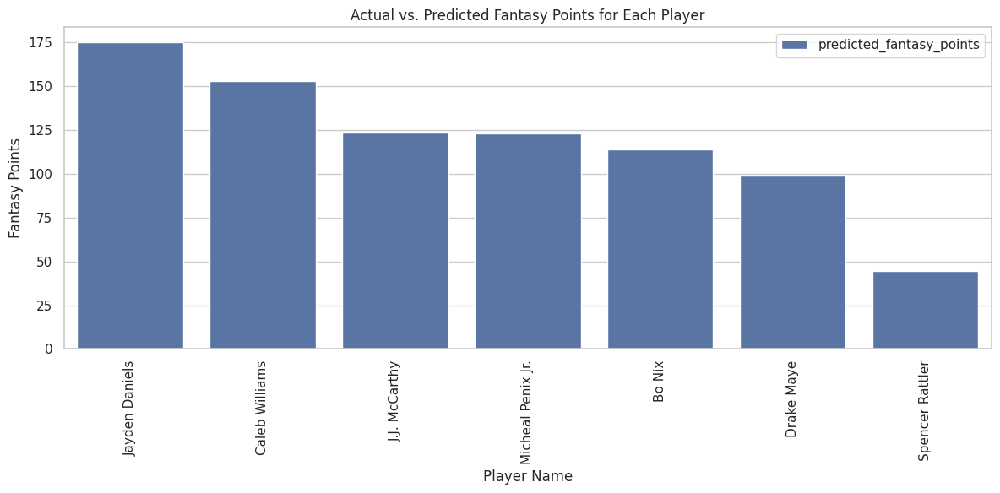

In [108]:
# Model to predict 2024 rookie qbs
train_rookie = rookie_qb_df[rookie_qb_df['season']<2024]
test_rookie = rookie_qb_df[rookie_qb_df['season']==2024]

train_ids_rookie = train_rookie[['player_id', 'player_name']]
test_ids_rookie = test_rookie[['player_id', 'player_name']]

train_X_rok = pd.get_dummies(train_rookie.drop(columns=['player_id','player_name',
                                                'season','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
train_y_rok = train_rookie['fantasy_points_ppr_next_season'].astype(float)
test_X_rok = pd.get_dummies(test_rookie.drop(columns=['player_id','player_name',
                                                'season','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
test_X_rok = test_X_rok.reindex(columns=train_X_rok.columns, fill_value=0)

# Most optimal parameters based on cross validation
vr = VotingRegressor(estimators=[
        ('lasso', Lasso(alpha=1)),
        ('gb', GradientBoostingRegressor(n_estimators=35, max_depth=2))
    ])

vr.fit(train_X_rok, train_y_rok)
pred_y = vr.predict(test_X_rok)

results = pd.DataFrame({
        'player_id': test_ids_rookie['player_id'],
        'player_name': test_ids_rookie['player_name'],
        'predicted_fantasy_points': pred_y
    })

results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
rookie_results = results.sort_values('predicted_fantasy_points', ascending=False)
top = rookie_results.head(10)

top_predictions_2024(top)

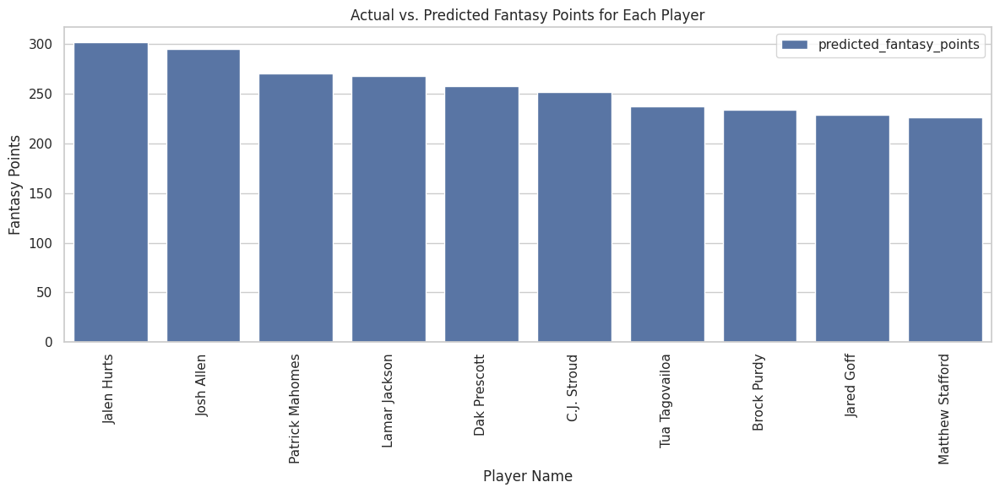

In [109]:
# Model to predict 2024 veteran qbs
train_qb = qb_df[(qb_df['season']<2024)&(qb_df['year_in_league']>1)].dropna(axis = 0)
test_qb = qb_df[(qb_df['season']==2024)&(qb_df['year_in_league']>1)]

# Saving player_id and player_name before dropping them
train_ids_veteran = train_qb[['player_id', 'player_name']]
test_ids_veteran = test_qb[['player_id', 'player_name']]

train_X = pd.get_dummies(train_qb.drop(columns=['player_id','player_name','season','fantasy_points_ppr_next_season','first_position_pick']),drop_first=False).astype(float)
train_y = train_qb['fantasy_points_ppr_next_season'].astype(float)
test_X = pd.get_dummies(test_qb.drop(columns=['player_id','player_name','season','fantasy_points_ppr_next_season','first_position_pick']),drop_first=False).astype(float)
test_X = test_X.reindex(columns=train_X.columns, fill_value=0)

# Most optimal parameters based on cross validation
vr = VotingRegressor(estimators=[
        ('xgb', xgb.XGBRegressor(n_estimators=10, max_depth=2)),
        ('gb', GradientBoostingRegressor(n_estimators=40, max_depth=2))
    ])

vr.fit(train_X, train_y)
pred_y = vr.predict(test_X)

results = pd.DataFrame({
        'player_id': test_ids_veteran['player_id'],
        'player_name': test_ids_veteran['player_name'],
        'predicted_fantasy_points': pred_y
    })

results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
veteran_results = results.sort_values('predicted_fantasy_points', ascending=False)
top = veteran_results.head(10)

top_predictions_2024(top)

In [110]:
# Display combined qb results
qb_results = pd.concat([rookie_results, veteran_results], ignore_index=True)

qb_results['predicted_points_rank'] = qb_results['predicted_fantasy_points'].rank(ascending=False)
qb_results = qb_results.sort_values('predicted_fantasy_points',ascending=False)

qb_results.sort_values('predicted_fantasy_points',ascending=False).head(60)

,player_id,player_name,predicted_fantasy_points,predicted_points_rank
7,00-0036389,Jalen Hurts,301.859507,1.0
8,00-0034857,Josh Allen,295.265898,2.0
9,00-0033873,Patrick Mahomes,270.519033,3.0
10,00-0034796,Lamar Jackson,268.170331,4.0
11,00-0033077,Dak Prescott,257.756532,5.0
12,00-0039163,C.J. Stroud,252.168540,6.0
13,00-0036212,Tua Tagovailoa,237.146821,7.0
14,00-0037834,Brock Purdy,233.818191,8.0
15,00-0033106,Jared Goff,228.452911,9.0
16,00-0026498,Matthew Stafford,226.498205,10.0


## Wide Receiver Analysis

### Regression

In [111]:
# Regression model for rookie wrs
rookie_wr_df = wr_df[wr_df['year_in_league']==1]
# Drop all columns that don't apply to rookies
rookie_wr_df.drop(columns=[
        'injury type','injury severity',
        'new_team', 'racr',
        'rushing_yards',
       'receiving_epa', 'fumbles',
       'fantasy_points_per_game_last_three_years','year_in_league','position'],inplace=True)

# Models were having issues predicting first round rookies, so the bottom fantasy football scores were removed for increased accuracy
rookie_wr_df = rookie_wr_df[~((rookie_wr_df['binned_draft_pick'].isin(['Top 5', 'Early First Round', 'Late First Round'])) &
                            (rookie_wr_df['fantasy_points_ppr_next_season'] < 50))]

train_rookie = rookie_wr_df[rookie_wr_df['season']<2023]
test_rookie = rookie_wr_df[rookie_wr_df['season']==2023]

train_ids_rookie = train_rookie[['player_id', 'player_name']]
test_ids_rookie = test_rookie[['player_id', 'player_name']]

train_X_rok = pd.get_dummies(train_rookie.drop(columns=['player_id','player_name',
                                                'season','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
train_y_rok = train_rookie['fantasy_points_ppr_next_season'].astype(float)
test_X_rok = pd.get_dummies(test_rookie.drop(columns=['player_id','player_name',
                                                'season','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
test_y_rok = test_rookie['fantasy_points_ppr_next_season'].astype(float)
test_X_rok = test_X_rok.reindex(columns=train_X_rok.columns, fill_value=0)

<ipython-input-111-fb8ebd42f8d2>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rookie_wr_df.drop(columns=[


Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best alpha: {'alpha': 1}
Root Mean Squared Error: 80.06100530875332
R-squared: -0.529674035040318
Selected Features and their coefficients:
                                Feature  Coefficient
15  binned_draft_pick_Early First Round     6.874904
16   binned_draft_pick_Late First Round     5.349374
6                   first_position_pick     5.213737
12                  binned_height_69-71     3.546972
9                 binned_weight_220-239     2.526272
18  binned_draft_pick_Late Second Round     1.849527
10                binned_weight_240-259     0.573569
8                 binned_weight_200-219    -0.087045
1                         QB_4000_yards    -0.820612
4                                  wins    -2.007541
20       binned_draft_pick_Middle Round    -6.227580
19        binned_draft_pick_Third Round    -8.285715
22          binned_draft_pick_Undrafted   -11.923511
21         binned_draft_pick_Late Round   -12.457447
5    

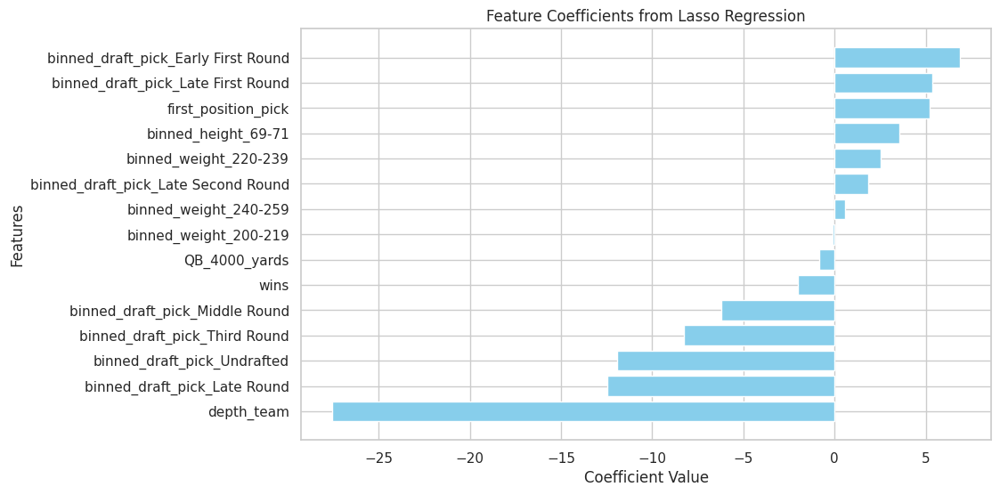

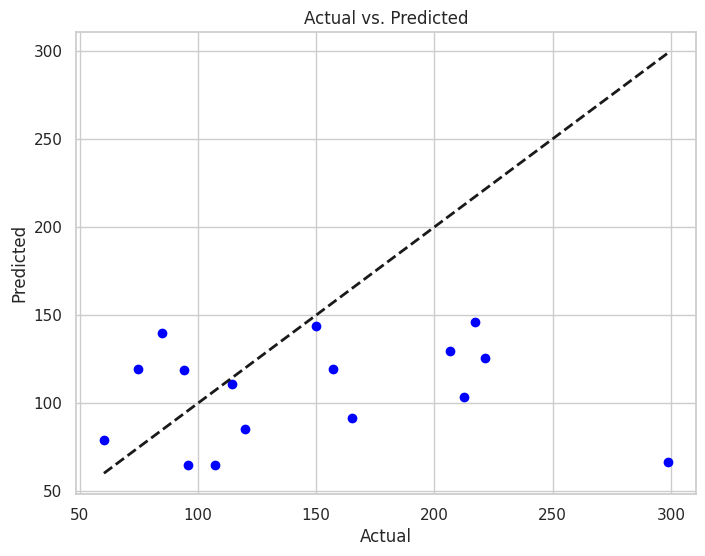

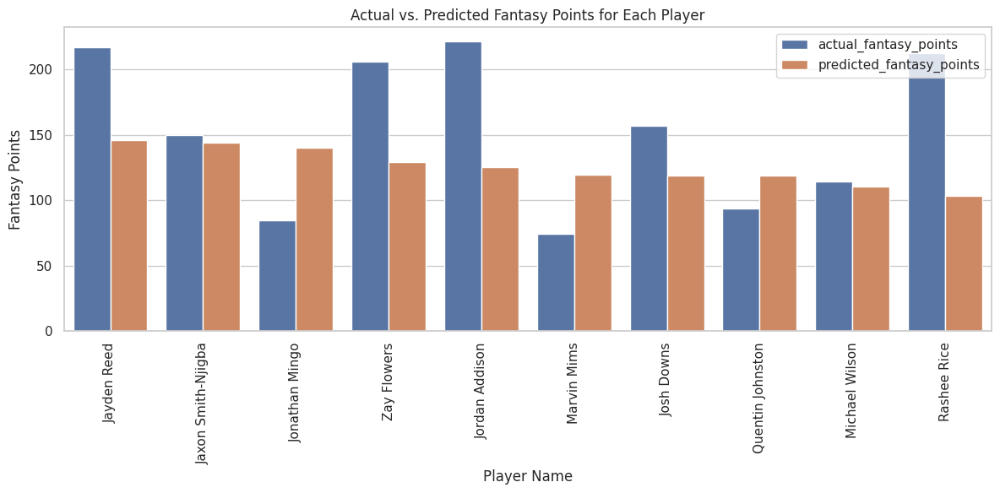

In [112]:
rookie_results, best_lasso_rookie = lasso_regression(train_X_rok, test_X_rok, train_y_rok, test_y_rok, test_ids_rookie)

In [113]:
train_wr = wr_df[(wr_df['season']!=2023)&(wr_df['year_in_league']>1)].dropna(axis = 0)
test_wr = wr_df[(wr_df['season']==2023)&(wr_df['year_in_league']>1)].dropna(axis = 0)

# Saving player_id and player_name before dropping them
train_ids_veteran = train_wr[['player_id', 'player_name']]
test_ids_veteran = test_wr[['player_id', 'player_name']]

train_X = pd.get_dummies(train_wr.drop(columns=['player_id','player_name','season','first_position_pick','fantasy_points_ppr_next_season','position']),drop_first=True).astype(float)
train_y = train_wr['fantasy_points_ppr_next_season'].astype(float)
test_X = pd.get_dummies(test_wr.drop(columns=['player_id','player_name','season','first_position_pick','fantasy_points_ppr_next_season','position']),drop_first=True).astype(float)
test_y = test_wr['fantasy_points_ppr_next_season'].astype(float)
test_X = test_X.reindex(columns=train_X.columns, fill_value=0)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best alpha: {'alpha': 1}
Root Mean Squared Error: 60.11413039644344
R-squared: 0.5815463998680477
Selected Features and their coefficients:
                                     Feature  Coefficient
12  fantasy_points_per_game_last_three_years    26.021184
5                receiving_yards_after_catch     9.387099
6                              receiving_epa     9.242006
18                           injury type_leg     2.502749
7                                    fumbles     1.944864
2                              QB_4000_yards     1.237112
26                     binned_weight_220-239     0.753939
33        binned_draft_pick_Late First Round     0.577434
9                                       wins     0.525108
20                      injury type_shoulder    -0.545100
37            binned_draft_pick_Middle Round    -0.585750
38              binned_draft_pick_Late Round    -0.627783
14                          injury type_foot  

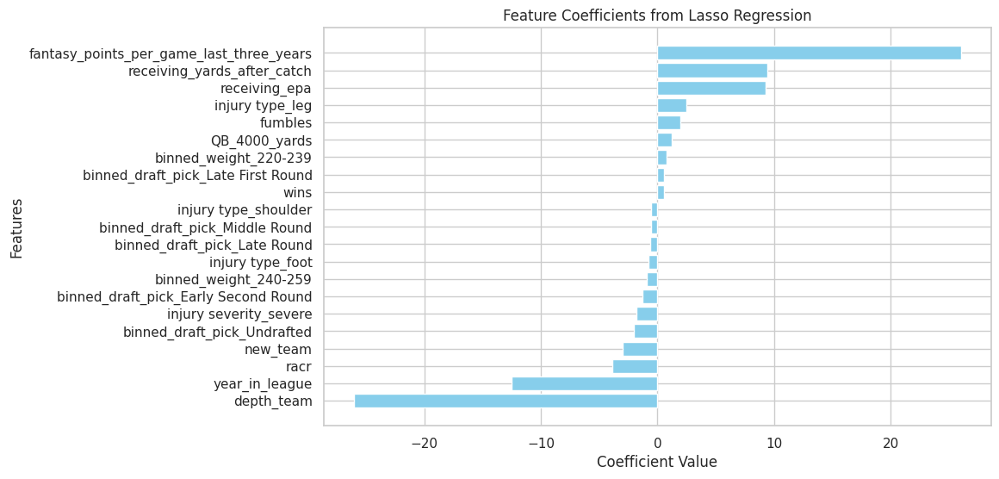

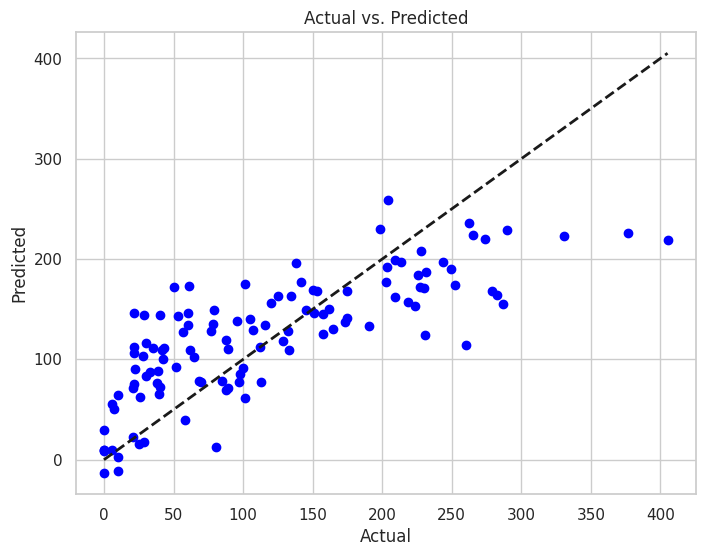

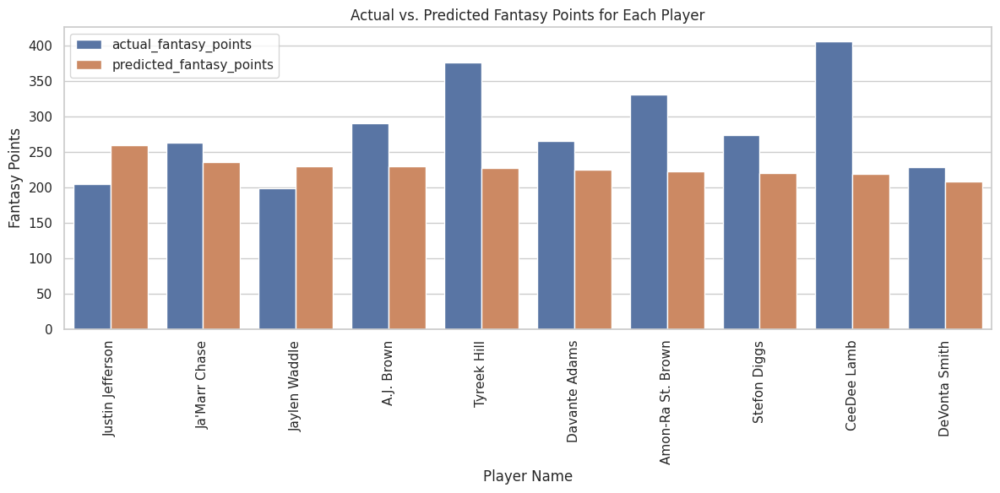

In [114]:
veteran_results, best_lasso_veteran = lasso_regression(train_X, test_X, train_y, test_y, test_ids_veteran)

In [ ]:
results = pd.concat([rookie_results, veteran_results], ignore_index=True)

results['actual_points_rank'] = results['actual_fantasy_points'].rank(ascending=False)
results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
results = results.sort_values('predicted_fantasy_points',ascending=False)

results.sort_values('predicted_fantasy_points',ascending=False).head(60)

,player_id,player_name,actual_fantasy_points,predicted_fantasy_points,actual_points_rank,predicted_points_rank
97,00-0036322,Justin Jefferson,204.20,259.148327,31.0,1.0
111,00-0036900,Ja'Marr Chase,262.72,235.835195,11.0,2.0
108,00-0036613,Jaylen Waddle,198.60,229.719057,34.0,3.0
85,00-0035676,A.J. Brown,289.60,229.208370,5.0,4.0
39,00-0033040,Tyreek Hill,376.40,226.351779,2.0,5.0
21,00-0031381,Davante Adams,265.40,224.153786,10.0,6.0
116,00-0036963,Amon-Ra St. Brown,330.90,222.594119,3.0,7.0
26,00-0031588,Stefon Diggs,273.80,220.204242,9.0,8.0
101,00-0036358,CeeDee Lamb,405.20,218.961482,1.0,9.0
112,00-0036912,DeVonta Smith,227.60,207.581800,19.0,10.0


### Random Forest

In [ ]:
train_rookie = rookie_wr_df[rookie_wr_df['season']<2023]
test_rookie = rookie_wr_df[rookie_wr_df['season']==2023]

train_ids_rookie = train_rookie[['player_id', 'player_name']]
test_ids_rookie = test_rookie[['player_id', 'player_name']]

train_X_rok = pd.get_dummies(train_rookie.drop(columns=['player_id','player_name',
                                                'season','fantasy_points_ppr_next_season']),drop_first=False).astype(float)
train_y_rok = train_rookie['fantasy_points_ppr_next_season'].astype(float)
test_X_rok = pd.get_dummies(test_rookie.drop(columns=['player_id','player_name',
                                                'season','fantasy_points_ppr_next_season']),drop_first=False).astype(float)
test_y_rok = test_rookie['fantasy_points_ppr_next_season'].astype(float)
test_X_rok = test_X_rok.reindex(columns=train_X_rok.columns, fill_value=0)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best parameters:  RandomForestRegressor(max_depth=5, n_estimators=400, random_state=0)
Root Mean Squared Error: 81.10157993780172
R-squared: -0.5696956191779916


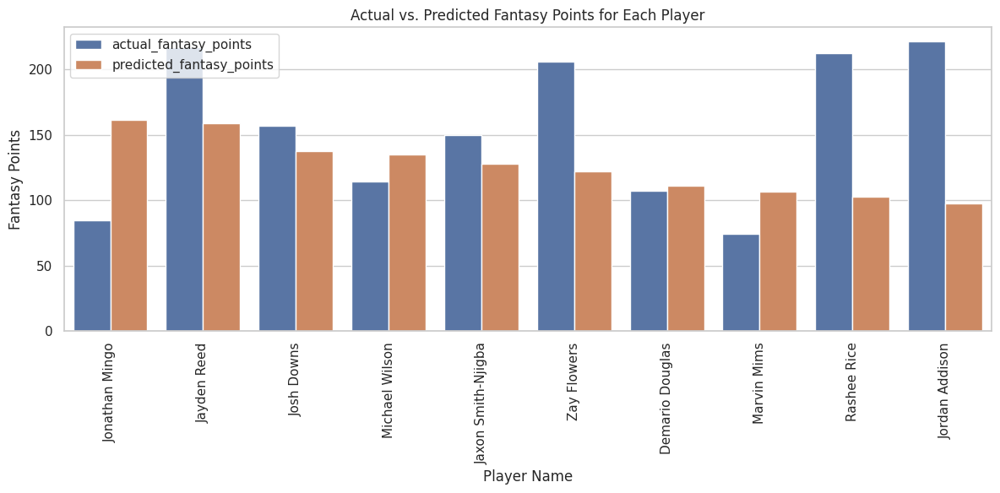

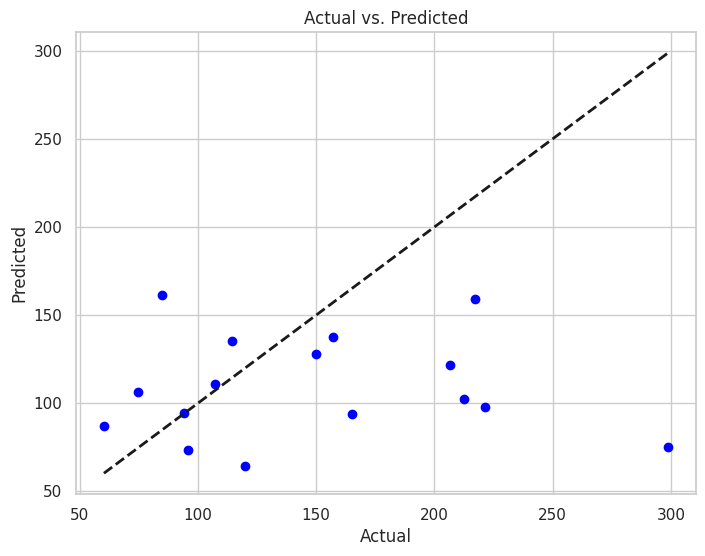

In [ ]:
forest_rookie_results, best_forest_rookie  = randomforest(train_X_rok, test_X_rok, train_y_rok, test_y_rok, test_ids_rookie)

In [ ]:
train_wr = wr_df[(wr_df['season']<2023)&(wr_df['year_in_league']>1)].dropna(axis = 0)
test_wr = wr_df[(wr_df['season']==2023)&(wr_df['year_in_league']>1)].dropna(axis = 0)

# Saving player_id and player_name before dropping them
train_ids_veteran = train_wr[['player_id', 'player_name']]
test_ids_veteran = test_wr[['player_id', 'player_name']]

train_X = pd.get_dummies(train_wr.drop(columns=['player_id','player_name','season','first_position_pick','fantasy_points_ppr_next_season','position']),drop_first=False).astype(float)
train_y = train_wr['fantasy_points_ppr_next_season'].astype(float)
test_X = pd.get_dummies(test_wr.drop(columns=['player_id','player_name','season','first_position_pick','fantasy_points_ppr_next_season','position']),drop_first=False).astype(float)
test_y = test_wr['fantasy_points_ppr_next_season'].astype(float)
test_X = test_X.reindex(columns=train_X.columns, fill_value=0)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best parameters:  RandomForestRegressor(max_depth=5, n_estimators=300, random_state=0)
Root Mean Squared Error: 56.681916162382244
R-squared: 0.6279654982998504


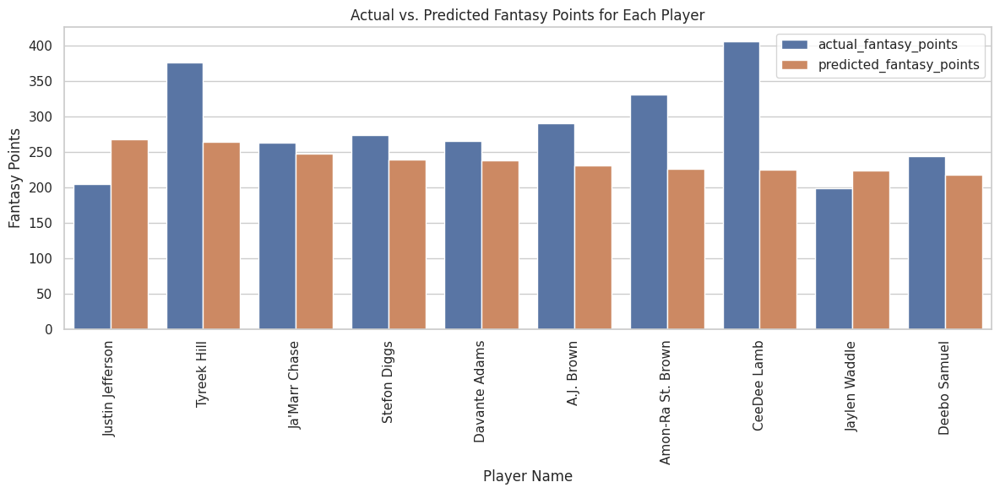

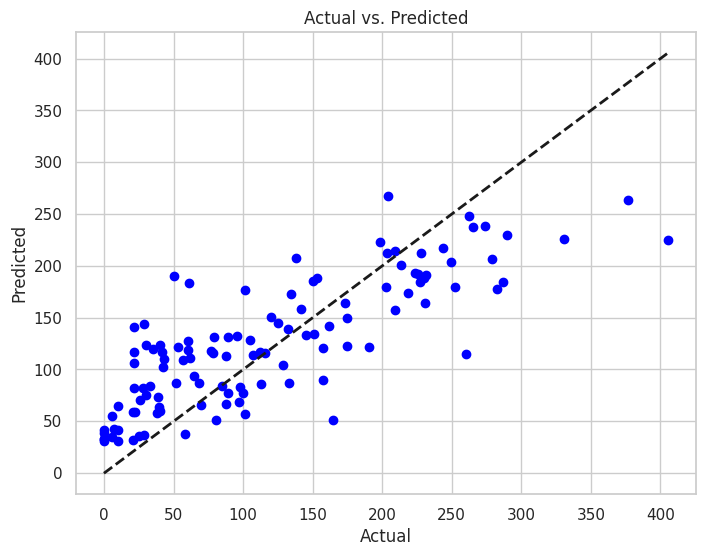

In [ ]:
forest_veteran_results, best_forest_veteran = randomforest(train_X, test_X, train_y, test_y, test_ids_veteran)

In [ ]:
results = pd.concat([forest_rookie_results, forest_veteran_results], ignore_index=True)

results['actual_points_rank'] = results['actual_fantasy_points'].rank(ascending=False)
results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
results = results.sort_values('predicted_fantasy_points',ascending=False)

results.sort_values('predicted_fantasy_points',ascending=False).head(60)

,player_id,player_name,actual_fantasy_points,predicted_fantasy_points,actual_points_rank,predicted_points_rank
16,00-0036322,Justin Jefferson,204.20,267.808438,31.0,1.0
17,00-0033040,Tyreek Hill,376.40,263.278802,2.0,2.0
18,00-0036900,Ja'Marr Chase,262.72,247.757248,11.0,3.0
19,00-0031588,Stefon Diggs,273.80,238.277092,9.0,4.0
20,00-0031381,Davante Adams,265.40,237.663225,10.0,5.0
21,00-0035676,A.J. Brown,289.60,230.162336,5.0,6.0
22,00-0036963,Amon-Ra St. Brown,330.90,225.497107,3.0,7.0
23,00-0036358,CeeDee Lamb,405.20,224.905867,1.0,8.0
24,00-0036613,Jaylen Waddle,198.60,223.456686,34.0,9.0
25,00-0035719,Deebo Samuel,243.70,216.983637,15.0,10.0


### XGBoost

depth_team: 0.294713
binned_draft_pick_Late Round: 0.067082
binned_draft_pick_Third Round: 0.062716
binned_draft_pick_Undrafted: 0.055111
binned_draft_pick_Middle Round: 0.050909
binned_draft_pick_Early First Round: 0.048337
binned_draft_pick_Late First Round: 0.043249
binned_draft_pick_Late Second Round: 0.038513
first_position_pick: 0.032586
binned_weight_200-219: 0.031789
binned_height_75-77: 0.031129
binned_draft_pick_Top 5: 0.031118
binned_height_69-71: 0.028948
binned_weight_180-199: 0.027216
binned_height_72-74: 0.026556
binned_weight_220-239: 0.025727
QB_4000_yards: 0.024281
years_coached: 0.023901
wins: 0.018690
binned_draft_pick_Early Second Round: 0.017681
binned_weight_160-179: 0.013317
binned_weight_240-259: 0.006430
games_played: 0.000000
receiving_yards_after_catch: 0.000000
binned_weight_260-279: 0.000000
binned_height_66-68: 0.000000


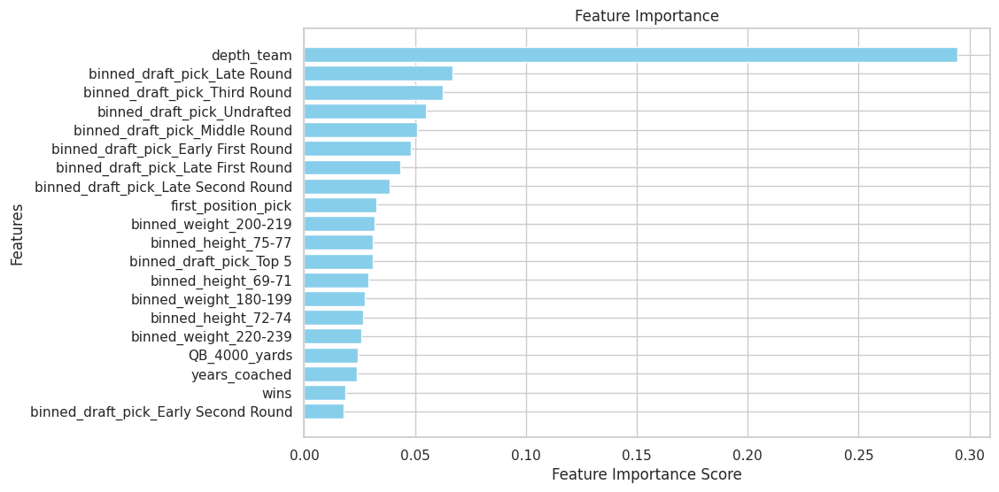

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Root Mean Squared Error: 79.1300879205868
R-squared: -0.49430797138698646


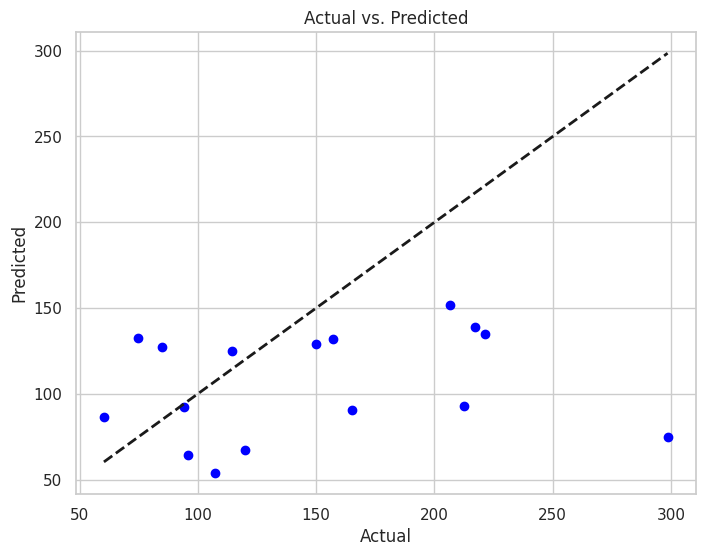

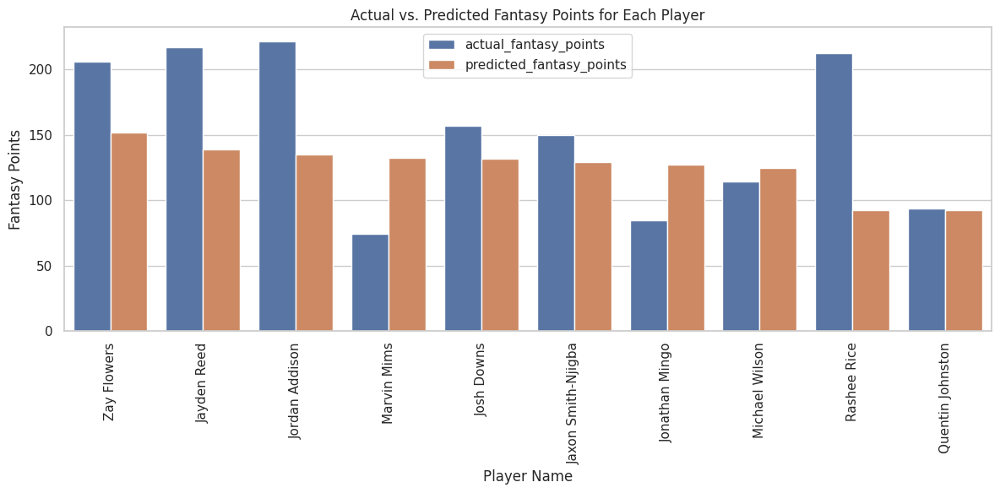

In [ ]:
xgb_rookie_results, best_xgb_rookie = xgboost(train_X_rok, test_X_rok, train_y_rok, test_y_rok, test_ids_rookie)

depth_team: 0.489640
fantasy_points_per_game_last_three_years: 0.068603
binned_draft_pick_Undrafted: 0.025819
year_in_league: 0.024694
binned_weight_160-179: 0.024003
injury type_foot: 0.021824
receiving_yards_after_catch: 0.019050
binned_weight_240-259: 0.017710
receiving_epa: 0.017387
injury type_no injury: 0.017132
injury type_torso: 0.016290
binned_draft_pick_Late First Round: 0.015951
fumbles: 0.015169
binned_height_72-74: 0.012892
injury type_ankle: 0.012692
rushing_yards: 0.012286
binned_draft_pick_Top 5: 0.012285
binned_weight_180-199: 0.012228
wins: 0.012091
injury type_leg: 0.012014
binned_height_69-71: 0.011654
years_coached: 0.011445
games_played: 0.011004
binned_weight_200-219: 0.010508
racr: 0.010424
new_team: 0.010304
binned_draft_pick_Late Round: 0.008985
binned_height_75-77: 0.008035
binned_draft_pick_Third Round: 0.007876
injury type_shoulder: 0.007619
binned_draft_pick_Middle Round: 0.007499
binned_draft_pick_Early Second Round: 0.007029
QB_4000_yards: 0.006639
injur

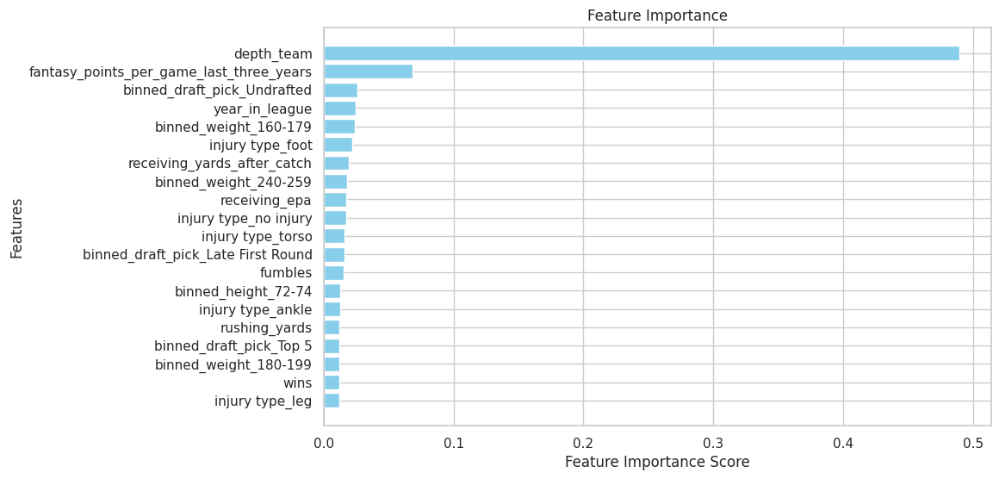

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Root Mean Squared Error: 55.849523504460905
R-squared: 0.6388121647814089


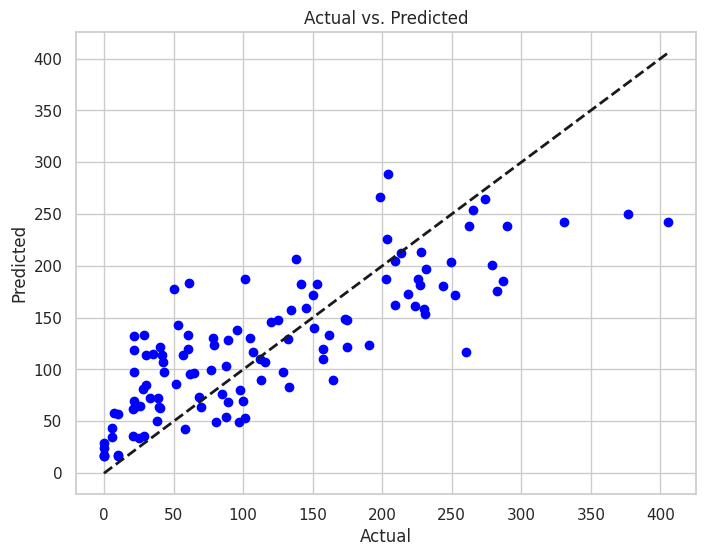

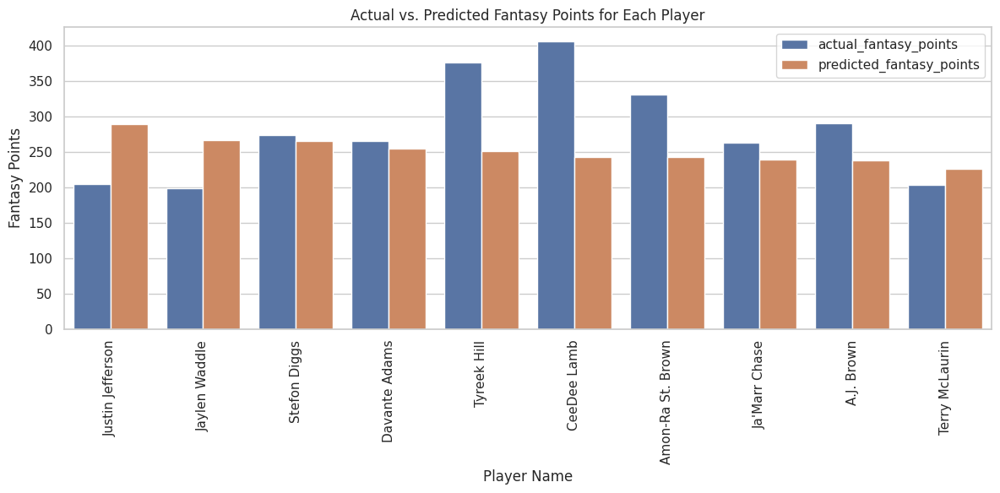

In [ ]:
xgb_veteran_results, best_xgb_veteran = xgboost(train_X, test_X, train_y, test_y, test_ids_veteran)

In [ ]:
results = pd.concat([xgb_rookie_results, xgb_veteran_results], ignore_index=True)

results['actual_points_rank'] = results['actual_fantasy_points'].rank(ascending=False)
results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
results = results.sort_values('predicted_fantasy_points',ascending=False)

results.sort_values('predicted_fantasy_points',ascending=False).head(60)

,player_id,player_name,actual_fantasy_points,predicted_fantasy_points,actual_points_rank,predicted_points_rank
16,00-0036322,Justin Jefferson,204.20,288.660675,31.0,1.0
17,00-0036613,Jaylen Waddle,198.60,266.034607,34.0,2.0
18,00-0031588,Stefon Diggs,273.80,264.578247,9.0,3.0
19,00-0031381,Davante Adams,265.40,254.172989,10.0,4.0
20,00-0033040,Tyreek Hill,376.40,250.246506,2.0,5.0
21,00-0036358,CeeDee Lamb,405.20,242.043961,1.0,6.0
22,00-0036963,Amon-Ra St. Brown,330.90,241.851654,3.0,7.0
23,00-0036900,Ja'Marr Chase,262.72,238.852707,11.0,8.0
24,00-0035676,A.J. Brown,289.60,238.118240,5.0,9.0
25,00-0035659,Terry McLaurin,203.20,225.928909,32.0,10.0


### Gradient Boosting

depth_team: 0.504526
years_coached: 0.118475
wins: 0.066985
binned_draft_pick_Early First Round: 0.046501
binned_draft_pick_Late First Round: 0.039819
binned_draft_pick_Late Round: 0.035859
binned_draft_pick_Late Second Round: 0.021619
binned_draft_pick_Third Round: 0.020635
QB_4000_yards: 0.020498
first_position_pick: 0.018790
binned_draft_pick_Undrafted: 0.018313
binned_weight_220-239: 0.015525
binned_draft_pick_Middle Round: 0.014581
binned_draft_pick_Early Second Round: 0.013426
binned_height_69-71: 0.009785
binned_height_72-74: 0.008891
binned_draft_pick_Top 5: 0.008497
binned_weight_200-219: 0.006127
binned_height_66-68: 0.003085
binned_height_75-77: 0.002667
binned_weight_180-199: 0.002551
binned_weight_240-259: 0.002035
binned_weight_160-179: 0.000813
games_played: 0.000000
receiving_yards_after_catch: 0.000000
binned_weight_260-279: 0.000000


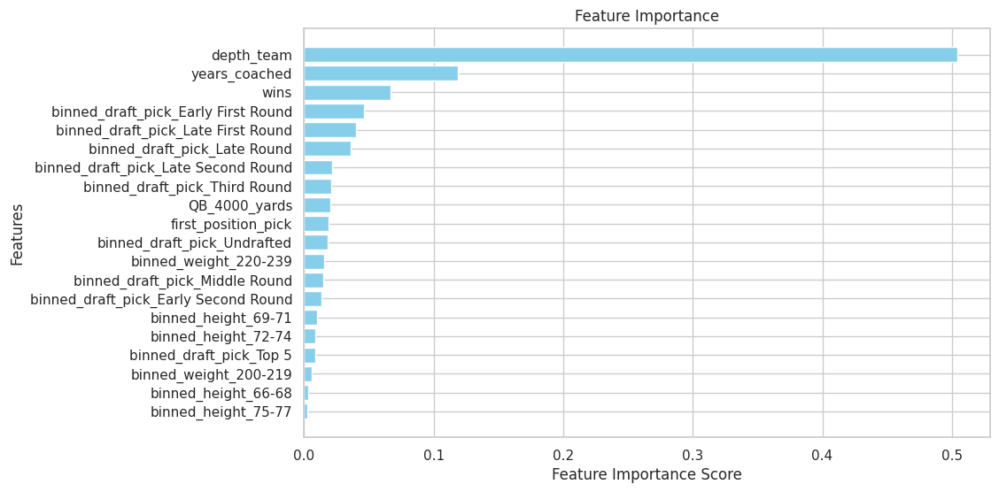

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Root Mean Squared Error: 79.08664967630554
R-squared: -0.49266782917854757


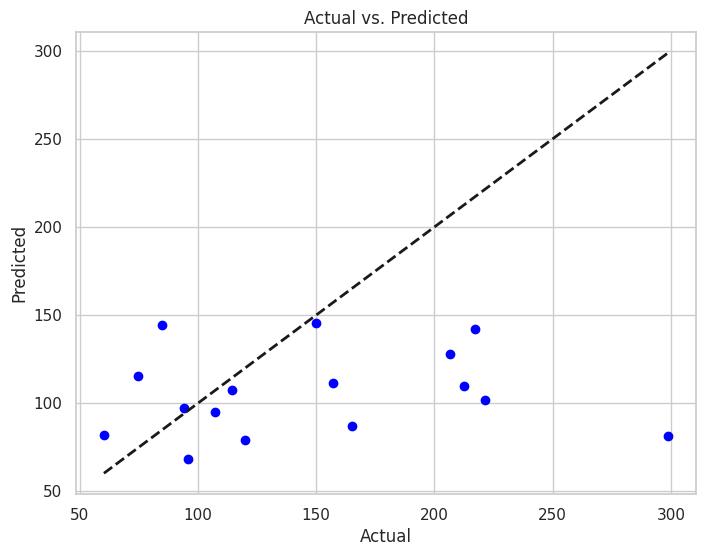

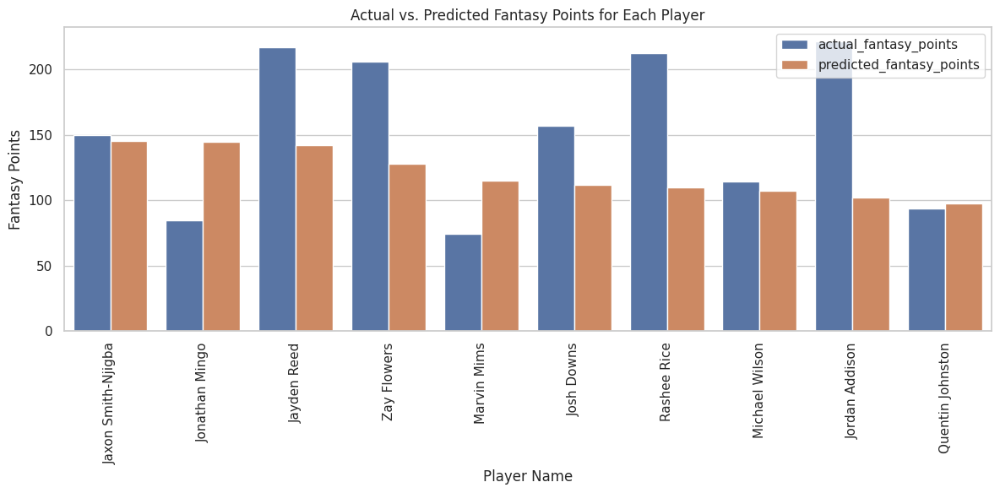

In [ ]:
gb_rookie_results, best_gb_rookie = gradientboosting(train_X_rok, test_X_rok, train_y_rok, test_y_rok, test_ids_rookie)

depth_team: 0.501686
fantasy_points_per_game_last_three_years: 0.217807
receiving_yards_after_catch: 0.069404
year_in_league: 0.054520
receiving_epa: 0.053360
racr: 0.021163
rushing_yards: 0.017219
games_played: 0.013777
new_team: 0.006637
years_coached: 0.006457
wins: 0.005318
injury type_leg: 0.004979
fumbles: 0.003574
injury type_torso: 0.002838
binned_draft_pick_Top 5: 0.002644
binned_weight_160-179: 0.001939
binned_draft_pick_Early Second Round: 0.001708
binned_weight_240-259: 0.001613
binned_draft_pick_Undrafted: 0.001396
binned_draft_pick_Late Second Round: 0.001378
binned_draft_pick_Middle Round: 0.001256
binned_draft_pick_Late First Round: 0.001087
binned_height_72-74: 0.001067
binned_weight_200-219: 0.001020
injury type_foot: 0.000854
binned_height_75-77: 0.000766
binned_draft_pick_Late Round: 0.000717
injury severity_severe: 0.000619
binned_draft_pick_Third Round: 0.000595
binned_height_69-71: 0.000541
QB_4000_yards: 0.000487
binned_height_66-68: 0.000473
binned_weight_180-1

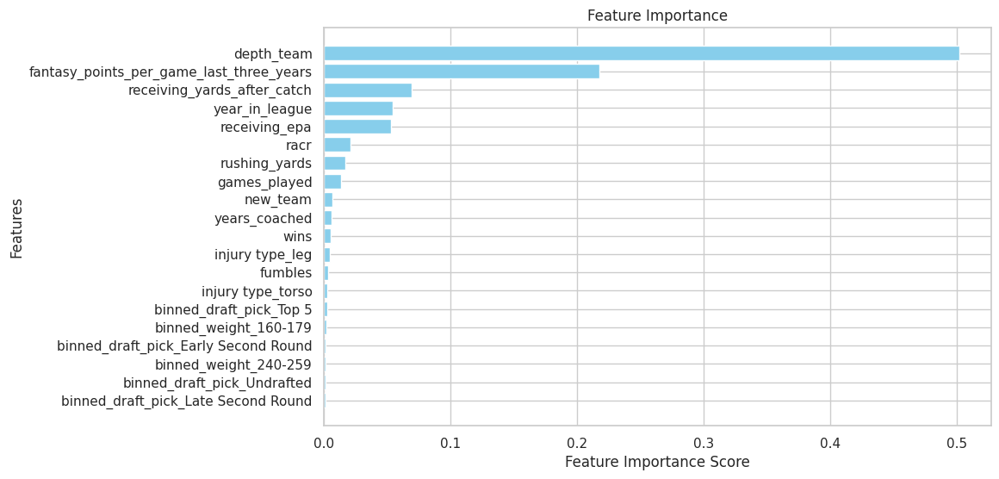

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Root Mean Squared Error: 57.301543087190986
R-squared: 0.6197871371513115


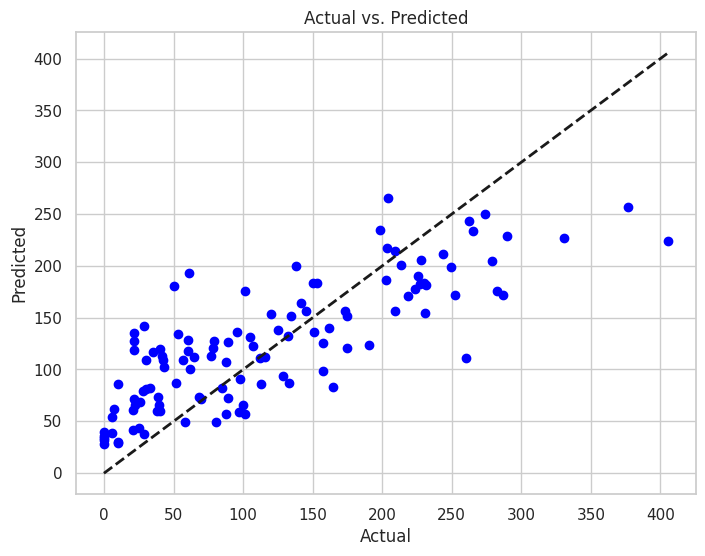

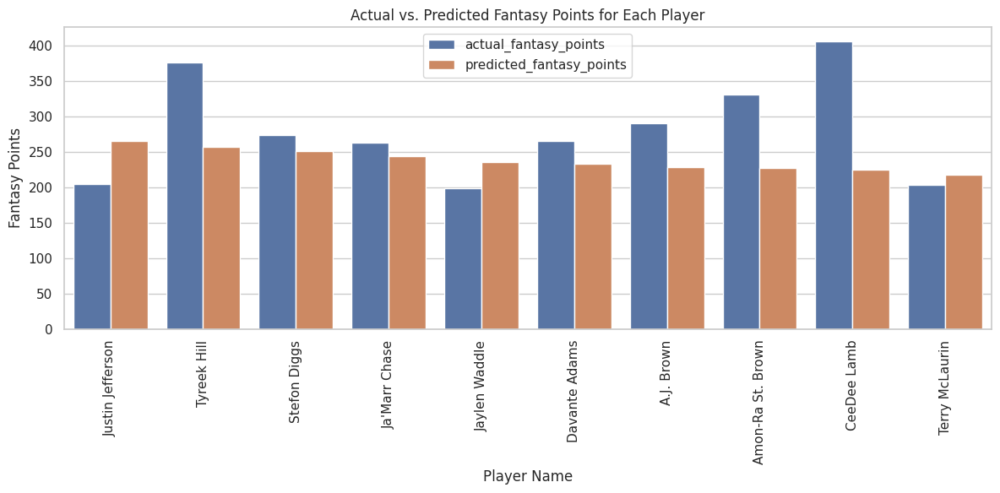

In [ ]:
gb_veteran_results, best_gb_rookie = gradientboosting(train_X, test_X, train_y, test_y, test_ids_veteran)

In [ ]:
results = pd.concat([gb_rookie_results, gb_veteran_results], ignore_index=True)

results['actual_points_rank'] = results['actual_fantasy_points'].rank(ascending=False)
results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
results = results.sort_values('predicted_fantasy_points',ascending=False)

results.sort_values('predicted_fantasy_points',ascending=False).head(60)

,player_id,player_name,actual_fantasy_points,predicted_fantasy_points,actual_points_rank,predicted_points_rank
16,00-0036322,Justin Jefferson,204.20,265.580882,31.0,1.0
17,00-0033040,Tyreek Hill,376.40,257.011394,2.0,2.0
18,00-0031588,Stefon Diggs,273.80,250.444588,9.0,3.0
19,00-0036900,Ja'Marr Chase,262.72,243.748945,11.0,4.0
20,00-0036613,Jaylen Waddle,198.60,234.982142,34.0,5.0
21,00-0031381,Davante Adams,265.40,233.461998,10.0,6.0
22,00-0035676,A.J. Brown,289.60,228.422846,5.0,7.0
23,00-0036963,Amon-Ra St. Brown,330.90,226.628695,3.0,8.0
24,00-0036358,CeeDee Lamb,405.20,224.166733,1.0,9.0
25,00-0035659,Terry McLaurin,203.20,217.276437,32.0,10.0


### Voting Regression

Root Mean Squared Error: 78.82857207157627
R-squared: -0.4829418993815493


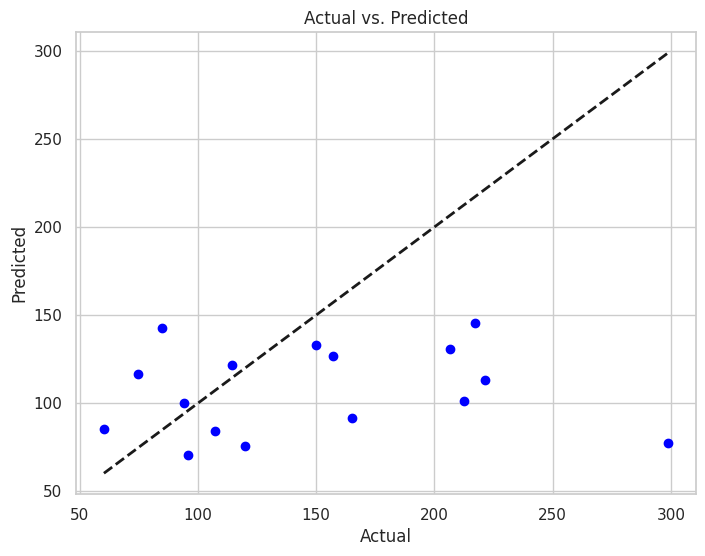

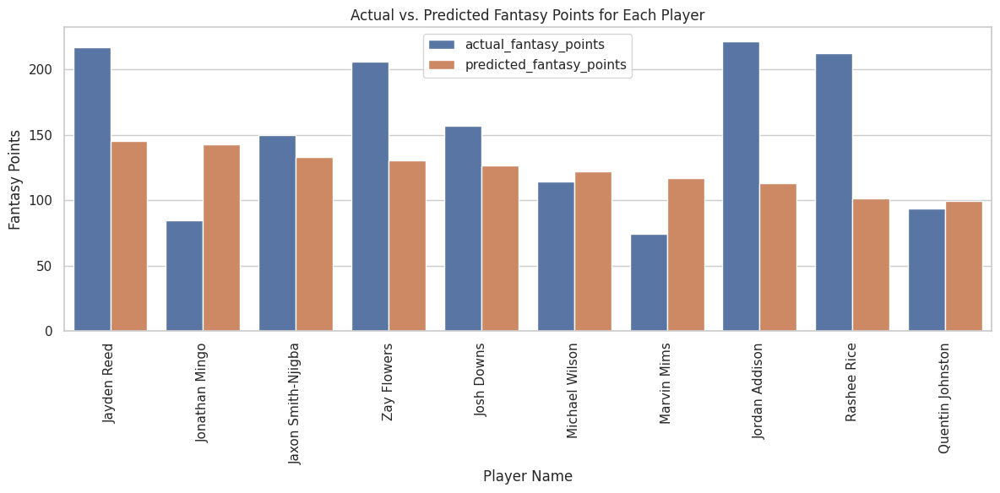

In [ ]:
rookie_results = votingregressor(best_xgb_rookie, best_gb_rookie, best_lasso_rookie, best_forest_rookie ,test_ids_rookie, train_X_rok, train_y_rok, test_X_rok, test_y_rok)

Root Mean Squared Error: 56.831965727988056
R-squared: 0.6259931759832527


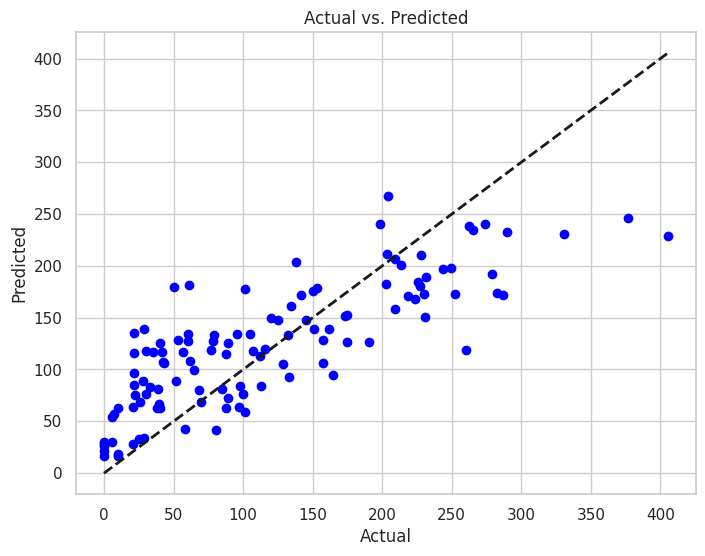

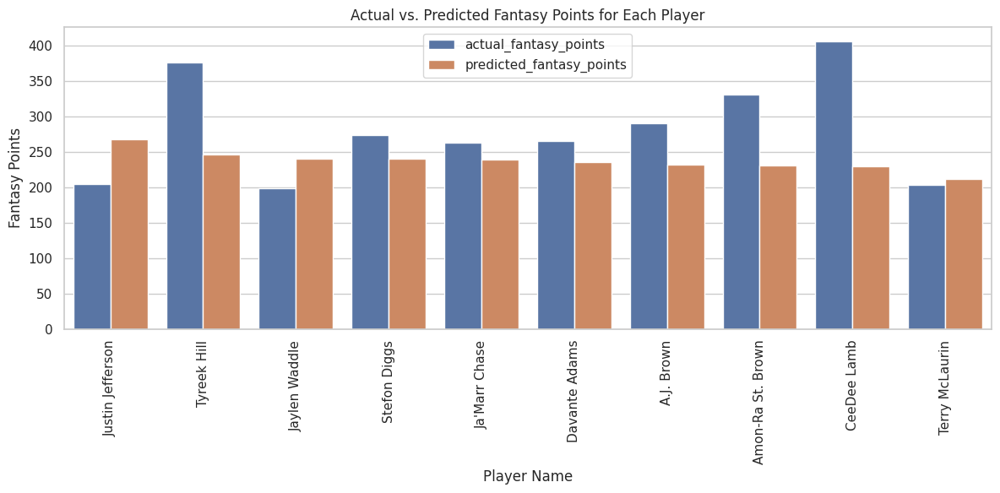

In [ ]:
veteran_results = votingregressor(best_xgb_veteran, best_gb_veteran,best_lasso_veteran,best_forest_veteran,test_ids_veteran, train_X, train_y, test_X, test_y)

In [ ]:
results = pd.concat([rookie_results, veteran_results], ignore_index=True)

results['actual_points_rank'] = results['actual_fantasy_points'].rank(ascending=False)
results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
results = results.sort_values('predicted_fantasy_points',ascending=False)

results.sort_values('predicted_fantasy_points',ascending=False).head(60)

,player_id,player_name,actual_fantasy_points,predicted_fantasy_points,actual_points_rank,predicted_points_rank
16,00-0036322,Justin Jefferson,204.20,267.775769,31.0,1.0
17,00-0033040,Tyreek Hill,376.40,246.084974,2.0,2.0
18,00-0036613,Jaylen Waddle,198.60,240.479133,34.0,3.0
19,00-0031588,Stefon Diggs,273.80,240.240262,9.0,4.0
20,00-0036900,Ja'Marr Chase,262.72,238.412339,11.0,5.0
21,00-0031381,Davante Adams,265.40,235.065753,10.0,6.0
22,00-0035676,A.J. Brown,289.60,232.217581,5.0,7.0
23,00-0036963,Amon-Ra St. Brown,330.90,230.827725,3.0,8.0
24,00-0036358,CeeDee Lamb,405.20,229.208346,1.0,9.0
25,00-0035659,Terry McLaurin,203.20,211.027695,32.0,10.0


### Rookie Testing

In [ ]:
# Lists that will become columns in dataframe
model = []
wr_rok_params = []
wr_rok_r2 = []
wr_rok_rmse = []
wr_rok_top6_percent = []
wr_rok_top1_percent = []

In [ ]:
# Run each model on each of the past 5 years to figure out which is best model to use
test_years = [2023, 2022, 2021, 2020, 2019]
for test_year in test_years:

  train_rookie = rookie_wr_df[rookie_wr_df['season']<test_year]
  test_rookie = rookie_wr_df[rookie_wr_df['season']==test_year]

  train_X_rok = pd.get_dummies(train_rookie.drop(columns=['player_id','player_name',
                                                  'season','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
  train_y_rok = train_rookie['fantasy_points_ppr_next_season'].astype(float)
  test_X_rok = pd.get_dummies(test_rookie.drop(columns=['player_id','player_name',
                                                  'season','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
  test_y_rok = test_rookie['fantasy_points_ppr_next_season'].astype(float)
  test_X_rok = test_X_rok.reindex(columns=train_X_rok.columns, fill_value=0)

  model.append('lasso')
  rookie_lasso = lasso_results(train_X_rok, test_X_rok, train_y_rok, test_y_rok, wr_rok_params, wr_rok_r2, wr_rok_rmse, wr_rok_top6_percent,6, wr_rok_top1_percent,1)

  train_rookie = rookie_wr_df[rookie_wr_df['season']<test_year]
  test_rookie = rookie_wr_df[rookie_wr_df['season']==test_year]

  train_X_rok = pd.get_dummies(train_rookie.drop(columns=['player_id','player_name',
                                                  'season','fantasy_points_ppr_next_season']),drop_first=False).astype(float)
  train_y_rok = train_rookie['fantasy_points_ppr_next_season'].astype(float)
  test_X_rok = pd.get_dummies(test_rookie.drop(columns=['player_id','player_name',
                                                  'season','fantasy_points_ppr_next_season']),drop_first=False).astype(float)
  test_y_rok = test_rookie['fantasy_points_ppr_next_season'].astype(float)
  test_X_rok = test_X_rok.reindex(columns=train_X_rok.columns, fill_value=0)

  model.append('random forest')
  rookie_forest = randomforest_results(train_X_rok, test_X_rok, train_y_rok, test_y_rok,  wr_rok_params, wr_rok_r2, wr_rok_rmse, wr_rok_top6_percent,6, wr_rok_top1_percent,1)
  model.append('xgb')
  rookie_xgb = xgboost_results(train_X_rok, test_X_rok, train_y_rok, test_y_rok,  wr_rok_params, wr_rok_r2, wr_rok_rmse, wr_rok_top6_percent,6, wr_rok_top1_percent,1)
  model.append('gb')
  rookie_gb = gb_results(train_X_rok, test_X_rok, train_y_rok, test_y_rok,  wr_rok_params, wr_rok_r2, wr_rok_rmse, wr_rok_top6_percent,6,  wr_rok_top1_percent,1)
  model.append('voting')
  hypertune_voting_regressor(rookie_xgb, rookie_gb, rookie_lasso, rookie_forest,
                            train_X_rok,test_X_rok, train_y_rok,  test_y_rok,  wr_rok_params, wr_rok_r2, wr_rok_rmse, wr_rok_top6_percent,6,  wr_rok_top1_percent,1)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best combination: ['XGBRegressor', 'Lasso']
Best RMSE: 78.88370166837912
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best combination: ['XGBRegressor', 'Lasso']
Best RMSE: 76.22221906553237
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best combination: ['XGBRegressor', 'GradientBoostingRegressor']
Best RMSE: 79.19886518735971
Fitting 5 folds for each of 6 candidat

In [ ]:
wr_rookie_results = pd.DataFrame({
    'model' : model,
    'params': wr_rok_params,
    'R2' : wr_rok_r2,
    'RMSE' : wr_rok_rmse,
    'Top 6 Accuracy' : wr_rok_top6_percent
})

wr_rookie_results.head(60)


,model,params,R2,RMSE,Top 6 Accuracy
0,lasso,{'alpha': 1},-0.529675,80.061017,0.500000
1,random forest,"{'max_depth': 5, 'n_estimators': 250}",-0.579979,81.366807,0.333333
2,xgb,"{'max_depth': 2, 'n_estimators': 20}",-0.511332,79.579547,0.333333
3,gb,"{'max_depth': 2, 'n_estimators': 60}",-0.606547,82.048070,0.333333
4,voting,"[XGBRegressor, Lasso]",-0.485017,78.883702,0.333333
5,lasso,{'alpha': 1},-0.561814,68.181783,0.666667
6,random forest,"{'max_depth': 4, 'n_estimators': 250}",-1.343610,83.521133,0.500000
7,xgb,"{'max_depth': 3, 'n_estimators': 15}",-1.110102,79.251127,0.666667
8,gb,"{'max_depth': 3, 'n_estimators': 40}",-1.098510,79.033127,0.666667
9,voting,"[XGBRegressor, Lasso]",-0.951892,76.222219,0.500000


In [ ]:
agg_results = wr_rookie_results.groupby('model')[['RMSE', 'R2', 'Top 6 Accuracy']].agg(['mean', 'median', 'std'])

# Sorting by the 'median' of any of the metrics (e.g., 'RMSE')
sorted_results = agg_results.sort_values(by=('RMSE', 'mean'), ascending=True)

sorted_results

# Lasso was the model for rookie wrs

RMSE                             R2                      \
                    mean     median       std      mean    median       std   
model                                                                         
lasso          71.506809  68.181783  9.416883 -0.079858  0.115031  0.432093   
voting         72.506368  76.222219  7.748516 -0.141942  0.193525  0.553152   
xgb            73.814569  79.251127  7.808692 -0.191269  0.183441  0.604569   
gb             74.126003  78.831202  8.122140 -0.205971  0.177850  0.616920   
random forest  77.046330  81.366807  7.782009 -0.297658  0.119477  0.664228   

              Top 6 Accuracy                   
                        mean median       std  
model                                          
lasso               0.533333    0.5  0.139443  
voting              0.466667    0.5  0.139443  
xgb                 0.533333    0.5  0.217307  
gb                  0.533333    0.5  0.139443  
random forest       0.500000    0.5  0.166667

### Veteran Testing

In [ ]:
model = []
wr_params = []
wr_r2 = []
wr_rmse = []
wr_top10_percent = []
wr_top20_percent = []

In [ ]:
# Run each model on each of the past 5 years to figure out which is best model to use
test_years = [2023, 2022, 2021, 2020, 2019]
for test_year in test_years:

  # qb_df.dropna(axis = 0, inplace=True)

  train_wr = wr_df[(wr_df['season']<test_year)&(wr_df['year_in_league']>1)].dropna(axis = 0)
  test_wr = wr_df[(wr_df['season']==test_year)&(wr_df['year_in_league']>1)].dropna(axis = 0)

  train_X = pd.get_dummies(train_wr.drop(columns=['player_id','player_name','season','fantasy_points_ppr_next_season','position','first_position_pick']),drop_first=True).astype(float)
  train_y = train_wr['fantasy_points_ppr_next_season'].astype(float)
  test_X = pd.get_dummies(test_wr.drop(columns=['player_id','player_name','season','fantasy_points_ppr_next_season','position','first_position_pick']),drop_first=True).astype(float)
  test_y = test_wr['fantasy_points_ppr_next_season'].astype(float)
  test_X = test_X.reindex(columns=train_X.columns, fill_value=0)

  model.append('lasso')
  veteran_lasso = lasso_results(train_X, test_X, train_y, test_y, wr_params, wr_r2, wr_rmse, wr_top10_percent,10, wr_top20_percent,20)

  train_X = pd.get_dummies(train_wr.drop(columns=['player_id','player_name','season','fantasy_points_ppr_next_season','position','first_position_pick']),drop_first=False).astype(float)
  train_y = train_wr['fantasy_points_ppr_next_season'].astype(float)
  test_X = pd.get_dummies(test_wr.drop(columns=['player_id','player_name','season','fantasy_points_ppr_next_season','position','first_position_pick']),drop_first=False).astype(float)
  test_y = test_wr['fantasy_points_ppr_next_season'].astype(float)
  test_X = test_X.reindex(columns=train_X.columns, fill_value=0)
  model.append('random forest')

  veteran_forest = randomforest_results(train_X, test_X, train_y, test_y, wr_params, wr_r2, wr_rmse, wr_top10_percent,10, wr_top20_percent,20)
  model.append('xgb')
  veteran_xgb = xgboost_results(train_X, test_X, train_y, test_y, wr_params, wr_r2, wr_rmse, wr_top10_percent,10, wr_top20_percent,20)
  model.append('gb')
  veteran_gb = gb_results(train_X, test_X, train_y, test_y, wr_params, wr_r2, wr_rmse, wr_top10_percent,10, wr_top20_percent,20)
  model.append('voting')
  hypertune_voting_regressor(veteran_xgb, veteran_gb, veteran_lasso, veteran_forest,
                            train_X, test_X, train_y, test_y, wr_params, wr_r2, wr_rmse, wr_top10_percent,10, wr_top20_percent,20)


Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best combination: ['GradientBoostingRegressor', 'RandomForestRegressor']
Best RMSE: 56.460387295666266
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best combination: ['GradientBoostingRegressor', 'Lasso', 'RandomForestRegressor']
Best RMSE: 54.36341430166188
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best combination: ['XGBRegressor', 'RandomForestRegressor']
Bes

In [ ]:
wr_results = pd.DataFrame({
    'model' : model,
    'params': wr_params,
    'R2' : wr_r2,
    'RMSE' : wr_rmse,
    'Top 10 Accuracy' : wr_top10_percent,
    'Top 20 Accuracy' : wr_top20_percent
})

wr_results.head(60)

,model,params,R2,RMSE,Top 10 Accuracy,Top 20 Accuracy
0,lasso,{'alpha': 1},0.581546,60.114130,0.7,0.60
1,random forest,"{'max_depth': 5, 'n_estimators': 250}",0.627812,56.693595,0.7,0.65
2,xgb,"{'max_depth': 3, 'n_estimators': 10}",0.619256,57.341579,0.7,0.60
3,gb,"{'max_depth': 3, 'n_estimators': 50}",0.629441,56.569415,0.7,0.60
4,voting,"[GradientBoostingRegressor, RandomForestRegres...",0.630868,56.460387,0.7,0.65
5,lasso,{'alpha': 1},0.557099,57.234879,0.5,0.65
6,random forest,"{'max_depth': 5, 'n_estimators': 350}",0.586194,55.322998,0.4,0.60
7,xgb,"{'max_depth': 3, 'n_estimators': 15}",0.589615,55.093826,0.5,0.65
8,gb,"{'max_depth': 3, 'n_estimators': 50}",0.600665,54.347037,0.6,0.70
9,voting,"[GradientBoostingRegressor, Lasso, RandomFores...",0.600424,54.363414,0.6,0.60


In [ ]:
agg_results = wr_results.groupby('model')[['RMSE', 'R2', 'Top 10 Accuracy','Top 20 Accuracy']].agg(['mean', 'median', 'std'])

# Sorting by the 'median' of any of the metrics (e.g., 'RMSE')
sorted_results = agg_results.sort_values(by=('RMSE', 'mean'), ascending=True)

sorted_results

# All the models performed very similarly, I went with voting regressor because it performed the best on every metric
# I used lasso, random forest, and gb

RMSE                             R2                      \
                    mean     median       std      mean    median       std   
model                                                                         
voting         57.030268  56.969201  1.819989  0.570139  0.567442  0.048914   
random forest  57.590684  57.117570  1.792370  0.561624  0.565186  0.049530   
gb             57.775137  57.384449  2.598248  0.558021  0.561113  0.062149   
xgb            57.908113  57.423363  1.996870  0.556804  0.560518  0.051009   
lasso          59.537655  60.114130  1.554259  0.532275  0.542096  0.042540   

              Top 10 Accuracy                  Top 20 Accuracy         \
                         mean median       std            mean median   
model                                                                   
voting                   0.52    0.5  0.130384            0.60    0.6   
random forest            0.50    0.4  0.141421            0.59    0.6   
gb                       0.50    0.5  0.158114            0.58    0.6   
xgb                      0.50    0.5  0.122474            0.59    0.6   
lasso                    0.50    0.5  0.122474            0.59    0.6   

                         
                    std  
model                    
voting         0.050000  
random forest  0.065192  
gb             0.103682  
xgb            0.065192  
lasso          0.065192

### 2024 Prediction

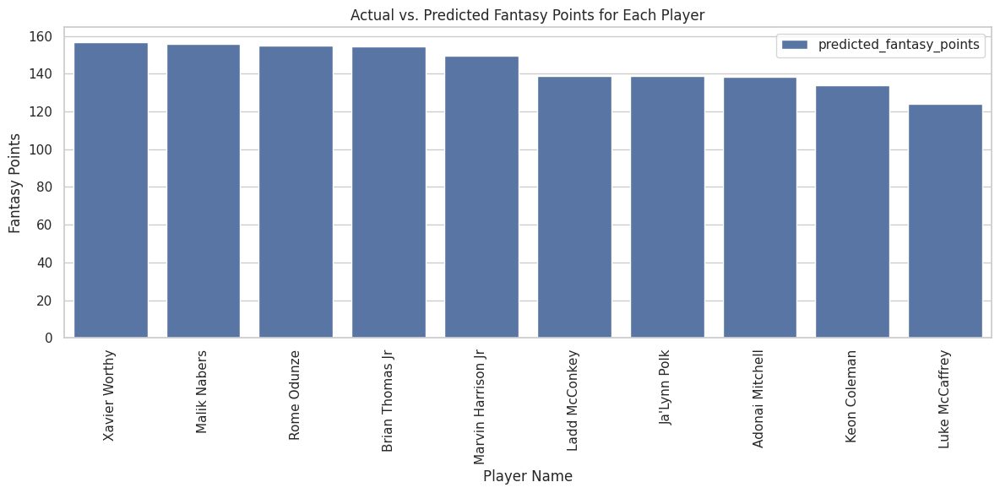

In [115]:
# Model to predict 2024 rookie wrs
train_rookie = rookie_wr_df[rookie_wr_df['season']<2024]
test_rookie = rookie_wr_df[rookie_wr_df['season']==2024]

train_ids_rookie = train_rookie[['player_id', 'player_name']]
test_ids_rookie = test_rookie[['player_id', 'player_name']]

train_X_rok = pd.get_dummies(train_rookie.drop(columns=['player_id','player_name',
                                                'season','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
train_y_rok = train_rookie['fantasy_points_ppr_next_season'].astype(float)
test_X_rok = pd.get_dummies(test_rookie.drop(columns=['player_id','player_name',
                                                'season','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
test_X_rok = test_X_rok.reindex(columns=train_X_rok.columns, fill_value=0)

# Most optimal parameter based on cross validation
regressor = Lasso(alpha=1)

regressor.fit(train_X_rok, train_y_rok)
pred_y = regressor.predict(test_X_rok)

results = pd.DataFrame({
        'player_id': test_ids_rookie['player_id'],
        'player_name': test_ids_rookie['player_name'],
        'predicted_fantasy_points': pred_y
    })

results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
rookie_results = results.sort_values('predicted_fantasy_points', ascending=False)
top = rookie_results.head(10)

top_predictions_2024(top)

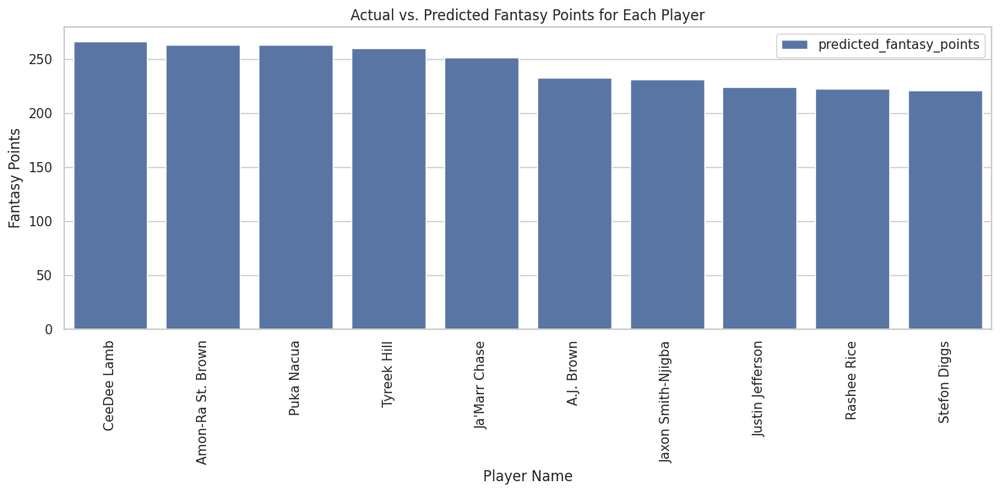

In [120]:
# Model to predict 2024 veteran wrs
train_wr = wr_df[(wr_df['season']!=2024)&(wr_df['year_in_league']>1)].dropna(axis = 0)
test_wr = wr_df[(wr_df['season']==2024)&(wr_df['year_in_league']>1)]

# Saving player_id and player_name before dropping them
train_ids_veteran = train_wr[['player_id', 'player_name']]
test_ids_veteran = test_wr[['player_id', 'player_name']]

train_X = pd.get_dummies(train_wr.drop(columns=['player_id','player_name','season','first_position_pick','fantasy_points_ppr_next_season','position']),drop_first=True).astype(float)
train_y = train_wr['fantasy_points_ppr_next_season'].astype(float)
test_X = pd.get_dummies(test_wr.drop(columns=['player_id','player_name','season','first_position_pick','fantasy_points_ppr_next_season','position']),drop_first=True).astype(float)
test_X = test_X.reindex(columns=train_X.columns, fill_value=0)

# Most optimal parameters based on cross validation
vr = VotingRegressor(estimators=[
        ('lasso', Lasso(alpha=1)),
        ('randomforest', RandomForestRegressor(n_estimators=250, max_depth=5)),
        ('gb', GradientBoostingRegressor(n_estimators=50, max_depth=3))
    ])

vr.fit(train_X, train_y)
pred_y = vr.predict(test_X)

results = pd.DataFrame({
        'player_id': test_ids_veteran['player_id'],
        'player_name': test_ids_veteran['player_name'],
        'predicted_fantasy_points': pred_y
    })

results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
veteran_results = results.sort_values('predicted_fantasy_points', ascending=False)
top = veteran_results.head(10)

top_predictions_2024(top)

In [121]:
# Display combined wr results
wr_results = pd.concat([rookie_results, veteran_results], ignore_index=True)

wr_results['predicted_points_rank'] = wr_results['predicted_fantasy_points'].rank(ascending=False)
wr_results = wr_results.sort_values('predicted_fantasy_points',ascending=False)

wr_results.sort_values('predicted_fantasy_points',ascending=False).head(60)

,player_id,player_name,predicted_fantasy_points,predicted_points_rank
23,00-0036358,CeeDee Lamb,266.339004,1.0
24,00-0036963,Amon-Ra St. Brown,263.467556,2.0
25,00-0039075,Puka Nacua,263.315681,3.0
26,00-0033040,Tyreek Hill,259.988388,4.0
27,00-0036900,Ja'Marr Chase,251.563344,5.0
28,00-0035676,A.J. Brown,233.295470,6.0
29,00-0038543,Jaxon Smith-Njigba,231.585020,7.0
30,00-0036322,Justin Jefferson,224.145791,8.0
31,00-0039067,Rashee Rice,222.708120,9.0
32,00-0031588,Stefon Diggs,221.185722,10.0


## Tight End Analysis

### Regression

In [122]:
# Regression model for rookie tes
rookie_te_df = te_df[te_df['year_in_league']==1]
# Drop all columns that don't apply to rookies
rookie_te_df.drop(columns=['injury type','new_team', 'racr', 'position',
     'rushing_yards','receiving_epa', 'fumbles',
      'fantasy_points_per_game_last_three_years','year_in_league'
       ],inplace=True)

# Remove outliers who got injured early in the season
rookie_te_df = rookie_te_df[~((rookie_te_df['binned_draft_pick'].isin(['Early First Round', 'Late First Round','Early Second Round'])) &
                            (rookie_te_df['fantasy_points_ppr_next_season'] < 25))]

train_rookie = rookie_te_df[rookie_te_df['season']<2023]
test_rookie = rookie_te_df[rookie_te_df['season']==2023]

train_ids_rookie = train_rookie[['player_id', 'player_name']]
test_ids_rookie = test_rookie[['player_id', 'player_name']]

train_X_rok = pd.get_dummies(train_rookie.drop(columns=['player_id','player_name',
                                                'season','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
train_y_rok = train_rookie['fantasy_points_ppr_next_season'].astype(float)
test_X_rok = pd.get_dummies(test_rookie.drop(columns=['player_id','player_name',
                                                'season','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
test_y_rok = test_rookie['fantasy_points_ppr_next_season'].astype(float)
test_X_rok = test_X_rok.reindex(columns=train_X_rok.columns, fill_value=0)

<ipython-input-122-78d57c0fe1c0>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rookie_te_df.drop(columns=['injury type','new_team', 'racr', 'position',


Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best alpha: {'alpha': 0.1}
Root Mean Squared Error: 67.87107699632054
R-squared: 0.2254385779232092
Selected Features and their coefficients:
                                Feature  Coefficient
1                         QB_4000_yards     8.733346
10                binned_weight_240-259     5.565950
3                         years_coached     2.708505
6                   first_position_pick     0.928969
9                 binned_weight_220-239    -0.514949
14   binned_draft_pick_Late First Round    -0.533210
12                  binned_height_75-77    -2.146542
4                                  wins    -3.982910
16  binned_draft_pick_Late Second Round    -4.980566
13                  binned_height_78-80    -6.773059
5                            depth_team    -9.464800
17        binned_draft_pick_Third Round   -10.311120
19         binned_draft_pick_Late Round   -12.859265
18       binned_draft_pick_Middle Round   -17.979658
20 

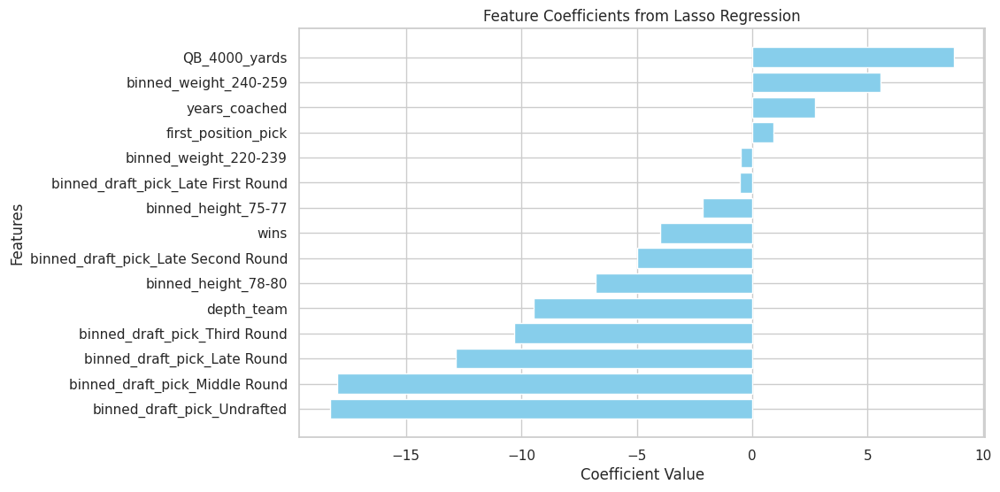

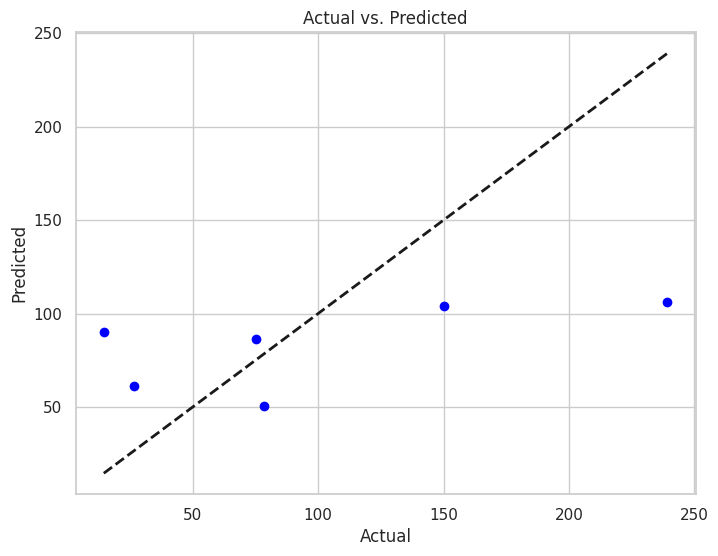

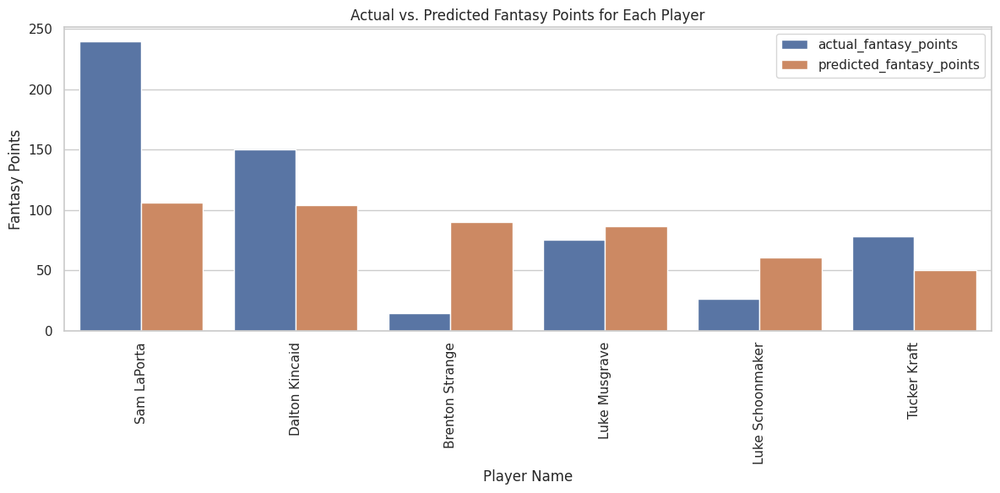

In [123]:
rookie_results, best_lasso_rookie = lasso_regression(train_X_rok, test_X_rok, train_y_rok, test_y_rok, test_ids_rookie)

In [124]:
# Regression model for veteran tes
train_te = te_df[(te_df['season']!=2023)&(te_df['year_in_league']>1)].dropna(axis = 0)
test_te = te_df[(te_df['season']==2023)&(te_df['year_in_league']>1)].dropna(axis = 0)

# Saving player_id and player_name before dropping them
train_ids_veteran = train_te[['player_id', 'player_name']]
test_ids_veteran = test_te[['player_id', 'player_name']]

train_X = pd.get_dummies(train_te.drop(columns=['player_id','player_name','season','first_position_pick','fantasy_points_ppr_next_season','position']),drop_first=True).astype(float)
train_y = train_te['fantasy_points_ppr_next_season'].astype(float)
test_X = pd.get_dummies(test_te.drop(columns=['player_id','player_name','season','first_position_pick','fantasy_points_ppr_next_season','position']),drop_first=True).astype(float)
test_y = test_te['fantasy_points_ppr_next_season'].astype(float)
test_X = test_X.reindex(columns=train_X.columns, fill_value=0)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best alpha: {'alpha': 1}
Root Mean Squared Error: 48.39500008545037
R-squared: 0.4289726302018714
Selected Features and their coefficients:
                                     Feature  Coefficient
12  fantasy_points_per_game_last_three_years    15.074292
6                              receiving_epa    11.079550
5                receiving_yards_after_catch     7.662451
4                              rushing_yards     1.501870
25                       binned_height_78-80     0.978589
27      binned_draft_pick_Early Second Round     0.626074
16                           injury type_leg     0.513938
13                  injury type_arm/shoulder     0.419463
8                              years_coached     0.414101
7                                    fumbles     0.146543
24                       binned_height_75-77    -0.382725
2                              QB_4000_yards    -0.458628
14                          injury type_foot  

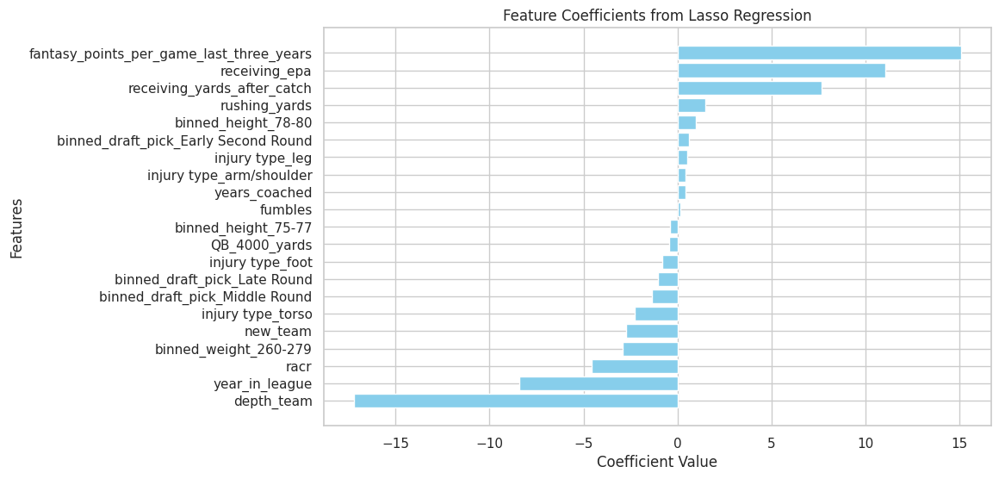

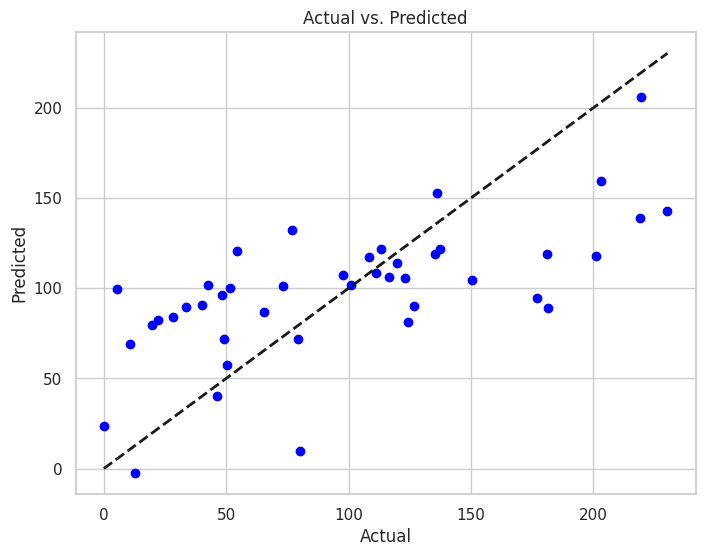

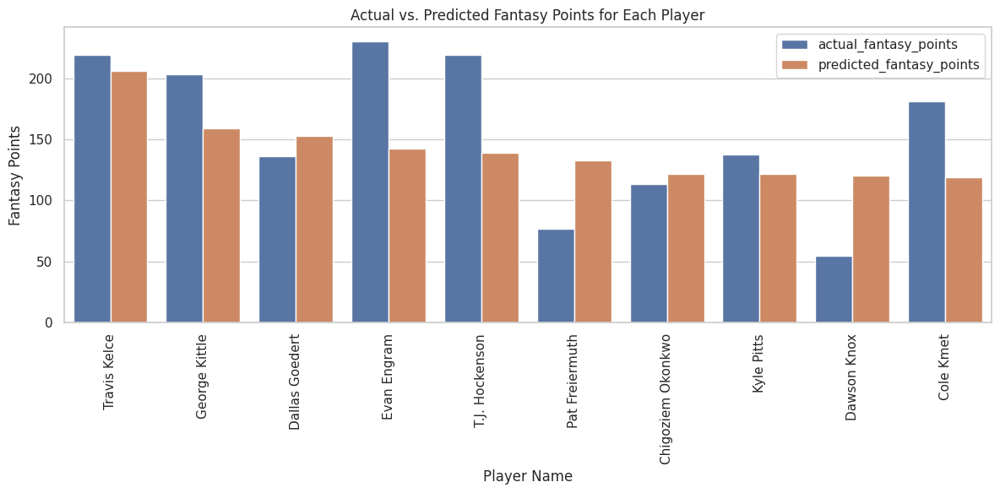

In [125]:
veteran_results, best_lasso_veteran = lasso_regression(train_X, test_X, train_y, test_y, test_ids_veteran)

In [126]:
results = pd.concat([rookie_results, veteran_results], ignore_index=True)

results['actual_points_rank'] = results['actual_fantasy_points'].rank(ascending=False)
results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
results = results.sort_values('predicted_fantasy_points',ascending=False)

results.sort_values('predicted_fantasy_points',ascending=False).head(60)

,player_id,player_name,actual_fantasy_points,predicted_fantasy_points,actual_points_rank,predicted_points_rank
6,00-0030506,Travis Kelce,219.4,205.847435,3.0,1.0
7,00-0033288,George Kittle,203.2,159.314693,5.0,2.0
8,00-0034351,Dallas Goedert,136.3,152.763935,13.0,3.0
9,00-0033881,Evan Engram,230.3,142.595337,2.0,4.0
10,00-0035229,T.J. Hockenson,219.0,138.799241,4.0,5.0
11,00-0036894,Pat Freiermuth,76.8,132.541226,28.0,6.0
12,00-0037809,Chigoziem Okonkwo,113.4,121.918523,20.0,7.0
13,00-0036970,Kyle Pitts,137.3,121.884871,12.0,8.0
14,00-0035689,Dawson Knox,54.6,120.506797,32.0,9.0
15,00-0036290,Cole Kmet,181.1,119.066892,8.0,10.0


### Random Forest

In [ ]:
# Ensembles models for rookie tes
train_rookie = rookie_te_df[rookie_te_df['season']<2023]
test_rookie = rookie_te_df[rookie_te_df['season']==2023]

train_ids_rookie = train_rookie[['player_id', 'player_name']]
test_ids_rookie = test_rookie[['player_id', 'player_name']]

train_X_rok = pd.get_dummies(train_rookie.drop(columns=['player_id','player_name',
                                                'season','fantasy_points_ppr_next_season']),drop_first=False).astype(float)
train_y_rok = train_rookie['fantasy_points_ppr_next_season'].astype(float)
test_X_rok = pd.get_dummies(test_rookie.drop(columns=['player_id','player_name',
                                                'season','fantasy_points_ppr_next_season']),drop_first=False).astype(float)
test_y_rok = test_rookie['fantasy_points_ppr_next_season'].astype(float)
test_X_rok = test_X_rok.reindex(columns=train_X_rok.columns, fill_value=0)

In [ ]:
# Ensembles models for veteran tes
train_te = te_df[(te_df['season']!=2023)&(te_df['year_in_league']>1)].dropna(axis = 0)
test_te = te_df[(te_df['season']==2023)&(te_df['year_in_league']>1)].dropna(axis = 0)

# Saving player_id and player_name before dropping them
train_ids_veteran = train_te[['player_id', 'player_name']]
test_ids_veteran = test_te[['player_id', 'player_name']]

train_X = pd.get_dummies(train_te.drop(columns=['player_id','player_name','season','first_position_pick','fantasy_points_ppr_next_season',
                                                'position']),drop_first=False).astype(float)
train_y = train_te['fantasy_points_ppr_next_season'].astype(float)
test_X = pd.get_dummies(test_te.drop(columns=['player_id','player_name','season','first_position_pick','fantasy_points_ppr_next_season',
                                              'position']),drop_first=False).astype(float)
test_y = test_te['fantasy_points_ppr_next_season'].astype(float)
test_X = test_X.reindex(columns=train_X.columns, fill_value=0)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best parameters:  RandomForestRegressor(max_depth=3, n_estimators=400, random_state=0)
Root Mean Squared Error: 27.383719802273813
R-squared: 0.41995347144086603


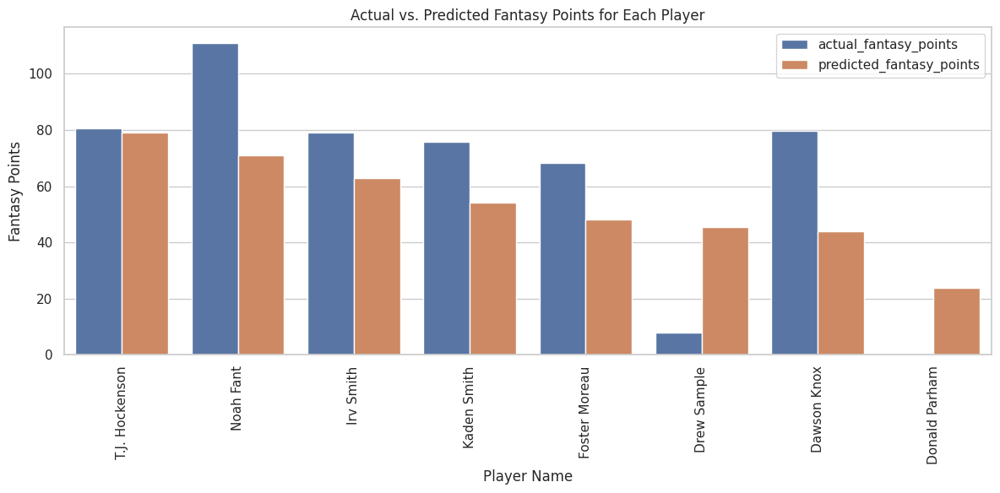

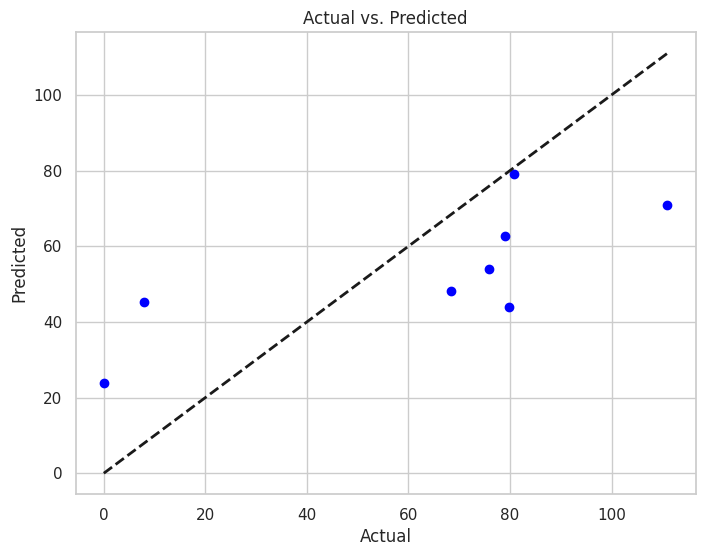

In [ ]:
forest_rookie_results, best_forest_rookie  = randomforest(train_X_rok, test_X_rok, train_y_rok, test_y_rok, test_ids_rookie)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best parameters:  RandomForestRegressor(max_depth=5, n_estimators=300, random_state=0)
Root Mean Squared Error: 48.58849847609027
R-squared: 0.42387956702108254


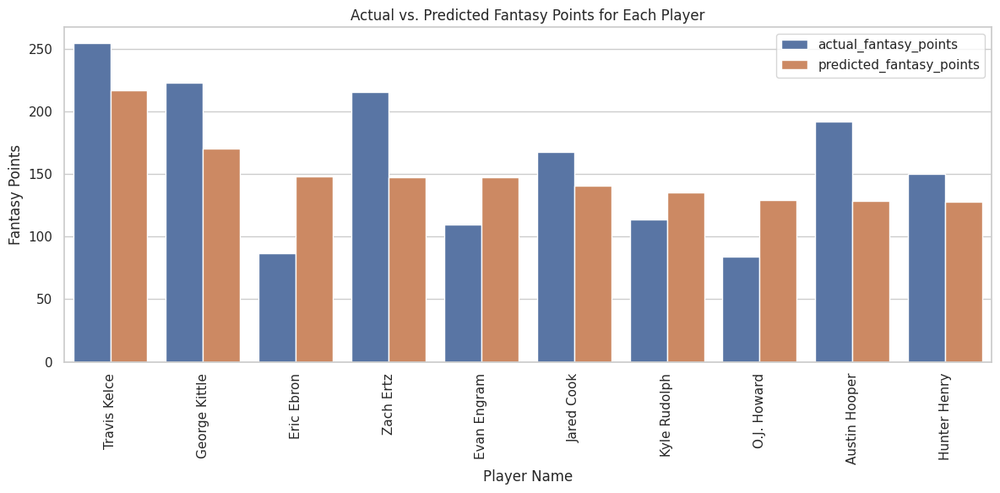

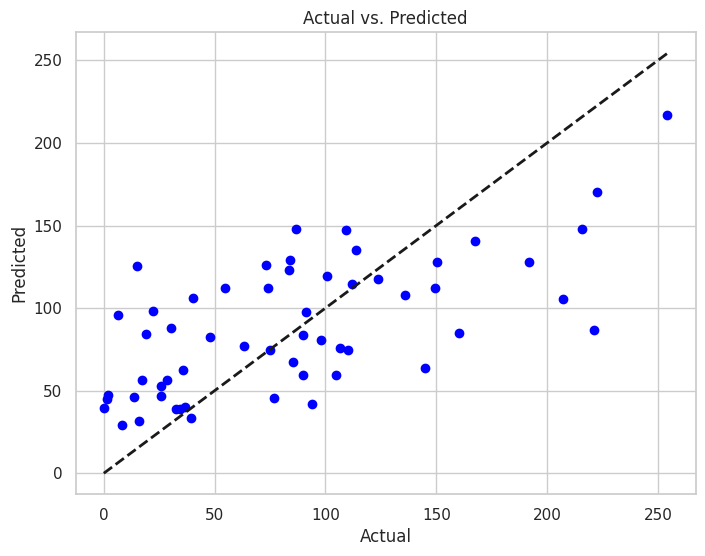

In [ ]:
forest_veteran_results, best_forest_veteran = randomforest(train_X, test_X, train_y, test_y, test_ids_veteran)

In [ ]:
results = pd.concat([forest_rookie_results, forest_veteran_results], ignore_index=True)

results['actual_points_rank'] = results['actual_fantasy_points'].rank(ascending=False)
results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
results = results.sort_values('predicted_fantasy_points',ascending=False)

results.sort_values('predicted_fantasy_points',ascending=False).head(60)

,player_id,player_name,actual_fantasy_points,predicted_fantasy_points,actual_points_rank,predicted_points_rank
8,00-0030506,Travis Kelce,254.3,216.750577,1.0,1.0
9,00-0033288,George Kittle,222.5,170.064941,2.0,2.0
10,00-0031387,Eric Ebron,86.5,147.739674,27.0,3.0
11,00-0030061,Zach Ertz,215.6,147.590118,4.0,4.0
12,00-0033881,Evan Engram,109.4,147.032907,18.0,5.0
13,00-0027061,Jared Cook,167.5,140.796334,7.0,6.0
14,00-0027981,Kyle Rudolph,113.7,135.033619,14.0,7.0
15,00-0033879,O.J. Howard,83.9,128.956763,29.0,8.0
16,00-0032392,Austin Hooper,191.7,128.209380,6.0,9.0
17,00-0033090,Hunter Henry,150.2,128.026240,9.0,10.0


### XGBoost

depth_team: 0.171893
binned_draft_pick_Middle Round: 0.132173
binned_height_78-80: 0.077146
binned_draft_pick_Third Round: 0.058238
first_position_pick: 0.056705
binned_draft_pick_Undrafted: 0.052308
binned_height_72-74: 0.047794
binned_draft_pick_Late Second Round: 0.045810
QB_4000_yards: 0.045589
binned_weight_240-259: 0.041942
binned_draft_pick_Early Second Round: 0.040598
wins: 0.037878
binned_draft_pick_Early First Round: 0.036449
binned_draft_pick_Late Round: 0.033007
years_coached: 0.031975
binned_weight_220-239: 0.031144
binned_draft_pick_Late First Round: 0.029849
binned_height_75-77: 0.019689
binned_weight_260-279: 0.009813
games_played: 0.000000
receiving_yards_after_catch: 0.000000
binned_weight_160-179: 0.000000
binned_weight_180-199: 0.000000
binned_weight_200-219: 0.000000


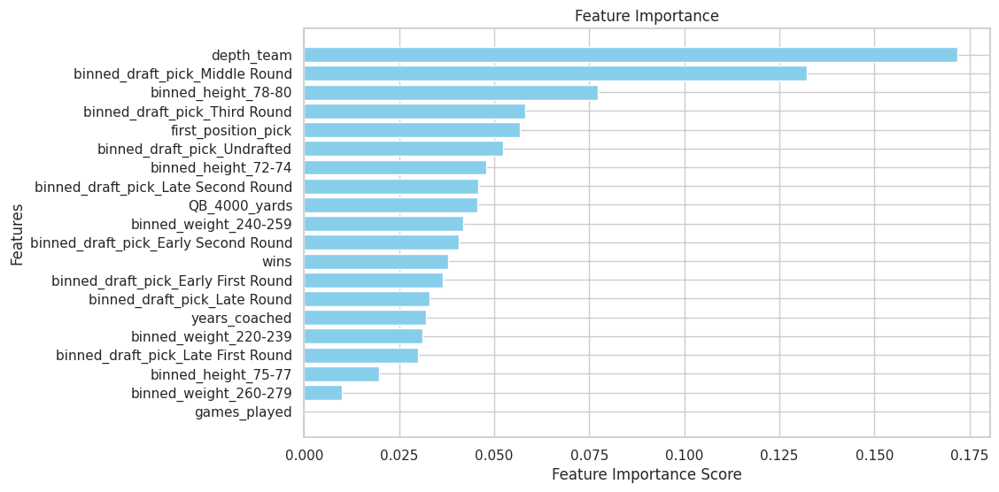

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Root Mean Squared Error: 25.892855676947168
R-squared: 0.48139362792799134


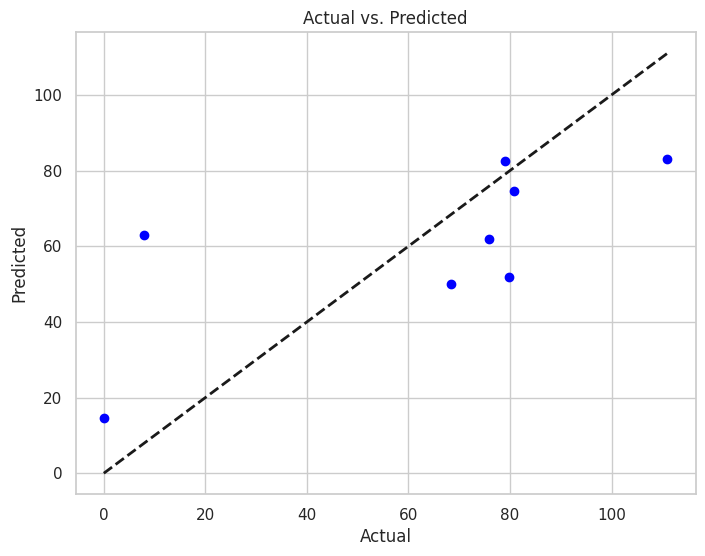

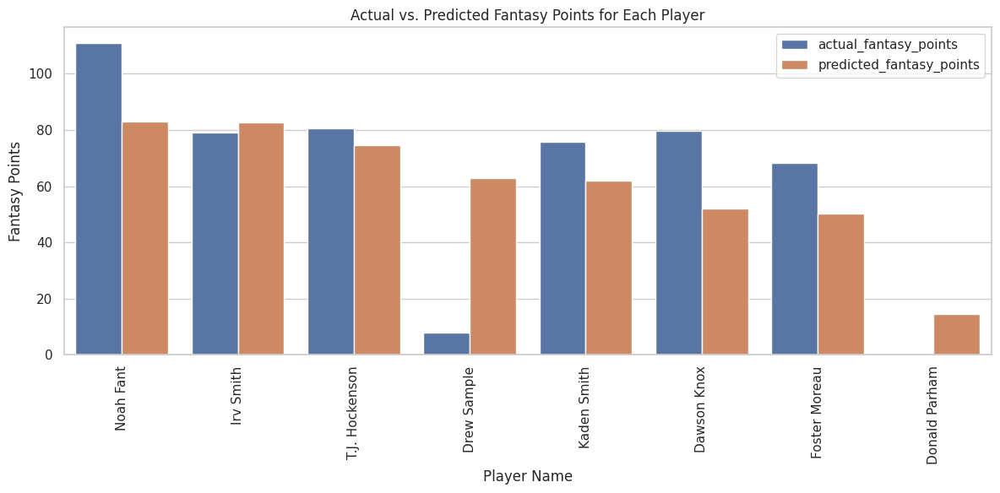

In [ ]:
xgb_rookie_results, best_xgb_rookie = xgboost(train_X_rok, test_X_rok, train_y_rok, test_y_rok, test_ids_rookie)

depth_team: 0.366739
fantasy_points_per_game_last_three_years: 0.061348
binned_draft_pick_Early Second Round: 0.042192
binned_weight_260-279: 0.038911
year_in_league: 0.037639
injury type_ankle: 0.033603
receiving_epa: 0.033038
binned_draft_pick_Late First Round: 0.026867
binned_height_75-77: 0.026821
receiving_yards_after_catch: 0.024820
binned_draft_pick_Early First Round: 0.024102
years_coached: 0.023127
fumbles: 0.022897
binned_height_78-80: 0.019874
binned_draft_pick_Undrafted: 0.019470
new_team: 0.018778
binned_height_72-74: 0.018042
racr: 0.017001
binned_draft_pick_Third Round: 0.015982
games_played: 0.015716
wins: 0.015634
rushing_yards: 0.015608
binned_draft_pick_Late Second Round: 0.012513
QB_4000_yards: 0.012338
binned_draft_pick_Middle Round: 0.011857
injury type_arm/shoulder: 0.009164
binned_draft_pick_Late Round: 0.008187
binned_weight_220-239: 0.007812
injury type_no injury: 0.007727
injury type_leg: 0.006179
binned_weight_240-259: 0.006015
injury type_foot: 0.000000
inj

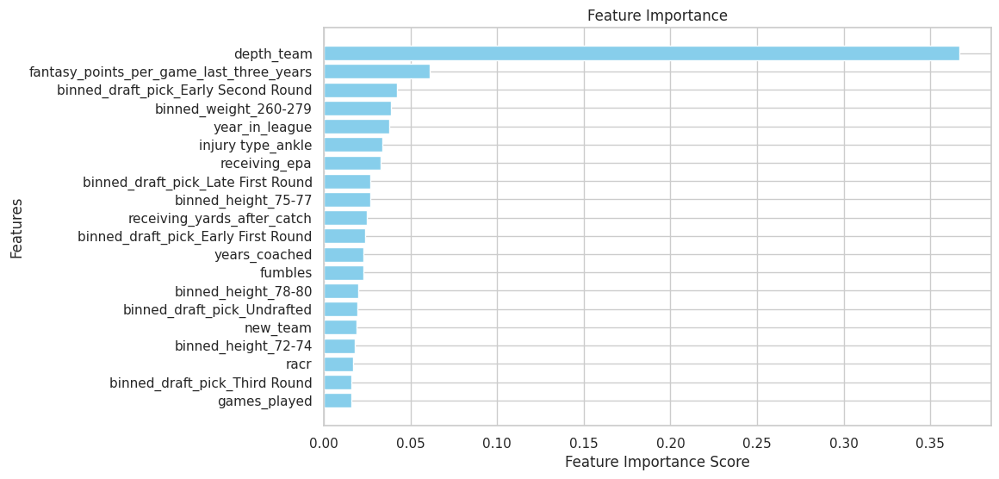

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Root Mean Squared Error: 51.06922405150045
R-squared: 0.3635491949255786


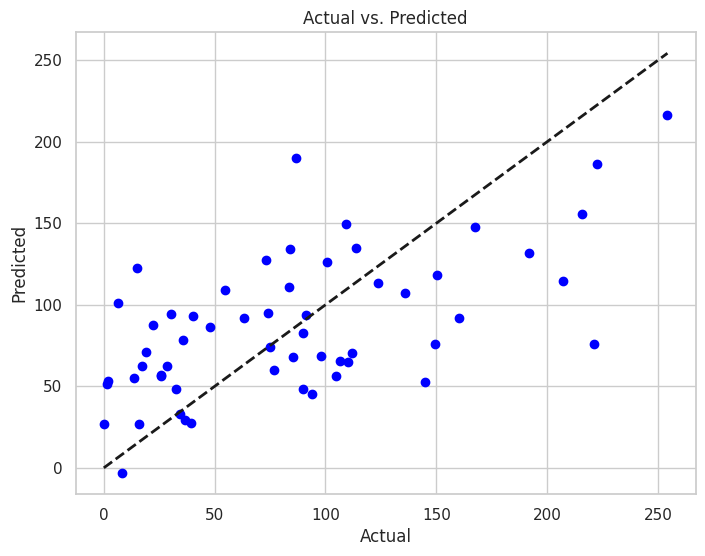

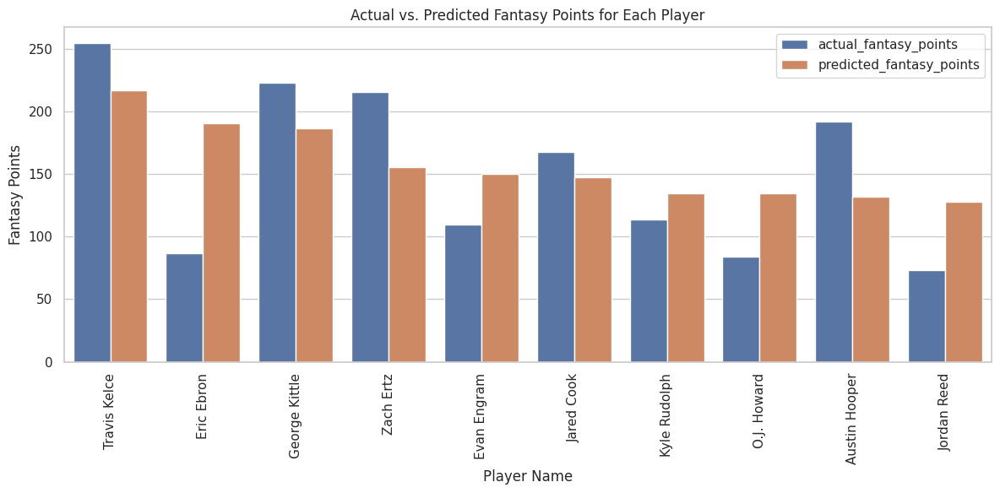

In [ ]:
xgb_veteran_results, best_xgb_veteran = xgboost(train_X, test_X, train_y, test_y, test_ids_veteran)

In [ ]:
results = pd.concat([xgb_rookie_results, xgb_veteran_results], ignore_index=True)

results['actual_points_rank'] = results['actual_fantasy_points'].rank(ascending=False)
results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
results = results.sort_values('predicted_fantasy_points',ascending=False)

results.sort_values('predicted_fantasy_points',ascending=False).head(60)

,player_id,player_name,actual_fantasy_points,predicted_fantasy_points,actual_points_rank,predicted_points_rank
8,00-0030506,Travis Kelce,254.3,216.488571,1.0,1.0
9,00-0031387,Eric Ebron,86.5,190.355362,27.0,2.0
10,00-0033288,George Kittle,222.5,186.585800,2.0,3.0
11,00-0030061,Zach Ertz,215.6,155.664230,4.0,4.0
12,00-0033881,Evan Engram,109.4,149.822357,18.0,5.0
13,00-0027061,Jared Cook,167.5,147.477432,7.0,6.0
14,00-0027981,Kyle Rudolph,113.7,134.756287,14.0,7.0
15,00-0033879,O.J. Howard,83.9,134.344391,29.0,8.0
16,00-0032392,Austin Hooper,191.7,131.598572,6.0,9.0
17,00-0030472,Jordan Reed,73.1,127.514336,38.0,10.0


### Gradient Boosting

depth_team: 0.222537
wins: 0.169756
years_coached: 0.167212
QB_4000_yards: 0.092856
binned_draft_pick_Middle Round: 0.062624
first_position_pick: 0.050826
binned_draft_pick_Early Second Round: 0.047970
binned_weight_240-259: 0.034444
binned_draft_pick_Late Second Round: 0.026546
binned_draft_pick_Undrafted: 0.025267
binned_draft_pick_Late First Round: 0.023580
binned_height_78-80: 0.017293
binned_draft_pick_Third Round: 0.015427
binned_height_75-77: 0.011080
binned_draft_pick_Early First Round: 0.008269
binned_weight_220-239: 0.008185
binned_weight_260-279: 0.005616
binned_draft_pick_Late Round: 0.005592
binned_height_72-74: 0.004919
games_played: 0.000000
receiving_yards_after_catch: 0.000000
binned_weight_160-179: 0.000000
binned_weight_180-199: 0.000000
binned_weight_200-219: 0.000000


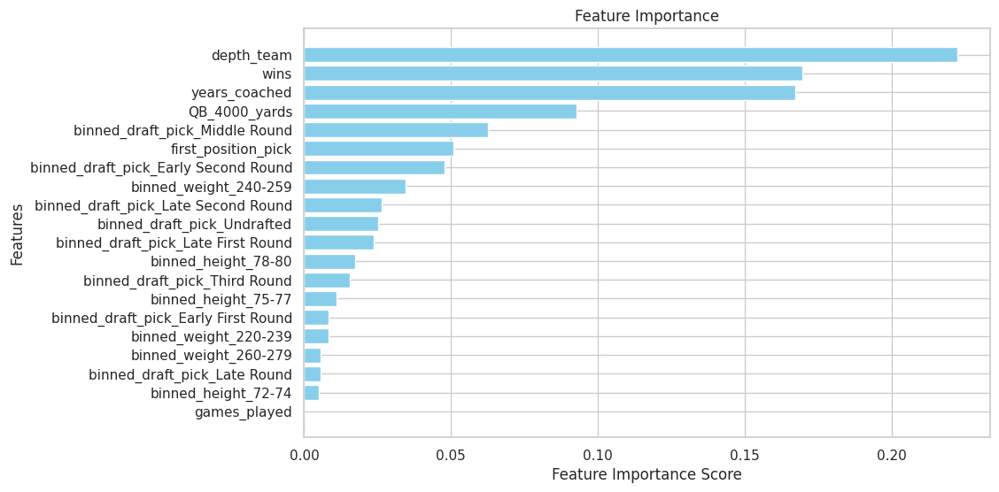

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Root Mean Squared Error: 29.937313714984892
R-squared: 0.30672808959568776


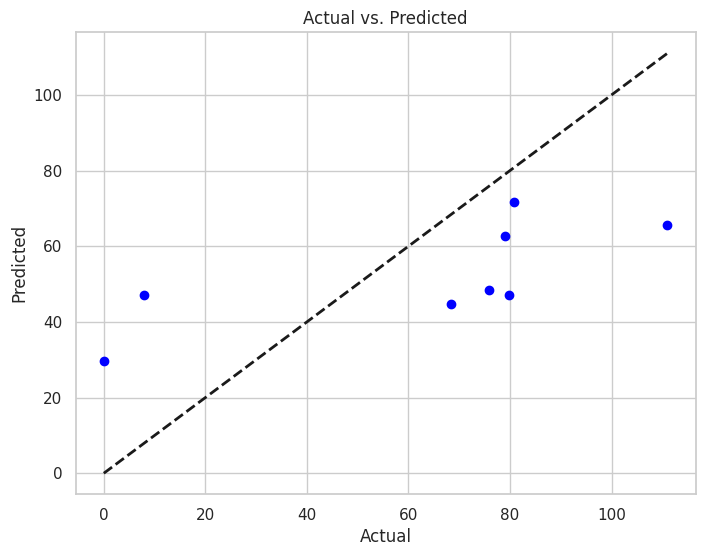

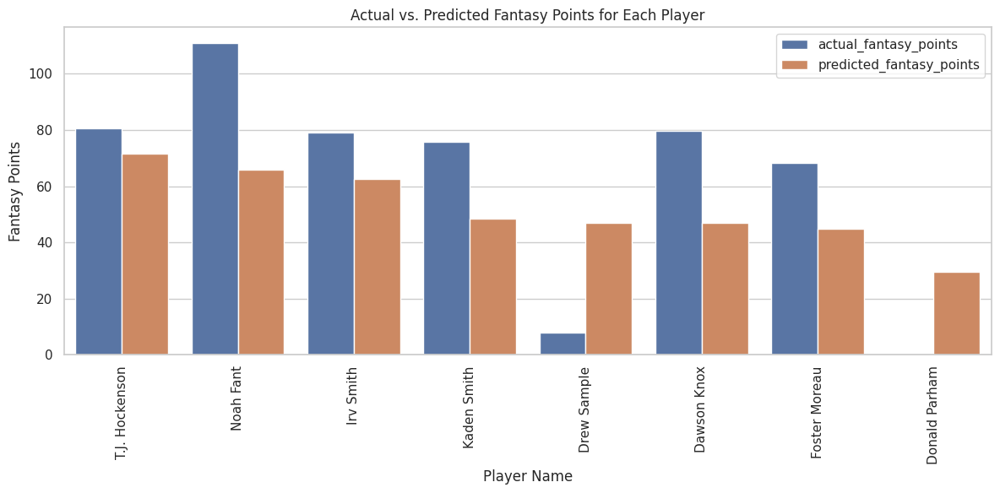

In [ ]:
gb_rookie_results, best_gb_rookie = gradientboosting(train_X_rok, test_X_rok, train_y_rok, test_y_rok, test_ids_rookie)

fantasy_points_per_game_last_three_years: 0.282311
depth_team: 0.274571
receiving_epa: 0.108598
receiving_yards_after_catch: 0.067371
year_in_league: 0.065545
racr: 0.043458
games_played: 0.024916
rushing_yards: 0.015574
wins: 0.014428
binned_weight_260-279: 0.012935
injury type_ankle: 0.009202
binned_draft_pick_Early First Round: 0.008975
fumbles: 0.008965
years_coached: 0.008450
binned_height_75-77: 0.006352
new_team: 0.005989
QB_4000_yards: 0.005461
binned_draft_pick_Late First Round: 0.005376
binned_draft_pick_Late Second Round: 0.004970
binned_draft_pick_Early Second Round: 0.004489
injury type_arm/shoulder: 0.004132
binned_height_72-74: 0.003752
binned_height_78-80: 0.002780
injury type_no injury: 0.002286
injury type_leg: 0.001697
binned_weight_240-259: 0.001588
binned_draft_pick_Third Round: 0.001485
injury type_torso: 0.001462
binned_draft_pick_Late Round: 0.001349
binned_weight_220-239: 0.001308
binned_draft_pick_Undrafted: 0.000148
binned_draft_pick_Middle Round: 0.000076
in

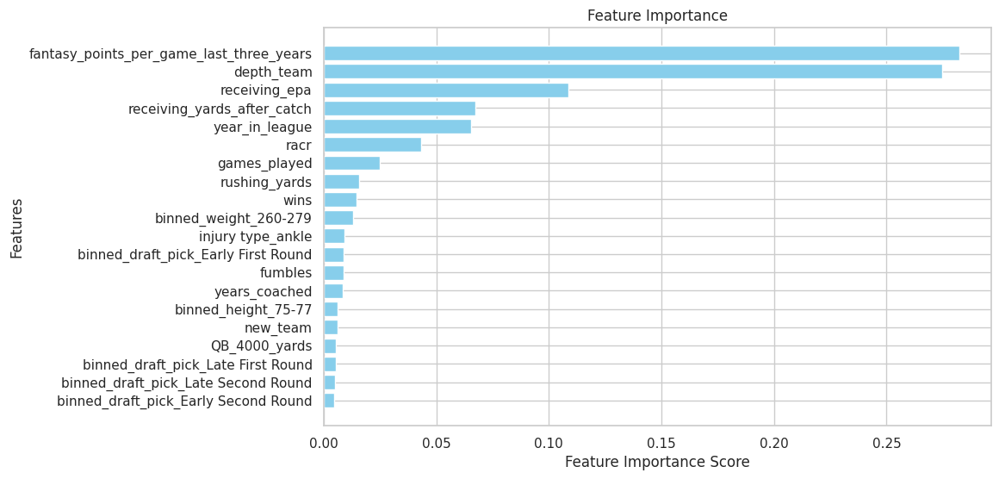

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Root Mean Squared Error: 48.956269671324186
R-squared: 0.41512513421355524


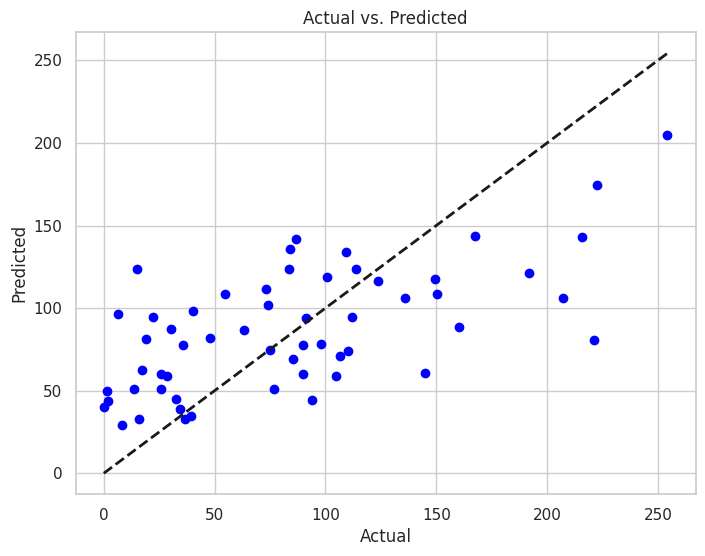

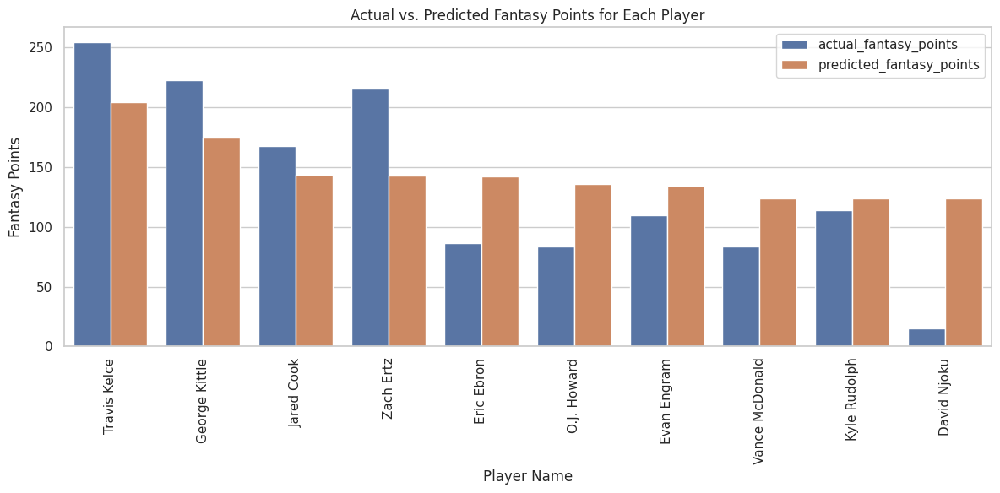

In [ ]:
gb_veteran_results, best_gb_rookie = gradientboosting(train_X, test_X, train_y, test_y, test_ids_veteran)

In [ ]:
results = pd.concat([gb_rookie_results, gb_veteran_results], ignore_index=True)

results['actual_points_rank'] = results['actual_fantasy_points'].rank(ascending=False)
results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
results = results.sort_values('predicted_fantasy_points',ascending=False)

results.sort_values('predicted_fantasy_points',ascending=False).head(60)

,player_id,player_name,actual_fantasy_points,predicted_fantasy_points,actual_points_rank,predicted_points_rank
8,00-0030506,Travis Kelce,254.3,204.639765,1.0,1.0
9,00-0033288,George Kittle,222.5,174.592877,2.0,2.0
10,00-0027061,Jared Cook,167.5,143.360679,7.0,3.0
11,00-0030061,Zach Ertz,215.6,142.783842,4.0,4.0
12,00-0031387,Eric Ebron,86.5,141.908514,27.0,5.0
13,00-0033879,O.J. Howard,83.9,135.655479,29.0,6.0
14,00-0033881,Evan Engram,109.4,134.125018,18.0,7.0
15,00-0030470,Vance McDonald,83.5,123.798975,30.0,8.0
16,00-0027981,Kyle Rudolph,113.7,123.703631,14.0,9.0
17,00-0033885,David Njoku,15.1,123.615603,57.0,10.0


### Voting Regressor

Root Mean Squared Error: 24.583705442437033
R-squared: 0.5325096671488041


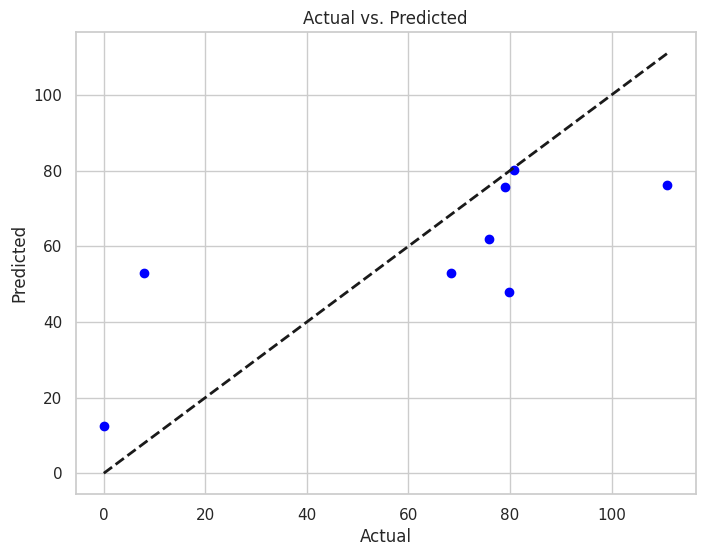

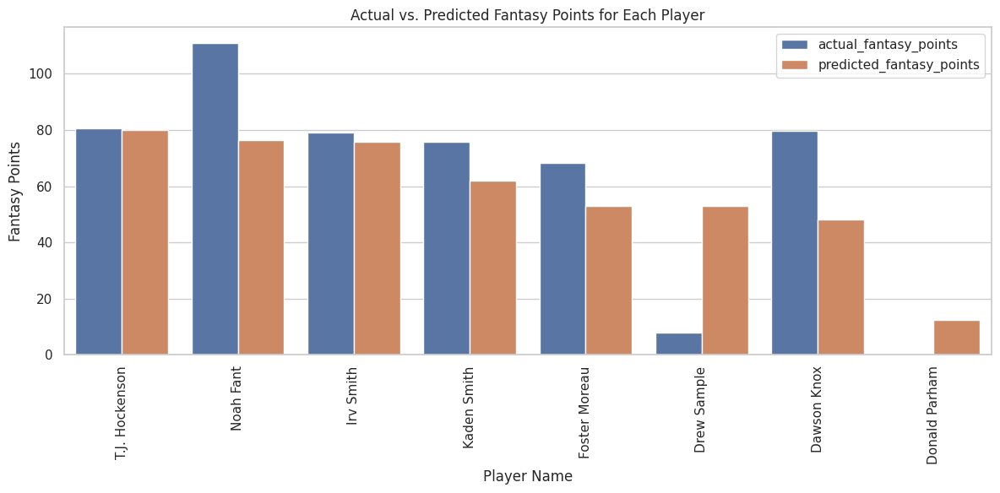

In [ ]:
rookie_results = votingregressor(best_xgb_rookie, best_gb_rookie, best_lasso_rookie, best_forest_rookie ,test_ids_rookie, train_X_rok, train_y_rok, test_X_rok, test_y_rok)

Root Mean Squared Error: 49.58893728271177
R-squared: 0.3999106431473698


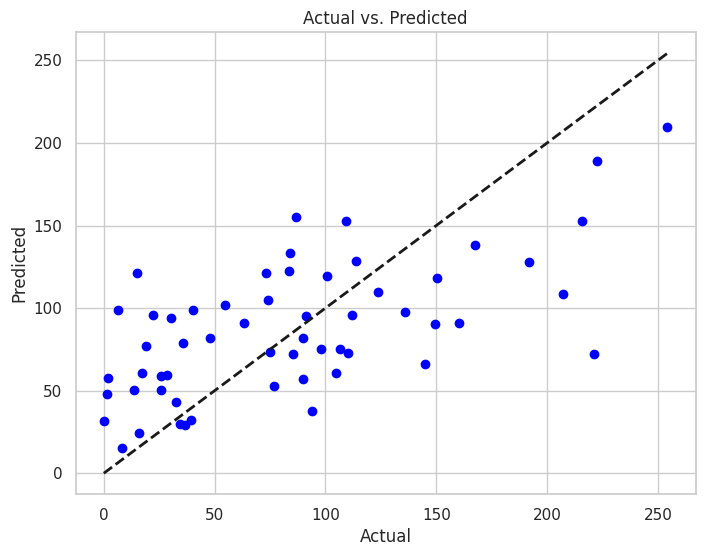

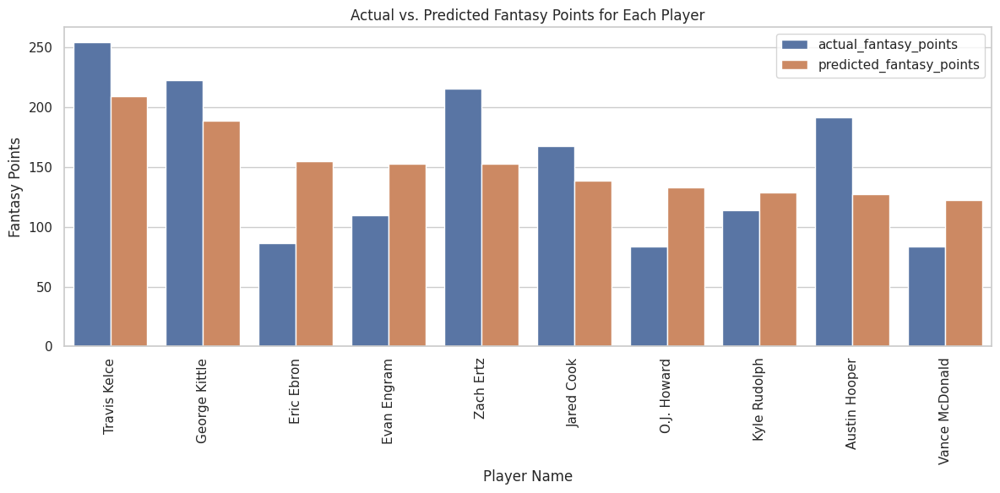

In [ ]:
veteran_results = votingregressor(best_xgb_veteran, best_gb_veteran,best_lasso_veteran,best_forest_veteran,test_ids_veteran, train_X, train_y, test_X, test_y)

In [ ]:
results = pd.concat([rookie_results, veteran_results], ignore_index=True)

results['actual_points_rank'] = results['actual_fantasy_points'].rank(ascending=False)
results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
results = results.sort_values('predicted_fantasy_points',ascending=False)

results.sort_values('predicted_fantasy_points',ascending=False).head(60)

,player_id,player_name,actual_fantasy_points,predicted_fantasy_points,actual_points_rank,predicted_points_rank
8,00-0030506,Travis Kelce,254.3,209.641196,1.0,1.0
9,00-0033288,George Kittle,222.5,188.871050,2.0,2.0
10,00-0031387,Eric Ebron,86.5,154.966615,27.0,3.0
11,00-0033881,Evan Engram,109.4,152.578858,18.0,4.0
12,00-0030061,Zach Ertz,215.6,152.546195,4.0,5.0
13,00-0027061,Jared Cook,167.5,138.424236,7.0,6.0
14,00-0033879,O.J. Howard,83.9,133.095956,29.0,7.0
15,00-0027981,Kyle Rudolph,113.7,128.512396,14.0,8.0
16,00-0032392,Austin Hooper,191.7,127.730985,6.0,9.0
17,00-0030470,Vance McDonald,83.5,122.396908,30.0,10.0


### Rookie Testing

In [ ]:
# Lists that will become columns in dataframe
model = []
te_rok_params = []
te_rok_r2 = []
te_rok_rmse = []
te_rok_top3_percent = []
te_rok_top1_percent = []

In [ ]:
# Run each model on each of the past 5 years to figure out which is best model to use
test_years = [2023, 2022, 2021, 2020, 2019]
for test_year in test_years:

  train_rookie = rookie_te_df[rookie_te_df['season']<test_year]
  test_rookie = rookie_te_df[rookie_te_df['season']==test_year]

  train_X_rok = pd.get_dummies(train_rookie.drop(columns=['player_id','player_name',
                                                  'season','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
  train_y_rok = train_rookie['fantasy_points_ppr_next_season'].astype(float)
  test_X_rok = pd.get_dummies(test_rookie.drop(columns=['player_id','player_name',
                                                  'season','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
  test_y_rok = test_rookie['fantasy_points_ppr_next_season'].astype(float)
  test_X_rok = test_X_rok.reindex(columns=train_X_rok.columns, fill_value=0)

  model.append('lasso')
  rookie_lasso = lasso_results(train_X_rok, test_X_rok, train_y_rok, test_y_rok, te_rok_params, te_rok_r2, te_rok_rmse, te_rok_top3_percent,3, te_rok_top1_percent,1)

  train_rookie = rookie_te_df[rookie_te_df['season']<test_year]
  test_rookie = rookie_te_df[rookie_te_df['season']==test_year]

  train_X_rok = pd.get_dummies(train_rookie.drop(columns=['player_id','player_name',
                                                  'season','fantasy_points_ppr_next_season']),drop_first=False).astype(float)
  train_y_rok = train_rookie['fantasy_points_ppr_next_season'].astype(float)
  test_X_rok = pd.get_dummies(test_rookie.drop(columns=['player_id','player_name',
                                                  'season','fantasy_points_ppr_next_season']),drop_first=False).astype(float)
  test_y_rok = test_rookie['fantasy_points_ppr_next_season'].astype(float)
  test_X_rok = test_X_rok.reindex(columns=train_X_rok.columns, fill_value=0)

  model.append('random forest')
  rookie_forest = randomforest_results(train_X_rok, test_X_rok, train_y_rok, test_y_rok, te_rok_params, te_rok_r2, te_rok_rmse, te_rok_top3_percent,3,  te_rok_top1_percent,1)
  model.append('xgb')
  rookie_xgb = xgboost_results(train_X_rok, test_X_rok, train_y_rok, test_y_rok, te_rok_params, te_rok_r2, te_rok_rmse, te_rok_top3_percent,3,  te_rok_top1_percent,1)
  model.append('gb')
  rookie_gb = gb_results(train_X_rok, test_X_rok, train_y_rok, test_y_rok, te_rok_params, te_rok_r2, te_rok_rmse, te_rok_top3_percent,3,  te_rok_top1_percent,1)
  model.append('voting')
  hypertune_voting_regressor(rookie_xgb, rookie_gb, rookie_lasso, rookie_forest,
                            train_X_rok, test_X_rok, train_y_rok, test_y_rok, te_rok_params, te_rok_r2, te_rok_rmse, te_rok_top3_percent,3,  te_rok_top1_percent,1)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best combination: ['GradientBoostingRegressor', 'Lasso']
Best RMSE: 71.02673355799456
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best combination: ['XGBRegressor', 'GradientBoostingRegressor']
Best RMSE: 43.35793918082669
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best combination: ['Lasso', 'RandomForestRegressor']
Best RMSE: 91.41718830990956
Fitting 5 folds 

In [ ]:
te_rookie_results = pd.DataFrame({
    'model' : model,
    'params': te_rok_params,
    'R2' : te_rok_r2,
    'RMSE' : te_rok_rmse,
    'Top 3 Accuracy' : te_rok_top3_percent,
    'Top 1 Accuracy' : te_rok_top3_percent
})

te_rookie_results.head(60)

,model,params,R2,RMSE,Top 3 Accuracy,Top 1 Accuracy
0,lasso,{'alpha': 0.5},0.190748,69.374316,0.666667,0.666667
1,random forest,"{'max_depth': 3, 'n_estimators': 250}",0.029941,75.954934,0.666667,0.666667
2,xgb,"{'max_depth': 2, 'n_estimators': 10}",0.002193,77.033580,0.666667,0.666667
3,gb,"{'max_depth': 2, 'n_estimators': 30}",0.131521,71.868152,0.666667,0.666667
4,voting,"[GradientBoostingRegressor, Lasso]",0.151738,71.026734,0.666667,0.666667
5,lasso,{'alpha': 0.1},-6.749907,50.471718,0.333333,0.333333
6,random forest,"{'max_depth': 3, 'n_estimators': 350}",-4.878676,43.958170,0.333333,0.333333
7,xgb,"{'max_depth': 2, 'n_estimators': 10}",-4.842585,43.823026,0.000000,0.000000
8,gb,"{'max_depth': 2, 'n_estimators': 30}",-4.612158,42.950162,0.000000,0.000000
9,voting,"[XGBRegressor, GradientBoostingRegressor]",-4.719230,43.357939,0.000000,0.000000


In [ ]:
agg_results = te_rookie_results.groupby('model')[['RMSE', 'R2', 'Top 3 Accuracy']].agg(['mean', 'median', 'std'])

# Sorting by the 'median' of any of the metrics (e.g., 'RMSE')
sorted_results = agg_results.sort_values(by=('RMSE', 'mean'), ascending=True)

sorted_results

# Voting regressor was best model and three out 5 times it was lasso and random forest

RMSE                               R2            \
                    mean     median        std       mean    median   
model                                                                 
voting         48.231739  43.357939  33.116789 -11.236598  0.151738   
lasso          48.682841  50.471718  32.601987 -11.246275  0.190748   
gb             50.097120  42.950162  33.088200 -12.066603  0.131521   
random forest  50.648822  43.958170  33.862059 -11.933933  0.029941   
xgb            52.309878  43.823026  35.814573 -13.499183  0.002193   

                         Top 3 Accuracy                      
                     std           mean    median       std  
model                                                        
voting         23.409226       0.600000  0.666667  0.365148  
lasso          22.465005       0.666667  0.666667  0.235702  
gb             25.160123       0.600000  0.666667  0.365148  
random forest  24.711317       0.666667  0.666667  0.235702  
xgb            28.169612       0.600000  0.666667  0.365148

### Veteran Testing

In [ ]:
model = []
te_params = []
te_r2 = []
te_rmse = []
te_top10_percent = []
te_top20_percent = []

In [ ]:
# Run each model on each of the past 5 years to figure out which is best model to use
test_years = [2023, 2022, 2021, 2020, 2019]
for test_year in test_years:

  # qb_df.dropna(axis = 0, inplace=True)

  train_te = te_df[(te_df['season']<test_year)&(te_df['year_in_league']>1)].dropna(axis = 0)
  test_te = te_df[(te_df['season']==test_year)&(te_df['year_in_league']>1)].dropna(axis = 0)

  train_X = pd.get_dummies(train_te.drop(columns=['player_id','player_name','position','season','fantasy_points_ppr_next_season','first_position_pick']),drop_first=True).astype(float)
  train_y = train_te['fantasy_points_ppr_next_season'].astype(float)
  test_X = pd.get_dummies(test_te.drop(columns=['player_id','player_name','season','position','fantasy_points_ppr_next_season','first_position_pick']),drop_first=True).astype(float)
  test_y = test_te['fantasy_points_ppr_next_season'].astype(float)
  test_X = test_X.reindex(columns=train_X.columns, fill_value=0)

  model.append('lasso')
  veteran_lasso = lasso_results(train_X, test_X, train_y, test_y, te_params, te_r2, te_rmse, te_top10_percent,10, te_top20_percent,20)

  train_X = pd.get_dummies(train_te.drop(columns=['player_id','player_name','season','position','fantasy_points_ppr_next_season','first_position_pick']),drop_first=False).astype(float)
  train_y = train_te['fantasy_points_ppr_next_season'].astype(float)
  test_X = pd.get_dummies(test_te.drop(columns=['player_id','player_name','season','position','fantasy_points_ppr_next_season','first_position_pick']),drop_first=False).astype(float)
  test_y = test_te['fantasy_points_ppr_next_season'].astype(float)
  test_X = test_X.reindex(columns=train_X.columns, fill_value=0)
  model.append('random forest')

  veteran_forest = randomforest_results(train_X, test_X, train_y, test_y, te_params, te_r2, te_rmse, te_top10_percent,10, te_top20_percent,20)
  model.append('xgb')
  veteran_xgb = xgboost_results(train_X, test_X, train_y, test_y,  te_params, te_r2, te_rmse, te_top10_percent,10, te_top20_percent,20)
  model.append('gb')
  veteran_gb = gb_results(train_X, test_X, train_y, test_y, te_params, te_r2, te_rmse, te_top10_percent,10, te_top20_percent,20)
  model.append('voting')
  hypertune_voting_regressor(veteran_xgb, veteran_gb, veteran_lasso, veteran_forest,
                            train_X, test_X, train_y, test_y, te_params, te_r2, te_rmse, te_top10_percent,10, te_top20_percent,20)


Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best combination: ['Lasso', 'RandomForestRegressor']
Best RMSE: 47.86805323538961
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best combination: ['Lasso', 'RandomForestRegressor']
Best RMSE: 45.04278259281617
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best combination: ['GradientBoostingRegressor', 'Lasso']
Best RMSE: 46.63999860492028
Fitting 5 folds for each of

In [ ]:
te_results = pd.DataFrame({
    'model' : model,
    'params': te_params,
    'R2' : te_r2,
    'RMSE' : te_rmse,
    'Top 10 Accuracy' : te_top10_percent,
    'Top 20 Accuracy' : te_top20_percent
})

te_results.head(60)

,model,params,R2,RMSE,Top 10 Accuracy,Top 20 Accuracy
0,lasso,{'alpha': 1},0.428973,48.395000,0.6,0.80
1,random forest,"{'max_depth': 5, 'n_estimators': 200}",0.434550,48.158097,0.6,0.80
2,xgb,"{'max_depth': 2, 'n_estimators': 10}",0.397037,49.729862,0.6,0.70
3,gb,"{'max_depth': 2, 'n_estimators': 50}",0.406810,49.325204,0.6,0.75
4,voting,"[Lasso, RandomForestRegressor]",0.441340,47.868053,0.5,0.80
5,lasso,{'alpha': 1},0.483178,47.463356,0.5,0.70
6,random forest,"{'max_depth': 5, 'n_estimators': 250}",0.532656,45.134236,0.5,0.70
7,xgb,"{'max_depth': 2, 'n_estimators': 15}",0.493061,47.007330,0.6,0.60
8,gb,"{'max_depth': 3, 'n_estimators': 40}",0.491241,47.091660,0.6,0.65
9,voting,"[Lasso, RandomForestRegressor]",0.534548,45.042783,0.5,0.70


In [ ]:
agg_results = te_results.groupby('model')[['RMSE', 'R2', 'Top 10 Accuracy','Top 20 Accuracy']].agg(['mean', 'median', 'std'])

# Sorting by the 'median' of any of the metrics (e.g., 'RMSE')
sorted_results = agg_results.sort_values(by=('RMSE', 'mean'), ascending=True)

sorted_results

# Same thing as rookie model, voting was best and random forest and lasso were most common within it

RMSE                             R2                      \
                    mean     median       std      mean    median       std   
model                                                                         
voting         47.725902  47.868053  1.990621  0.453828  0.441340  0.072233   
random forest  48.357804  48.158097  2.106460  0.439454  0.434550  0.072645   
gb             48.821670  49.204286  1.769737  0.428706  0.409184  0.071535   
xgb            49.247843  49.729862  1.481857  0.419898  0.421092  0.056921   
lasso          49.568600  48.395000  2.381253  0.410516  0.428973  0.083596   

              Top 10 Accuracy                  Top 20 Accuracy         \
                         mean median       std            mean median   
model                                                                   
voting                   0.44    0.5  0.089443            0.70   0.70   
random forest            0.46    0.5  0.114018            0.71   0.70   
gb                       0.48    0.5  0.130384            0.68   0.70   
xgb                      0.48    0.5  0.130384            0.66   0.65   
lasso                    0.44    0.4  0.114018            0.66   0.65   

                         
                    std  
model                    
voting         0.061237  
random forest  0.074162  
gb             0.057009  
xgb            0.041833  
lasso          0.096177

### 2024 Predictions

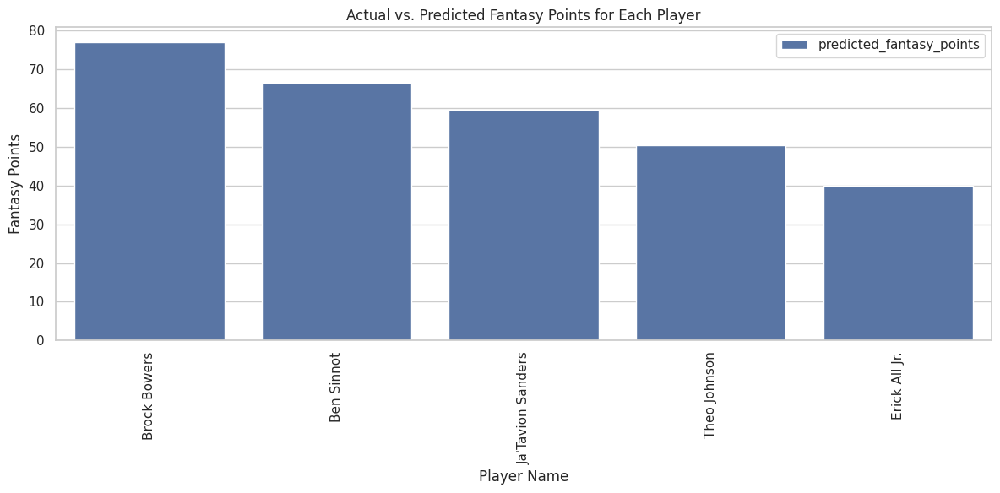

In [127]:
# Model to predict 2024 rookie tes
train_rookie = rookie_te_df[rookie_te_df['season']<2024]
test_rookie = rookie_te_df[rookie_te_df['season']==2024]

train_ids_rookie = train_rookie[['player_id', 'player_name']]
test_ids_rookie = test_rookie[['player_id', 'player_name']]

train_X_rok = pd.get_dummies(train_rookie.drop(columns=['player_id','player_name',
                                                'season','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
train_y_rok = train_rookie['fantasy_points_ppr_next_season'].astype(float)
test_X_rok = pd.get_dummies(test_rookie.drop(columns=['player_id','player_name',
                                                'season','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
test_X_rok = test_X_rok.reindex(columns=train_X_rok.columns, fill_value=0)

# Most optimal parameters based on cross validation
vr = VotingRegressor(estimators=[
        ('lasso', Lasso(alpha=1)),
        ('randomforest', RandomForestRegressor(n_estimators=250, max_depth=3))
    ])

vr.fit(train_X_rok, train_y_rok)
pred_y = vr.predict(test_X_rok)


results = pd.DataFrame({
        'player_id': test_ids_rookie['player_id'],
        'player_name': test_ids_rookie['player_name'],
        'predicted_fantasy_points': pred_y
    })

results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
rookie_results = results.sort_values('predicted_fantasy_points', ascending=False)
top = rookie_results.head(10)

top_predictions_2024(top)

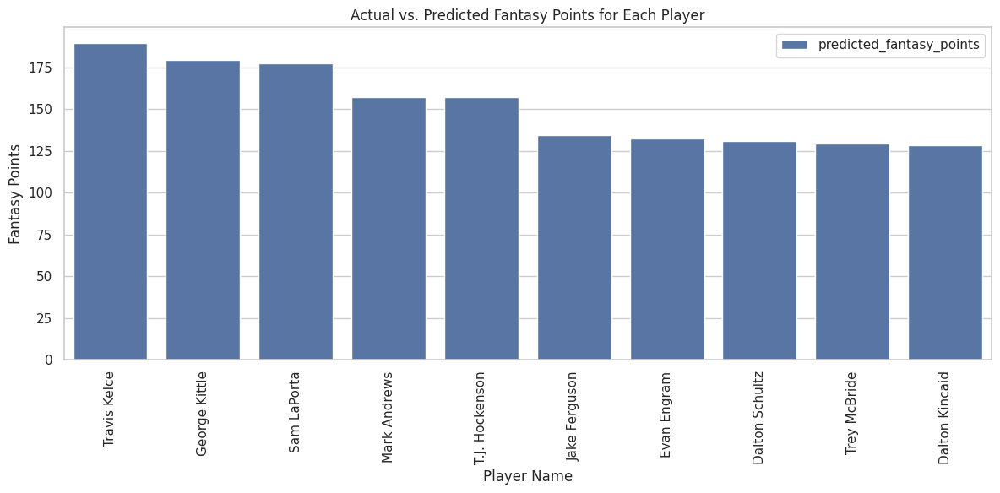

In [128]:
# Model to predict 2024 veteran tes
train_te = te_df[(te_df['season']!=2024)&(te_df['year_in_league']>1)].dropna(axis = 0)
test_te = te_df[(te_df['season']==2024)&(te_df['year_in_league']>1)]

# Saving player_id and player_name before dropping them
train_ids_veteran = train_te[['player_id', 'player_name']]
test_ids_veteran = test_te[['player_id', 'player_name']]

train_X = pd.get_dummies(train_te.drop(columns=['player_id','player_name','season','first_position_pick','fantasy_points_ppr_next_season','position']),drop_first=False).astype(float)
train_y = train_te['fantasy_points_ppr_next_season'].astype(float)
test_X = pd.get_dummies(test_te.drop(columns=['player_id','player_name','season','first_position_pick','fantasy_points_ppr_next_season','position']),drop_first=False).astype(float)
test_X = test_X.reindex(columns=train_X.columns, fill_value=0)

# Most optimal parameters based on cross validation
vr = VotingRegressor(estimators=[
        ('lasso', Lasso(alpha=1)),
        ('randomforest', RandomForestRegressor(n_estimators=250, max_depth=3))
    ])

vr.fit(train_X, train_y)
pred_y = vr.predict(test_X)

results = pd.DataFrame({
        'player_id': test_ids_veteran['player_id'],
        'player_name': test_ids_veteran['player_name'],
        'predicted_fantasy_points': pred_y
    })

results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
veteran_results = results.sort_values('predicted_fantasy_points', ascending=False)
top = veteran_results.head(10)

top_predictions_2024(top)

In [138]:
# Display combined te results
te_results = pd.concat([rookie_results, veteran_results], ignore_index=True)

te_results['predicted_points_rank'] = te_results['predicted_fantasy_points'].rank(ascending=False)
te_results = te_results.sort_values('predicted_fantasy_points',ascending=False)

te_results.sort_values('predicted_fantasy_points',ascending=False).head(60)

,player_id,player_name,predicted_fantasy_points,predicted_points_rank
14,00-0033280,Christian McCaffrey,268.834500,1.0
15,00-0038120,Breece Hall,228.924642,2.0
16,00-0037840,Kyren Williams,214.533366,3.0
17,00-0038542,Bijan Robinson,208.062209,4.0
18,00-0036973,Travis Etienne,202.738036,5.0
19,00-0037256,Rachaad White,201.059156,6.0
20,00-0034844,Saquon Barkley,197.625369,7.0
21,00-0033906,Alvin Kamara,192.550704,8.0
22,00-0035261,Tony Pollard,180.573108,9.0
23,00-0035700,Josh Jacobs,178.613705,10.0


## Running Back Analysis

### Regression

In [129]:
# Regression model for rookie rbs
rookie_rb_df = rb_df[rb_df['year_in_league']==1]
# Drop all columns that don't apply to rookies
rookie_rb_df.drop(columns=[
       'new_team', 'target_share', 'rushing_epa',
      'receiving_tds', 'receiving_yards_after_catch',
      'receiving_epa', 'fumbles', 'Receiving_1000_yards',
       'years_coached', 'wins', 'binned_weight', 'binned_height',
       'fantasy_points_per_game_last_three_years','year_in_league'],inplace=True)

# Remove outliers who got injured early in the season
rookie_rb_df = rookie_rb_df[~((rookie_rb_df['binned_draft_pick'].isin(['Top 5', 'Early First Round', 'Late First Round'])) &
                            (rookie_rb_df['fantasy_points_ppr_next_season'] < 30))]

train_rookie = rookie_rb_df[rookie_rb_df['season']<2023]
test_rookie = rookie_rb_df[rookie_rb_df['season']==2023]

train_ids_rookie = train_rookie[['player_id', 'player_name']]
test_ids_rookie = test_rookie[['player_id', 'player_name']]

train_X_rok = pd.get_dummies(train_rookie.drop(columns=['player_id','player_name',
                                                'season','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
train_y_rok = train_rookie['fantasy_points_ppr_next_season'].astype(float)
test_X_rok = pd.get_dummies(test_rookie.drop(columns=['player_id','player_name',
                                                'season','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
test_y_rok = test_rookie['fantasy_points_ppr_next_season'].astype(float)
test_X_rok = test_X_rok.reindex(columns=train_X_rok.columns, fill_value=0)

<ipython-input-129-cc2f1868d143>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rookie_rb_df.drop(columns=[


In [131]:
# Regression model for veteran rbs
train_rb = rb_df[(rb_df['season']!=2023)&(rb_df['year_in_league']>1)].dropna(axis = 0)
test_rb = rb_df[(rb_df['season']==2023)&(rb_df['year_in_league']>1)].dropna(axis = 0)

# Saving player_id and player_name before dropping them
train_ids_veteran = train_rb[['player_id', 'player_name']]
test_ids_veteran = test_rb[['player_id', 'player_name']]

train_X = pd.get_dummies(train_rb.drop(columns=['player_id','player_name','season','first_position_pick','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
train_y = train_rb['fantasy_points_ppr_next_season'].astype(float)
test_X = pd.get_dummies(test_rb.drop(columns=['player_id','player_name','season','first_position_pick','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
test_y = test_rb['fantasy_points_ppr_next_season'].astype(float)
test_X = test_X.reindex(columns=train_X.columns, fill_value=0)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best alpha: {'alpha': 0.1}
Root Mean Squared Error: 64.75018337864041
R-squared: 0.09246518129108416
Selected Features and their coefficients:
                                 Feature  Coefficient
4                    first_position_pick     7.981062
1                          QB_4000_yards    -2.070632
5    binned_draft_pick_Early First Round   -10.591409
7   binned_draft_pick_Early Second Round   -11.969017
6     binned_draft_pick_Late First Round   -15.094225
8    binned_draft_pick_Late Second Round   -20.686430
3                             depth_team   -22.618397
9          binned_draft_pick_Third Round   -33.194594
11          binned_draft_pick_Late Round   -36.642906
10        binned_draft_pick_Middle Round   -38.062790
12           binned_draft_pick_Undrafted   -48.253824


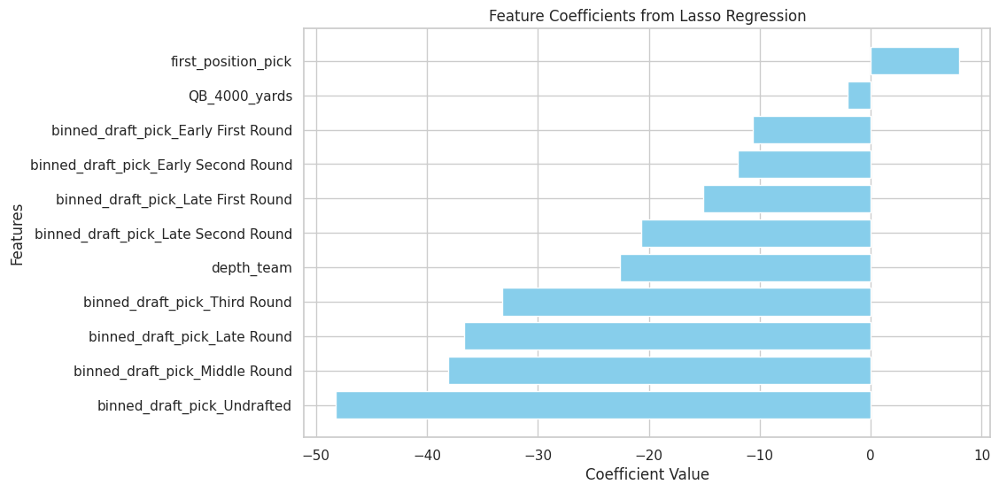

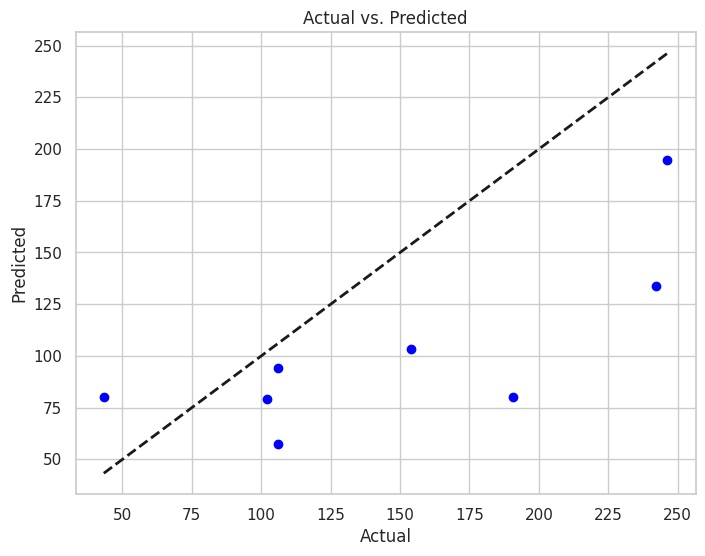

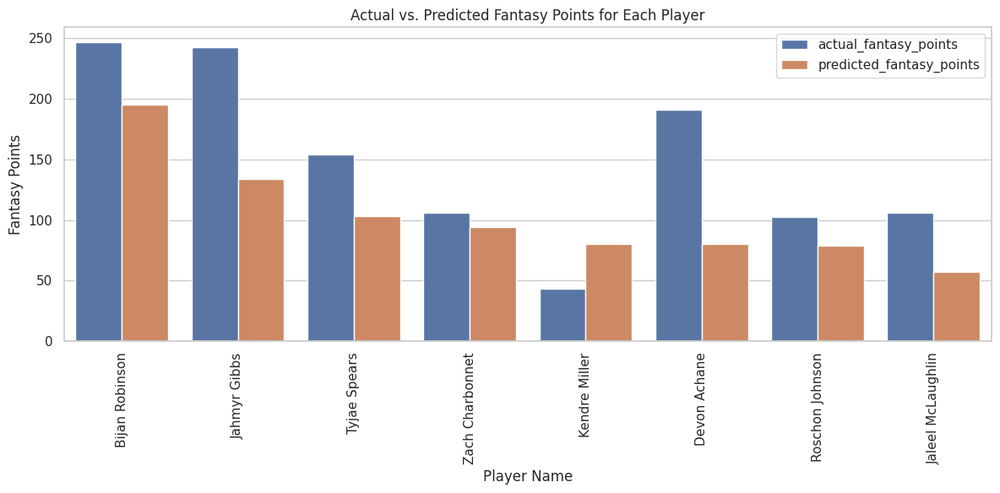

In [130]:
rookie_results, best_lasso_rookie = lasso_regression(train_X_rok, test_X_rok, train_y_rok, test_y_rok, test_ids_rookie)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best alpha: {'alpha': 1}
Root Mean Squared Error: 66.10389577365153
R-squared: 0.46435469748664815
Selected Features and their coefficients:
                                     Feature  Coefficient
9                         fantasy_points_ppr    20.212611
15  fantasy_points_per_game_last_three_years     9.507105
4                               target_share     6.167620
5                                rushing_epa     4.670138
23       binned_draft_pick_Early First Round     4.289000
8                              receiving_epa     2.957616
10                                   fumbles     1.386790
19                     binned_weight_240-259     0.667027
25      binned_draft_pick_Early Second Round     0.552340
11                             years_coached     0.274259
3                       Receiving_1000_yards     0.242268
12                                      wins     0.053130
26       binned_draft_pick_Late Second Round 

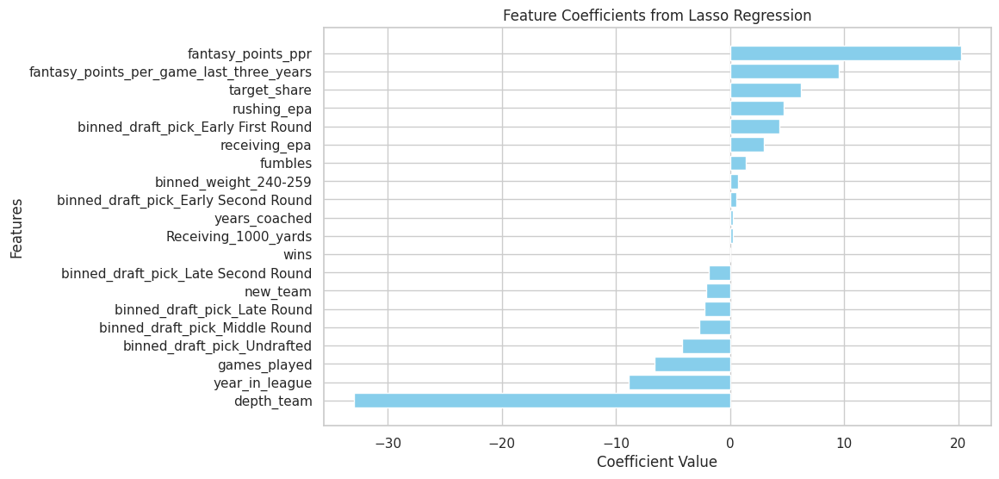

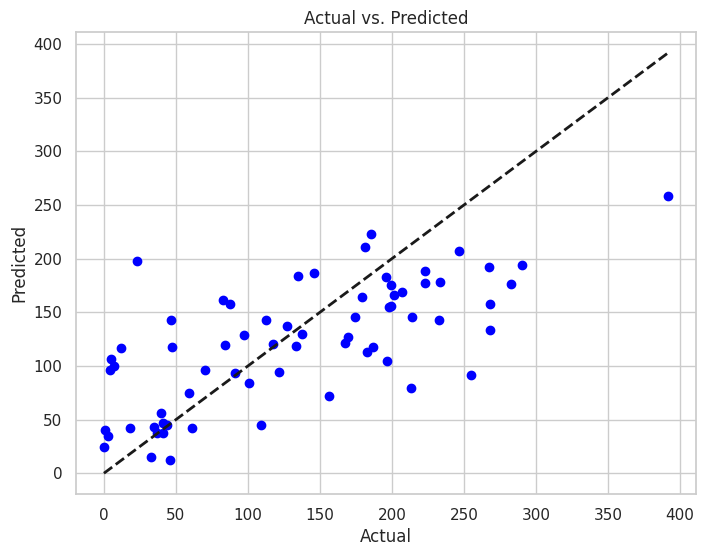

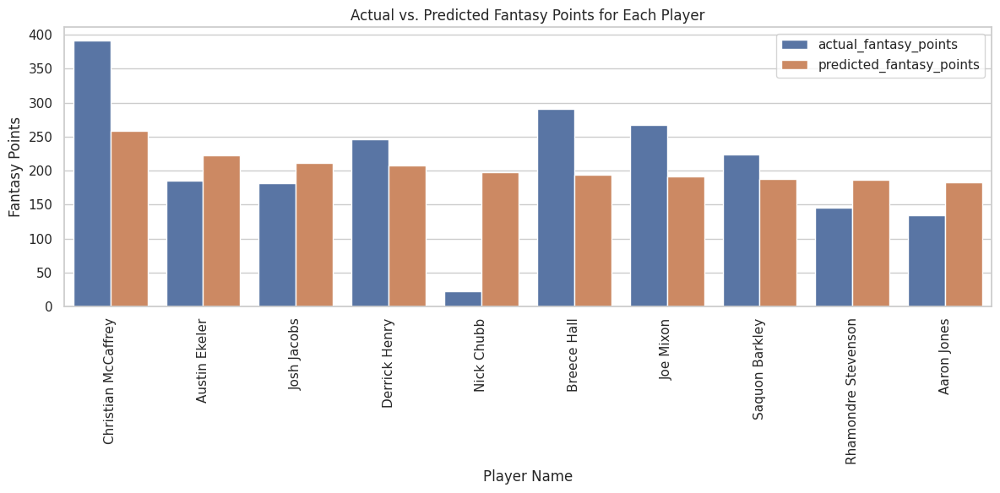

In [132]:
veteran_results, best_lasso_veteran = lasso_regression(train_X, test_X, train_y, test_y, test_ids_veteran)

In [133]:
results = pd.concat([rookie_results, veteran_results], ignore_index=True)

results['actual_points_rank'] = results['actual_fantasy_points'].rank(ascending=False)
results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
results = results.sort_values('predicted_fantasy_points',ascending=False)

results.sort_values('predicted_fantasy_points',ascending=False).head(60)

,player_id,player_name,actual_fantasy_points,predicted_fantasy_points,actual_points_rank,predicted_points_rank
8,00-0033280,Christian McCaffrey,391.30,258.175059,1.0,1.0
9,00-0033699,Austin Ekeler,185.40,222.786854,26.0,2.0
10,00-0035700,Josh Jacobs,181.10,210.870967,28.0,3.0
11,00-0032764,Derrick Henry,246.66,207.518408,8.0,4.0
12,00-0034791,Nick Chubb,23.10,197.873157,67.0,5.0
0,00-0038542,Bijan Robinson,246.30,194.748931,9.0,6.0
13,00-0038120,Breece Hall,290.50,194.014468,2.0,7.0
14,00-0033897,Joe Mixon,267.00,191.804093,6.0,8.0
15,00-0034844,Saquon Barkley,223.20,188.207412,13.0,9.0
16,00-0036875,Rhamondre Stevenson,145.70,186.414060,35.0,10.0


### Random Forest

In [ ]:
# Ensemble model for rookie rbs
train_rookie = rookie_rb_df[rookie_rb_df['season']<2023]
test_rookie = rookie_rb_df[rookie_rb_df['season']==2023]

train_ids_rookie = train_rookie[['player_id', 'player_name']]
test_ids_rookie = test_rookie[['player_id', 'player_name']]

train_X_rok = pd.get_dummies(train_rookie.drop(columns=['player_id','player_name',
                                                'season','fantasy_points_ppr_next_season']),drop_first=False).astype(float)
train_y_rok = train_rookie['fantasy_points_ppr_next_season'].astype(float)
test_X_rok = pd.get_dummies(test_rookie.drop(columns=['player_id','player_name',
                                                'season','fantasy_points_ppr_next_season']),drop_first=False).astype(float)
test_y_rok = test_rookie['fantasy_points_ppr_next_season'].astype(float)
test_X_rok = test_X_rok.reindex(columns=train_X_rok.columns, fill_value=0)

In [ ]:
# Ensemble model for veteran rbs
train_rb = rb_df[(rb_df['season']!=2023)&(rb_df['year_in_league']>1)].dropna(axis = 0)
test_rb = rb_df[(rb_df['season']==2023)&(rb_df['year_in_league']>1)].dropna(axis = 0)

# Saving player_id and player_name before dropping them
train_ids_veteran = train_rb[['player_id', 'player_name']]
test_ids_veteran = test_rb[['player_id', 'player_name']]

train_X = pd.get_dummies(train_rb.drop(columns=['player_id','player_name','season','first_position_pick','fantasy_points_ppr_next_season']),drop_first=False).astype(float)
train_y = train_rb['fantasy_points_ppr_next_season'].astype(float)
test_X = pd.get_dummies(test_rb.drop(columns=['player_id','player_name','season','first_position_pick','fantasy_points_ppr_next_season']),drop_first=False).astype(float)
test_y = test_rb['fantasy_points_ppr_next_season'].astype(float)
test_X = test_X.reindex(columns=train_X.columns, fill_value=0)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best parameters:  RandomForestRegressor(max_depth=3, n_estimators=400, random_state=0)
Root Mean Squared Error: 69.97220489617813
R-squared: -0.05982072806556915


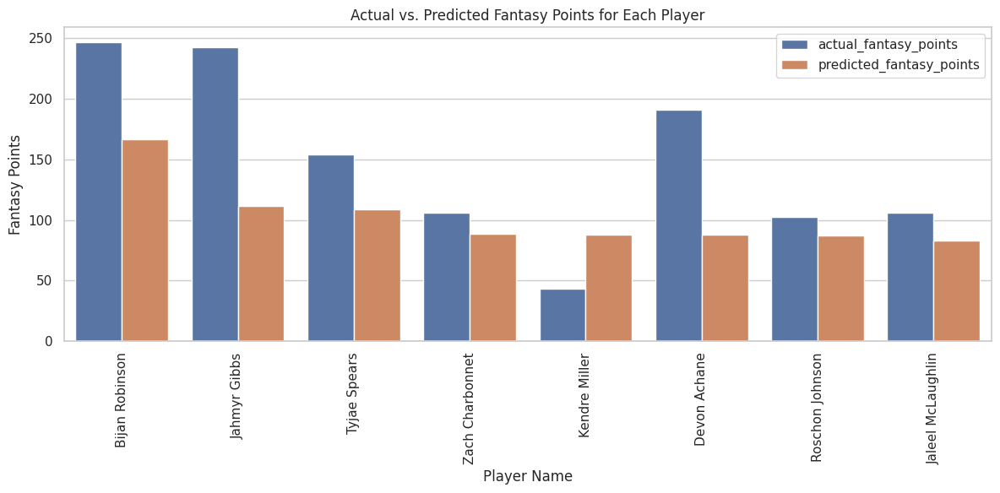

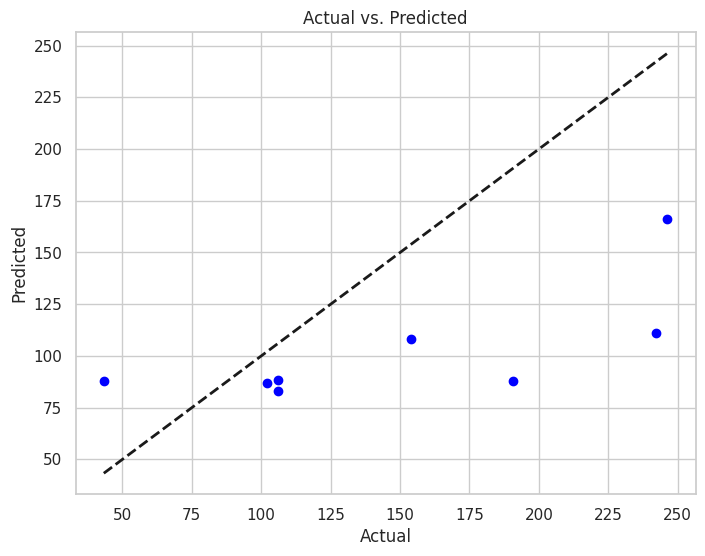

In [ ]:
forest_rookie_results, best_forest_rookie  = randomforest(train_X_rok, test_X_rok, train_y_rok, test_y_rok, test_ids_rookie)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best parameters:  RandomForestRegressor(max_depth=5, n_estimators=400, random_state=0)
Root Mean Squared Error: 69.16399936115536
R-squared: 0.4185999597822234


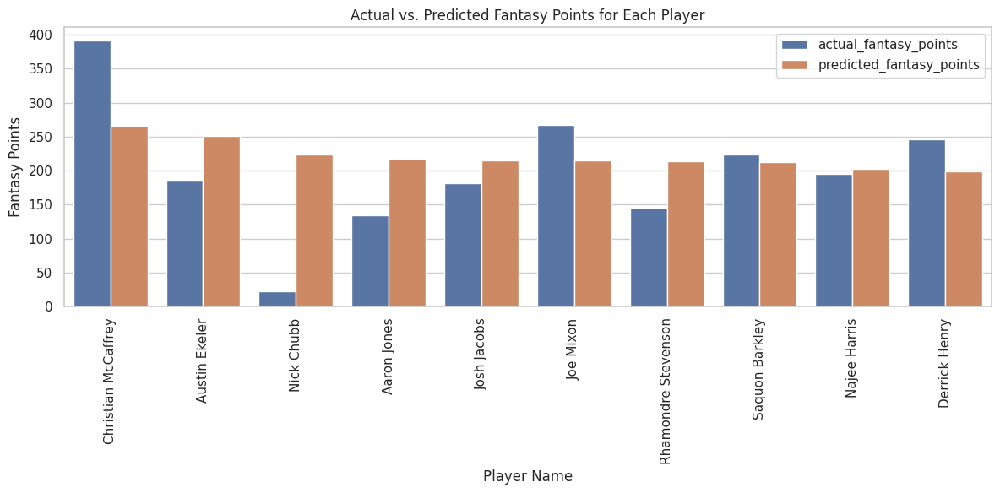

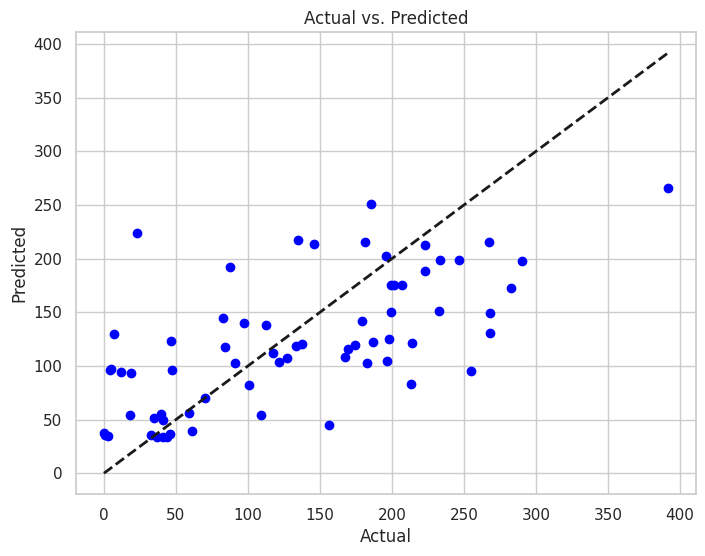

In [ ]:
forest_veteran_results, best_forest_veteran = randomforest(train_X, test_X, train_y, test_y, test_ids_veteran)

In [ ]:
results = pd.concat([forest_rookie_results, forest_veteran_results], ignore_index=True)

results['actual_points_rank'] = results['actual_fantasy_points'].rank(ascending=False)
results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
results = results.sort_values('predicted_fantasy_points',ascending=False)

results.sort_values('predicted_fantasy_points',ascending=False).head(60)

,player_id,player_name,actual_fantasy_points,predicted_fantasy_points,actual_points_rank,predicted_points_rank
8,00-0033280,Christian McCaffrey,391.30,265.611107,1.0,1.0
9,00-0033699,Austin Ekeler,185.40,250.936644,26.0,2.0
10,00-0034791,Nick Chubb,23.10,223.875436,67.0,3.0
11,00-0033293,Aaron Jones,134.90,217.516449,37.0,4.0
12,00-0035700,Josh Jacobs,181.10,215.581560,28.0,5.0
13,00-0033897,Joe Mixon,267.00,215.079976,6.0,6.0
14,00-0036875,Rhamondre Stevenson,145.70,213.741488,35.0,7.0
15,00-0034844,Saquon Barkley,223.20,212.980450,13.0,8.0
16,00-0036893,Najee Harris,195.50,202.447593,23.0,9.0
17,00-0032764,Derrick Henry,246.66,198.753829,8.0,10.0


### XGBoost

binned_draft_pick_Top 5: 0.248483
depth_team: 0.203845
first_position_pick: 0.172922
binned_draft_pick_Early Second Round: 0.074637
binned_draft_pick_Late First Round: 0.056687
binned_draft_pick_Early First Round: 0.044610
binned_draft_pick_Late Round: 0.041291
binned_draft_pick_Undrafted: 0.038386
binned_draft_pick_Third Round: 0.034844
binned_draft_pick_Late Second Round: 0.034108
binned_draft_pick_Middle Round: 0.027160
QB_4000_yards: 0.023029
games_played: 0.000000
fantasy_points_ppr: 0.000000


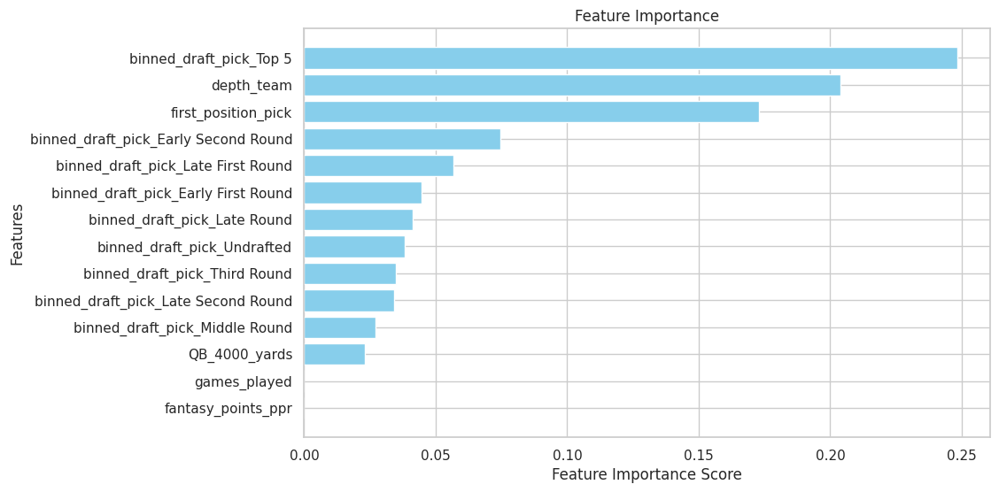

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Root Mean Squared Error: 62.92124151911147
R-squared: 0.14300979667063185


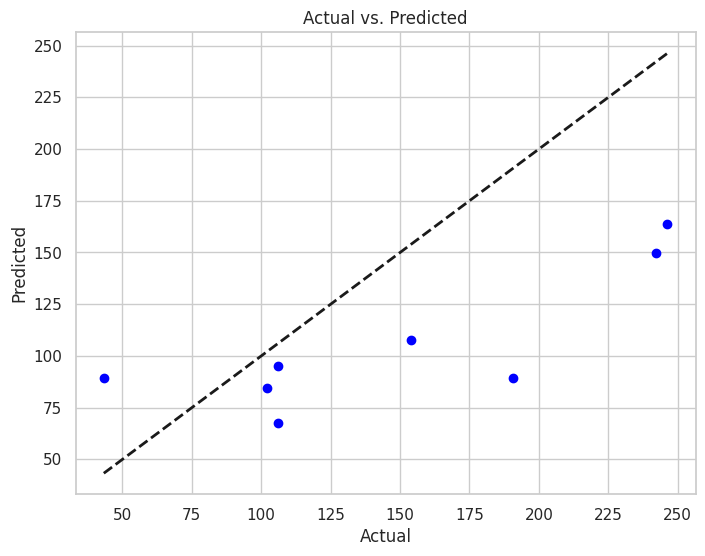

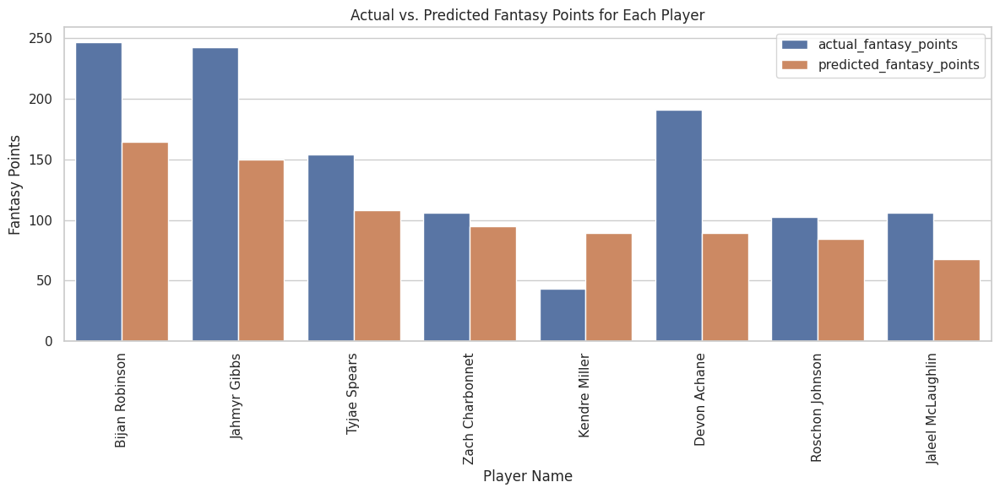

In [ ]:
xgb_rookie_results, best_xgb_rookie = xgboost(train_X_rok, test_X_rok, train_y_rok, test_y_rok, test_ids_rookie)

depth_team: 0.491262
fantasy_points_ppr: 0.057617
fantasy_points_per_game_last_three_years: 0.030053
binned_draft_pick_Undrafted: 0.024001
binned_height_69-71: 0.023671
year_in_league: 0.022807
binned_weight_200-219: 0.022482
binned_weight_240-259: 0.020290
fumbles: 0.020245
target_share: 0.020021
binned_height_72-74: 0.019941
receiving_yards_after_catch: 0.019922
years_coached: 0.019144
receiving_tds: 0.018353
binned_draft_pick_Late First Round: 0.016655
rushing_epa: 0.016442
receiving_epa: 0.015372
wins: 0.015371
binned_draft_pick_Late Second Round: 0.014967
binned_weight_220-239: 0.014623
Receiving_1000_yards: 0.014256
binned_draft_pick_Third Round: 0.013028
new_team: 0.012425
binned_weight_180-199: 0.011733
binned_draft_pick_Early First Round: 0.011415
binned_draft_pick_Middle Round: 0.011281
binned_draft_pick_Top 5: 0.010685
games_played: 0.007474
QB_4000_yards: 0.004466
binned_weight_160-179: 0.000000
binned_weight_260-279: 0.000000
binned_height_66-68: 0.000000
binned_draft_pick

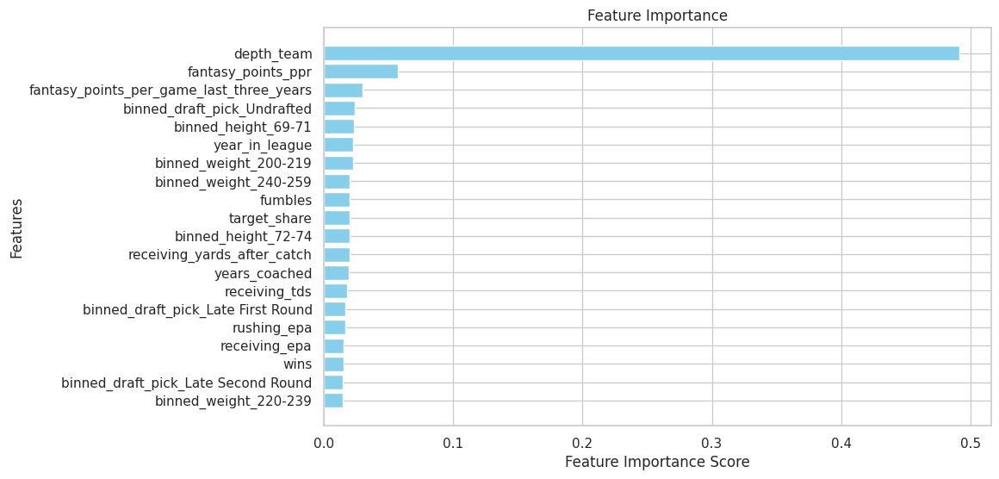

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Root Mean Squared Error: 66.22636974152712
R-squared: 0.46693918351867414


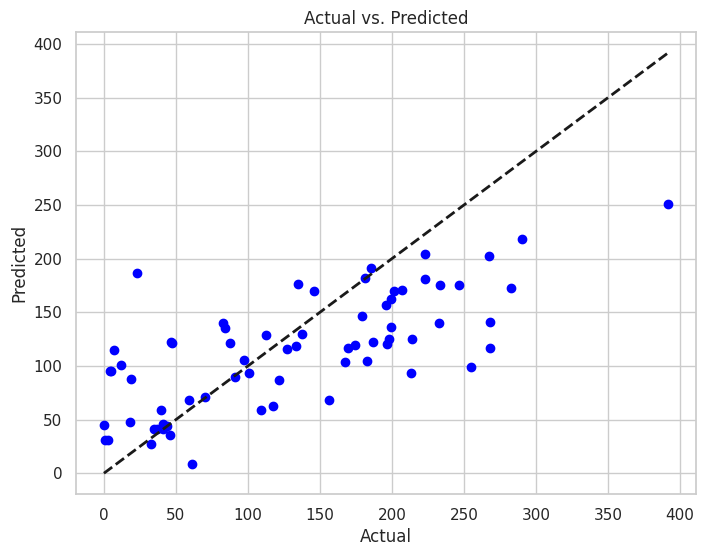

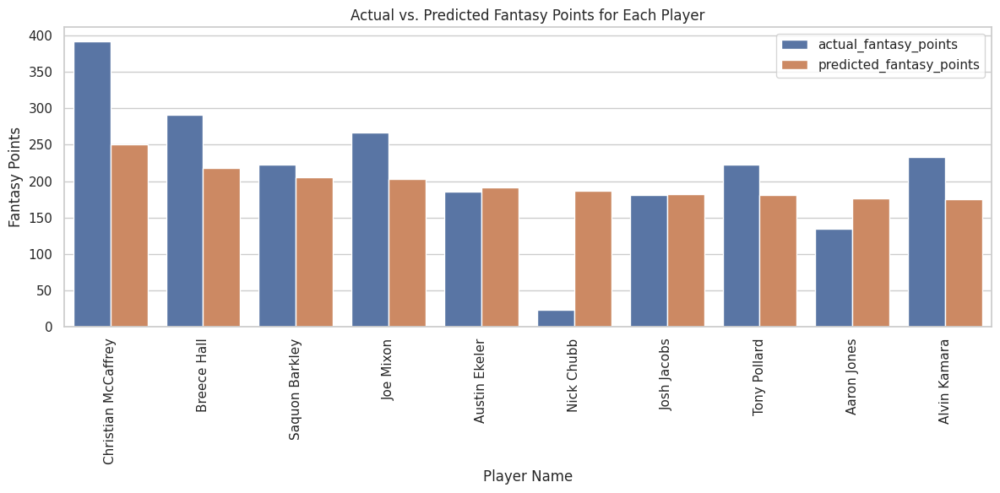

In [ ]:
xgb_veteran_results, best_xgb_veteran = xgboost(train_X, test_X, train_y, test_y, test_ids_veteran)

In [ ]:
results = pd.concat([xgb_rookie_results, xgb_veteran_results], ignore_index=True)

results['actual_points_rank'] = results['actual_fantasy_points'].rank(ascending=False)
results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
results = results.sort_values('predicted_fantasy_points',ascending=False)

results.sort_values('predicted_fantasy_points',ascending=False).head(60)

,player_id,player_name,actual_fantasy_points,predicted_fantasy_points,actual_points_rank,predicted_points_rank
8,00-0033280,Christian McCaffrey,391.30,250.944473,1.0,1.0
9,00-0038120,Breece Hall,290.50,218.011612,2.0,2.0
10,00-0034844,Saquon Barkley,223.20,204.699921,13.0,3.0
11,00-0033897,Joe Mixon,267.00,202.398148,6.0,4.0
12,00-0033699,Austin Ekeler,185.40,191.440292,26.0,5.0
13,00-0034791,Nick Chubb,23.10,186.710373,67.0,6.0
14,00-0035700,Josh Jacobs,181.10,182.277084,28.0,7.0
15,00-0035261,Tony Pollard,222.60,180.915466,14.0,8.0
16,00-0033293,Aaron Jones,134.90,176.728088,37.0,9.0
17,00-0033906,Alvin Kamara,233.00,175.649384,11.0,10.0


### Gradient Boosting

depth_team: 0.497742
binned_draft_pick_Top 5: 0.168128
first_position_pick: 0.069600
binned_draft_pick_Early Second Round: 0.056332
binned_draft_pick_Undrafted: 0.041643
QB_4000_yards: 0.039194
binned_draft_pick_Late First Round: 0.031208
binned_draft_pick_Late Round: 0.029720
binned_draft_pick_Early First Round: 0.028049
binned_draft_pick_Late Second Round: 0.018410
binned_draft_pick_Middle Round: 0.018343
binned_draft_pick_Third Round: 0.001631
games_played: 0.000000
fantasy_points_ppr: 0.000000


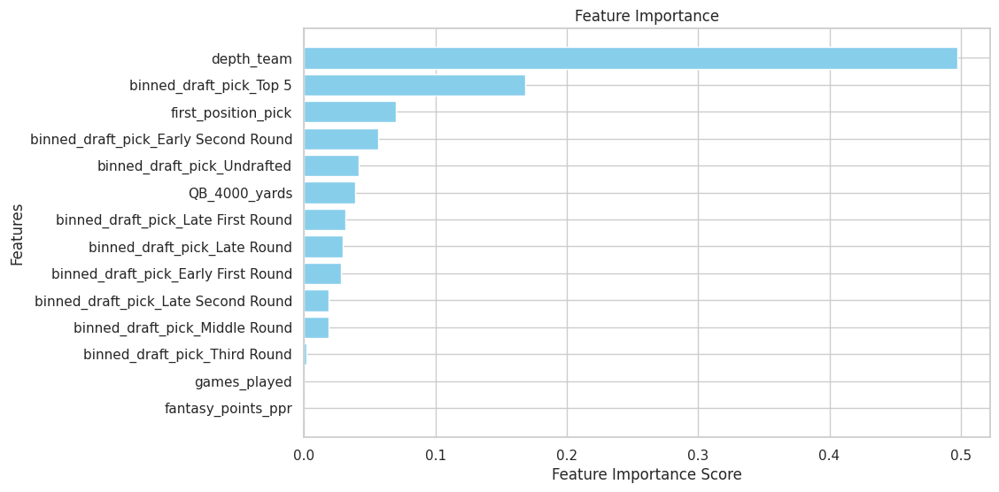

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Root Mean Squared Error: 66.52428267834223
R-squared: 0.04205253725865543


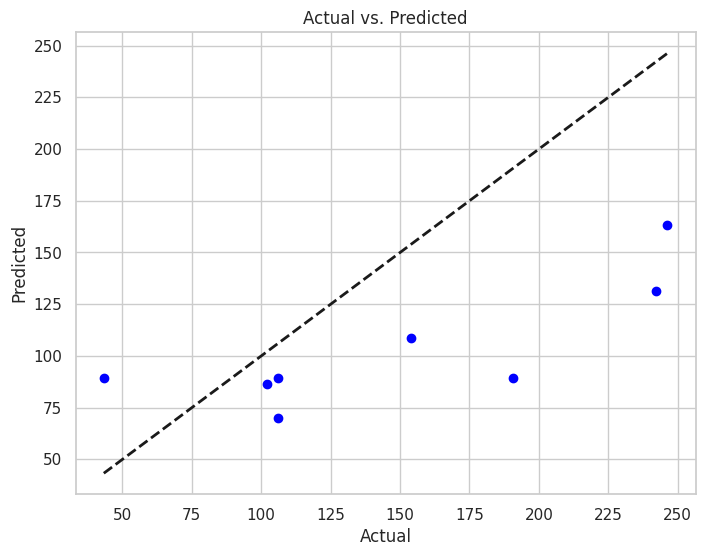

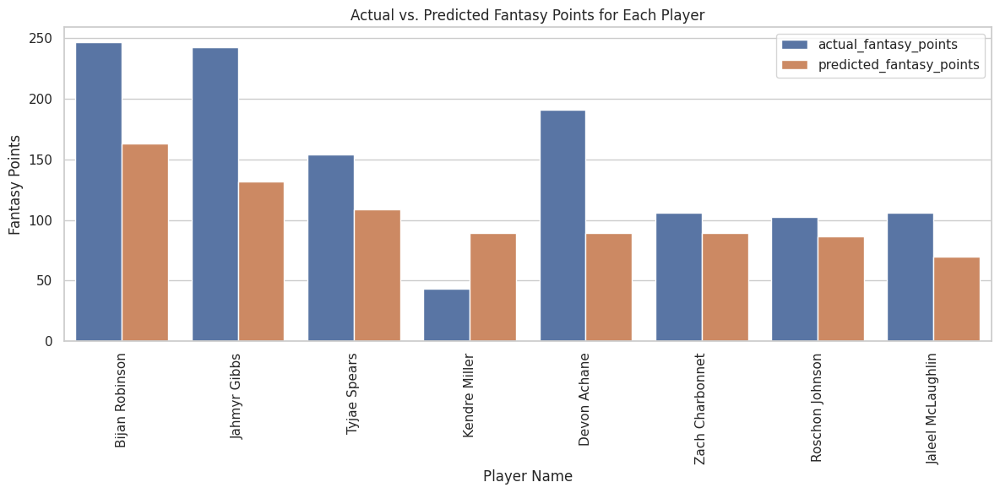

In [ ]:
gb_rookie_results, best_gb_rookie = gradientboosting(train_X_rok, test_X_rok, train_y_rok, test_y_rok, test_ids_rookie)

depth_team: 0.519396
fantasy_points_ppr: 0.140930
fantasy_points_per_game_last_three_years: 0.075381
target_share: 0.054273
rushing_epa: 0.041028
year_in_league: 0.035821
receiving_epa: 0.031932
receiving_yards_after_catch: 0.023529
receiving_tds: 0.012174
binned_draft_pick_Early First Round: 0.009686
fumbles: 0.008652
games_played: 0.008213
years_coached: 0.007142
wins: 0.006568
binned_draft_pick_Late First Round: 0.004987
new_team: 0.004187
binned_weight_240-259: 0.003441
binned_draft_pick_Undrafted: 0.002923
binned_weight_220-239: 0.002567
binned_draft_pick_Early Second Round: 0.001502
binned_draft_pick_Late Second Round: 0.001246
QB_4000_yards: 0.001155
binned_draft_pick_Third Round: 0.000986
binned_height_72-74: 0.000811
binned_weight_200-219: 0.000605
Receiving_1000_yards: 0.000486
binned_draft_pick_Top 5: 0.000215
binned_height_69-71: 0.000164
binned_weight_160-179: 0.000000
binned_weight_180-199: 0.000000
binned_weight_260-279: 0.000000
binned_height_66-68: 0.000000
binned_draf

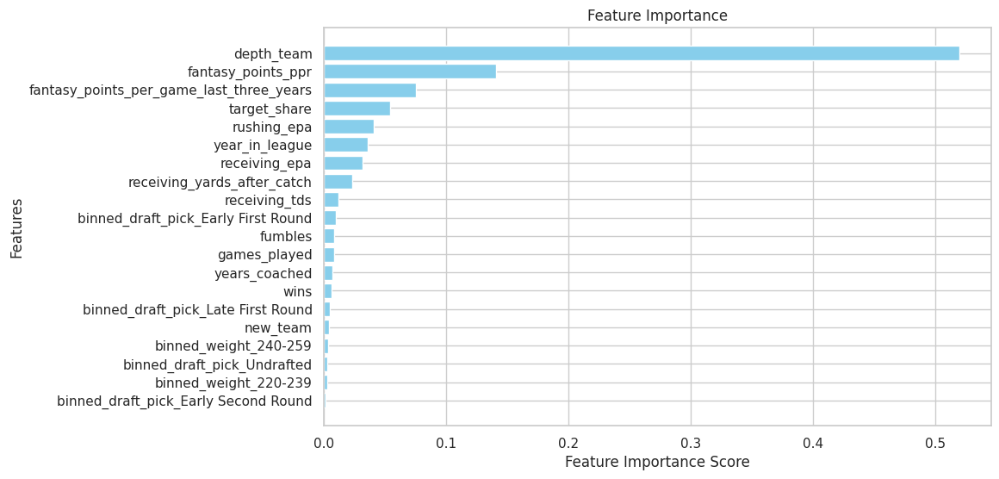

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Root Mean Squared Error: 69.12419283036537
R-squared: 0.4192690031812526


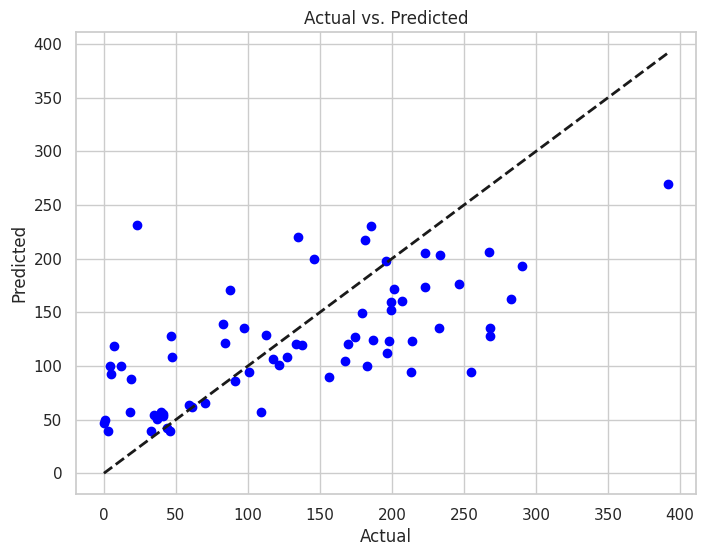

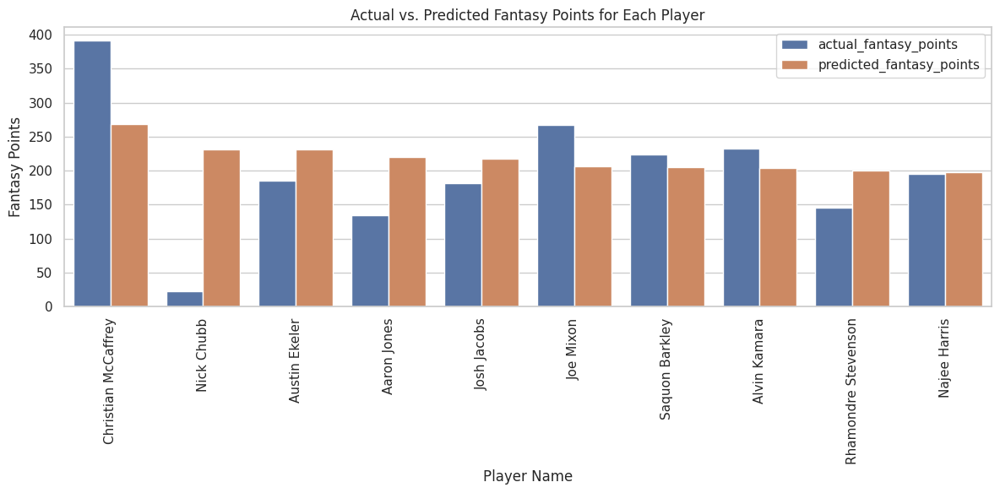

In [ ]:
gb_veteran_results, best_gb_veteran = gradientboosting(train_X, test_X, train_y, test_y, test_ids_veteran)

In [ ]:
results = pd.concat([gb_rookie_results, gb_veteran_results], ignore_index=True)

results['actual_points_rank'] = results['actual_fantasy_points'].rank(ascending=False)
results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
results = results.sort_values('predicted_fantasy_points',ascending=False)

results.sort_values('predicted_fantasy_points',ascending=False).head(60)

,player_id,player_name,actual_fantasy_points,predicted_fantasy_points,actual_points_rank,predicted_points_rank
8,00-0033280,Christian McCaffrey,391.30,269.028021,1.0,1.0
9,00-0034791,Nick Chubb,23.10,231.646926,67.0,2.0
10,00-0033699,Austin Ekeler,185.40,230.762434,26.0,3.0
11,00-0033293,Aaron Jones,134.90,219.856009,37.0,4.0
12,00-0035700,Josh Jacobs,181.10,217.051022,28.0,5.0
13,00-0033897,Joe Mixon,267.00,206.458226,6.0,6.0
14,00-0034844,Saquon Barkley,223.20,204.804526,13.0,7.0
15,00-0033906,Alvin Kamara,233.00,203.737759,11.0,8.0
16,00-0036875,Rhamondre Stevenson,145.70,199.657829,35.0,9.0
17,00-0036893,Najee Harris,195.50,197.813542,23.0,10.0


### Voting Regression

Root Mean Squared Error: 65.8699452135444
R-squared: 0.060804733059760196


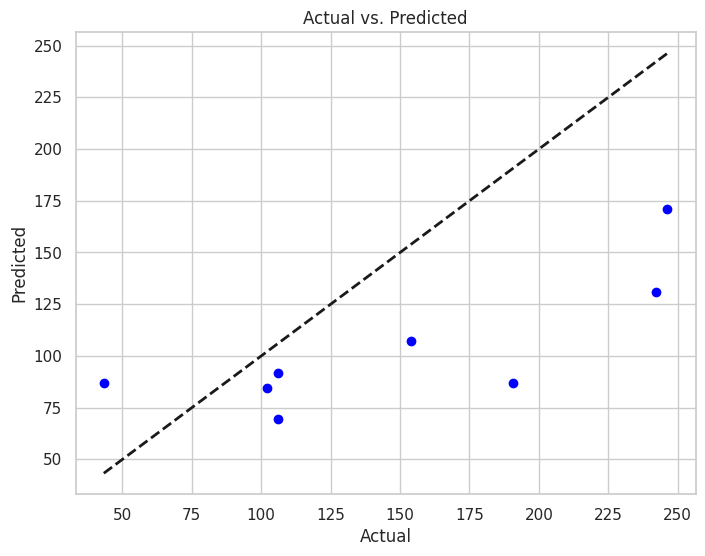

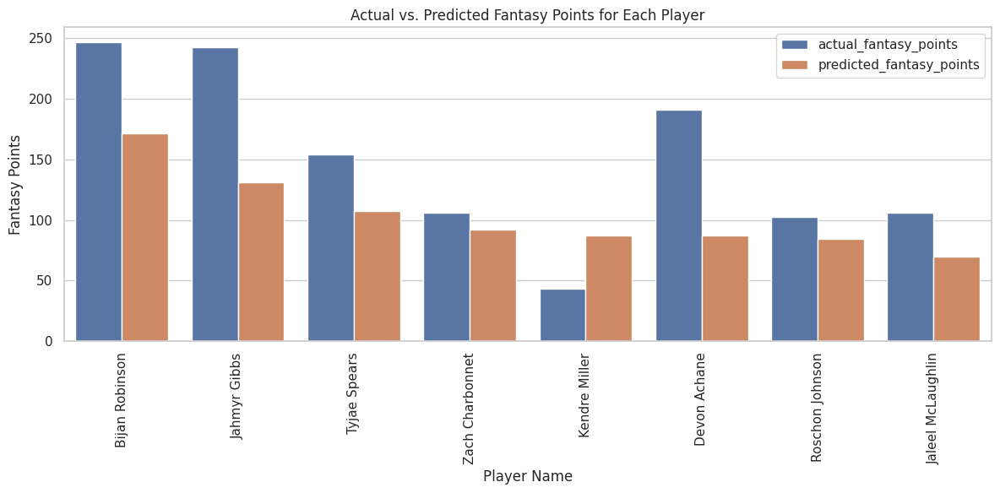

In [ ]:
rookie_results = votingregressor(best_xgb_rookie, best_gb_rookie, best_lasso_rookie, best_forest_rookie ,test_ids_rookie, train_X_rok, train_y_rok, test_X_rok, test_y_rok)

Root Mean Squared Error: 67.2855517525319
R-squared: 0.4497519687569129


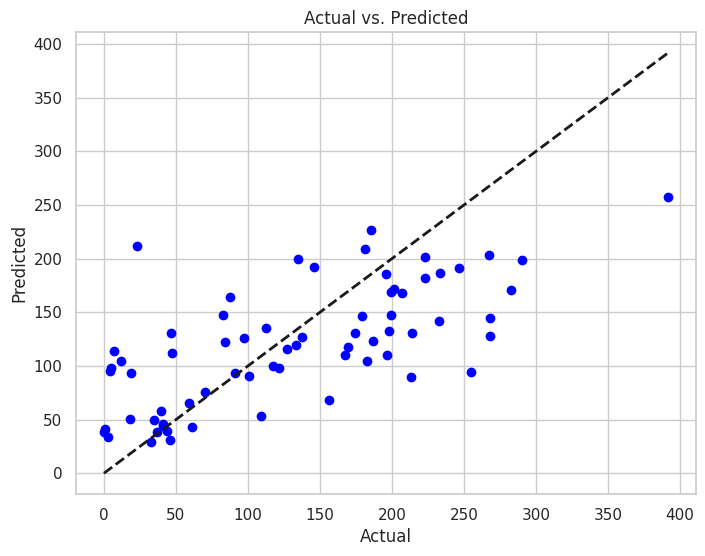

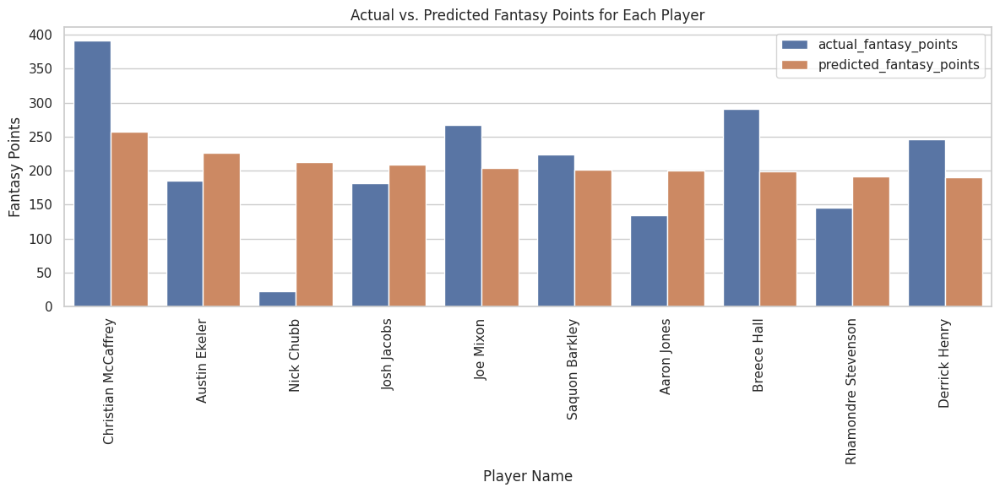

In [ ]:
veteran_results = votingregressor(best_xgb_veteran, best_gb_veteran,best_lasso_veteran,best_forest_veteran,test_ids_veteran, train_X, train_y, test_X, test_y)

In [ ]:
results = pd.concat([rookie_results, veteran_results], ignore_index=True)

results['actual_points_rank'] = results['actual_fantasy_points'].rank(ascending=False)
results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
results = results.sort_values('predicted_fantasy_points',ascending=False)

results.sort_values('predicted_fantasy_points',ascending=False).head(60)

,player_id,player_name,actual_fantasy_points,predicted_fantasy_points,actual_points_rank,predicted_points_rank
8,00-0033280,Christian McCaffrey,391.30,256.970960,1.0,1.0
9,00-0033699,Austin Ekeler,185.40,226.333910,26.0,2.0
10,00-0034791,Nick Chubb,23.10,212.074210,67.0,3.0
11,00-0035700,Josh Jacobs,181.10,208.537679,28.0,4.0
12,00-0033897,Joe Mixon,267.00,203.319250,6.0,5.0
13,00-0034844,Saquon Barkley,223.20,201.505437,13.0,6.0
14,00-0033293,Aaron Jones,134.90,199.980610,37.0,7.0
15,00-0038120,Breece Hall,290.50,198.522670,2.0,8.0
16,00-0036875,Rhamondre Stevenson,145.70,192.056377,35.0,9.0
17,00-0032764,Derrick Henry,246.66,190.787145,8.0,10.0


### Rookie Testing

In [ ]:
# Lists that will become columns in dataframe
model = []
rb_rok_params = []
rb_rok_r2 = []
rb_rok_rmse = []
rb_rok_top5_percent = []
rb_rok_top1_percent = []

In [ ]:
# Run each model on each of the past 5 years to figure out which is best model to use
test_years = [2023, 2022, 2021, 2020, 2019]
for test_year in test_years:

  train_rookie = rookie_rb_df[rookie_rb_df['season']<test_year]
  test_rookie = rookie_rb_df[rookie_rb_df['season']==test_year]

  train_X_rok = pd.get_dummies(train_rookie.drop(columns=['player_id','player_name',
                                                  'season','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
  train_y_rok = train_rookie['fantasy_points_ppr_next_season'].astype(float)
  test_X_rok = pd.get_dummies(test_rookie.drop(columns=['player_id','player_name',
                                                  'season','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
  test_y_rok = test_rookie['fantasy_points_ppr_next_season'].astype(float)
  test_X_rok = test_X_rok.reindex(columns=train_X_rok.columns, fill_value=0)

  model.append('lasso')
  rookie_lasso = lasso_results(train_X_rok, test_X_rok, train_y_rok, test_y_rok, rb_rok_params, rb_rok_r2, rb_rok_rmse, rb_rok_top5_percent,5, rb_rok_top1_percent,1)

  train_rookie = rookie_rb_df[rookie_rb_df['season']<test_year]
  test_rookie = rookie_rb_df[rookie_rb_df['season']==test_year]

  train_X_rok = pd.get_dummies(train_rookie.drop(columns=['player_id','player_name',
                                                  'season','fantasy_points_ppr_next_season']),drop_first=False).astype(float)
  train_y_rok = train_rookie['fantasy_points_ppr_next_season'].astype(float)
  test_X_rok = pd.get_dummies(test_rookie.drop(columns=['player_id','player_name',
                                                  'season','fantasy_points_ppr_next_season']),drop_first=False).astype(float)
  test_y_rok = test_rookie['fantasy_points_ppr_next_season'].astype(float)
  test_X_rok = test_X_rok.reindex(columns=train_X_rok.columns, fill_value=0)

  model.append('random forest')
  rookie_forest = randomforest_results(train_X_rok, test_X_rok, train_y_rok, test_y_rok, rb_rok_params, rb_rok_r2, rb_rok_rmse, rb_rok_top5_percent,5, rb_rok_top1_percent,1)
  model.append('xgb')
  rookie_xgb = xgboost_results(train_X_rok, test_X_rok, train_y_rok, test_y_rok, rb_rok_params, rb_rok_r2, rb_rok_rmse, rb_rok_top5_percent,5, rb_rok_top1_percent,1)
  model.append('gb')
  rookie_gb = gb_results(train_X_rok, test_X_rok, train_y_rok, test_y_rok, rb_rok_params, rb_rok_r2, rb_rok_rmse, rb_rok_top5_percent,5, rb_rok_top1_percent,1)
  model.append('voting')
  hypertune_voting_regressor(rookie_xgb, rookie_gb, rookie_lasso, rookie_forest,
                            train_X_rok, test_X_rok,train_y_rok, test_y_rok, rb_rok_params, rb_rok_r2, rb_rok_rmse, rb_rok_top5_percent,5, rb_rok_top1_percent,1)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best combination: ['GradientBoostingRegressor', 'Lasso']
Best RMSE: 64.94352241868161
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best combination: ['GradientBoostingRegressor', 'Lasso']
Best RMSE: 59.031771859203175
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best combination: ['XGBRegressor', 'GradientBoostingRegressor']
Best RMSE: 64.0860345664388
Fitting 5 fo

In [ ]:
rb_rookie_results = pd.DataFrame({
    'model' : model,
    'params': rb_rok_params,
    'R2' : rb_rok_r2,
    'RMSE' : rb_rok_rmse,
    'Top 5 Accuracy' : rb_rok_top5_percent
})

rb_rookie_results.head(60)

,model,params,R2,RMSE,Top 5 Accuracy
0,lasso,{'alpha': 0.1},0.092465,64.750183,0.8
1,random forest,"{'max_depth': 3, 'n_estimators': 350}",-0.058584,69.931372,0.8
2,xgb,"{'max_depth': 2, 'n_estimators': 15}",0.065776,65.695376,0.8
3,gb,"{'max_depth': 2, 'n_estimators': 50}",0.089291,64.863324,0.8
4,voting,"[GradientBoostingRegressor, Lasso]",0.087037,64.943522,0.8
5,lasso,{'alpha': 0.1},0.083234,59.067693,0.6
6,random forest,"{'max_depth': 4, 'n_estimators': 350}",-0.008911,61.965112,0.6
7,xgb,"{'max_depth': 2, 'n_estimators': 20}",0.027786,60.827747,0.6
8,gb,"{'max_depth': 2, 'n_estimators': 50}",0.061350,59.768552,0.6
9,voting,"[GradientBoostingRegressor, Lasso]",0.084349,59.031772,0.6


In [ ]:
agg_results = rb_rookie_results.groupby('model')[['RMSE', 'R2', 'Top 5 Accuracy']].agg(['mean', 'median', 'std'])

# Sorting by the 'median' of any of the metrics (e.g., 'RMSE')
sorted_results = agg_results.sort_values(by=('RMSE', 'mean'), ascending=True)

sorted_results

# Voting was best model and gradient boosting and lasso were used in it for almost all the years

RMSE                              R2                      \
                    mean     median        std      mean    median       std   
model                                                                          
lasso          65.161773  64.750183   7.203770  0.185743  0.207866  0.103214   
voting         65.749290  64.086035   8.674056  0.173097  0.105813  0.110823   
gb             67.261499  63.882401  10.267979  0.136793  0.089291  0.126102   
xgb            68.057347  64.305096  10.011767  0.115365  0.065776  0.127162   
random forest  71.110319  69.256983  11.168332  0.036503 -0.008911  0.140788   

              Top 5 Accuracy                   
                        mean median       std  
model                                          
lasso                   0.68    0.6  0.109545  
voting                  0.72    0.8  0.109545  
gb                      0.72    0.8  0.109545  
xgb                     0.68    0.6  0.109545  
random forest           0.72    0.8  0.109545

### Veteran Testing

In [ ]:
model = []
rb_params = []
rb_r2 = []
rb_rmse = []
rb_top10_percent = []
rb_top20_percent = []

In [ ]:
# Run each model on each of the past 5 years to figure out which is best model to use
test_years = [2023, 2022, 2021, 2020, 2019]
for test_year in test_years:

  # qb_df.dropna(axis = 0, inplace=True)

  train_rb = rb_df[(rb_df['season']<test_year)&(rb_df['year_in_league']>1)].dropna(axis = 0)
  test_rb = rb_df[(rb_df['season']==test_year)&(rb_df['year_in_league']>1)].dropna(axis = 0)

  train_X = pd.get_dummies(train_rb.drop(columns=['player_id','player_name','season','fantasy_points_ppr_next_season','first_position_pick']),drop_first=True).astype(float)
  train_y = train_rb['fantasy_points_ppr_next_season'].astype(float)
  test_X = pd.get_dummies(test_rb.drop(columns=['player_id','player_name','season','fantasy_points_ppr_next_season','first_position_pick']),drop_first=True).astype(float)
  test_y = test_rb['fantasy_points_ppr_next_season'].astype(float)
  test_X = test_X.reindex(columns=train_X.columns, fill_value=0)

  model.append('lasso')
  veteran_lasso = lasso_results(train_X, test_X, train_y, test_y, rb_params, rb_r2, rb_rmse, rb_top10_percent,10, rb_top20_percent,20)

  train_X = pd.get_dummies(train_rb.drop(columns=['player_id','player_name','season','fantasy_points_ppr_next_season','first_position_pick']),drop_first=False).astype(float)
  train_y = train_rb['fantasy_points_ppr_next_season'].astype(float)
  test_X = pd.get_dummies(test_rb.drop(columns=['player_id','player_name','season','fantasy_points_ppr_next_season','first_position_pick']),drop_first=False).astype(float)
  test_y = test_rb['fantasy_points_ppr_next_season'].astype(float)
  test_X = test_X.reindex(columns=train_X.columns, fill_value=0)
  model.append('random forest')

  veteran_forest = randomforest_results(train_X, test_X, train_y, test_y, rb_params, rb_r2, rb_rmse, rb_top10_percent,10, rb_top20_percent,20)
  model.append('xgb')
  veteran_xgb = xgboost_results(train_X, test_X, train_y, test_y, rb_params, rb_r2, rb_rmse, rb_top10_percent,10, rb_top20_percent,20)
  model.append('gb')
  veteran_gb = gb_results(train_X, test_X, train_y, test_y, rb_params, rb_r2, rb_rmse, rb_top10_percent,10, rb_top20_percent,20)
  model.append('voting')
  hypertune_voting_regressor(veteran_xgb, veteran_gb, veteran_lasso, veteran_forest,
                            train_X, test_X, train_y, test_y, rb_params, rb_r2, rb_rmse, rb_top10_percent,10, rb_top20_percent,20)


Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best combination: ['XGBRegressor', 'Lasso']
Best RMSE: 67.72584562724226
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best combination: ['XGBRegressor', 'GradientBoostingRegressor', 'Lasso']
Best RMSE: 65.2773644142861
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best combination: ['XGBRegressor', 'GradientBoostingRegressor']
Best RMSE: 59.13971127187413
Fitting 5 

In [ ]:
rb_results = pd.DataFrame({
    'model' : model,
    'params': rb_params,
    'R2' : rb_r2,
    'RMSE' : rb_rmse,
    'Top 10 Accuracy' : rb_top10_percent,
    'Top 20 Accuracy' : rb_top20_percent
})

rb_results.head(60)

,model,params,R2,RMSE,Top 10 Accuracy,Top 20 Accuracy
0,lasso,{'alpha': 1},0.463144,66.461694,0.4,0.55
1,random forest,"{'max_depth': 5, 'n_estimators': 350}",0.418499,69.170023,0.3,0.65
2,xgb,"{'max_depth': 2, 'n_estimators': 15}",0.426996,68.662810,0.4,0.65
3,gb,"{'max_depth': 2, 'n_estimators': 40}",0.416598,69.282968,0.4,0.60
4,voting,"[XGBRegressor, Lasso]",0.442527,67.725846,0.4,0.60
5,lasso,{'alpha': 1},0.466061,67.338274,0.4,0.70
6,random forest,"{'max_depth': 5, 'n_estimators': 350}",0.482895,66.268198,0.4,0.75
7,xgb,"{'max_depth': 2, 'n_estimators': 10}",0.495123,65.480015,0.5,0.75
8,gb,"{'max_depth': 2, 'n_estimators': 40}",0.496334,65.401456,0.4,0.70
9,voting,"[XGBRegressor, GradientBoostingRegressor, Lasso]",0.498243,65.277364,0.4,0.70


In [ ]:
agg_results = rb_results.groupby('model')[['RMSE', 'R2', 'Top 10 Accuracy','Top 20 Accuracy']].agg(['mean', 'median', 'std'])

# Sorting by the 'median' of any of the metrics (e.g., 'RMSE')
sorted_results = agg_results.sort_values(by=('RMSE', 'mean'), ascending=True)

sorted_results

# All the models were very similar, I decided to use voting with lasso, gb, and xgb

RMSE                             R2                      \
                    mean     median       std      mean    median       std   
model                                                                         
voting         63.429566  65.277364  4.439651  0.473482  0.494470  0.121768   
xgb            63.979257  65.480015  4.238843  0.466382  0.495123  0.112424   
gb             64.350583  65.401456  4.440563  0.458385  0.480627  0.123790   
random forest  64.852140  66.268198  3.991207  0.451324  0.474644  0.115770   
lasso          64.897613  66.461694  4.891203  0.444818  0.463144  0.150490   

              Top 10 Accuracy                  Top 20 Accuracy         \
                         mean median       std            mean median   
model                                                                   
voting                   0.40    0.4  0.000000            0.68   0.70   
xgb                      0.42    0.4  0.044721            0.70   0.70   
gb                       0.40    0.4  0.000000            0.67   0.70   
random forest            0.38    0.4  0.044721            0.70   0.70   
lasso                    0.42    0.4  0.044721            0.66   0.65   

                         
                    std  
model                    
voting         0.083666  
xgb            0.079057  
gb             0.097468  
random forest  0.079057  
lasso          0.096177

### 2024 Predictions

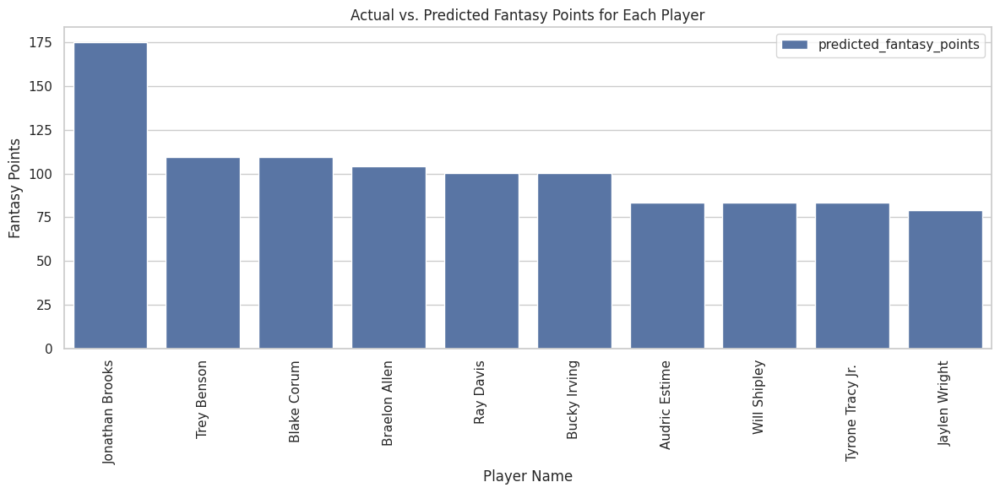

In [134]:
# Model to predict 2024 rookie rbs
train_rookie = rookie_rb_df[rookie_rb_df['season']<2024]
test_rookie = rookie_rb_df[rookie_rb_df['season']==2024]

train_ids_rookie = train_rookie[['player_id', 'player_name']]
test_ids_rookie = test_rookie[['player_id', 'player_name']]

train_X_rok = pd.get_dummies(train_rookie.drop(columns=['player_id','player_name',
                                                'season','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
train_y_rok = train_rookie['fantasy_points_ppr_next_season'].astype(float)
test_X_rok = pd.get_dummies(test_rookie.drop(columns=['player_id','player_name',
                                                'season','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
test_X_rok = test_X_rok.reindex(columns=train_X_rok.columns, fill_value=0)

# Most optimal parameters based on cross validation
vr = VotingRegressor(estimators=[
        ('lasso', Lasso(alpha=0.1)),
        ('gb', GradientBoostingRegressor(n_estimators=40, max_depth=2))
    ])

vr.fit(train_X_rok, train_y_rok)
pred_y = vr.predict(test_X_rok)

results = pd.DataFrame({
        'player_id': test_ids_rookie['player_id'],
        'player_name': test_ids_rookie['player_name'],
        'predicted_fantasy_points': pred_y
    })

results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
rookie_results = results.sort_values('predicted_fantasy_points', ascending=False)
top = rookie_results.head(10)

top_predictions_2024(top)

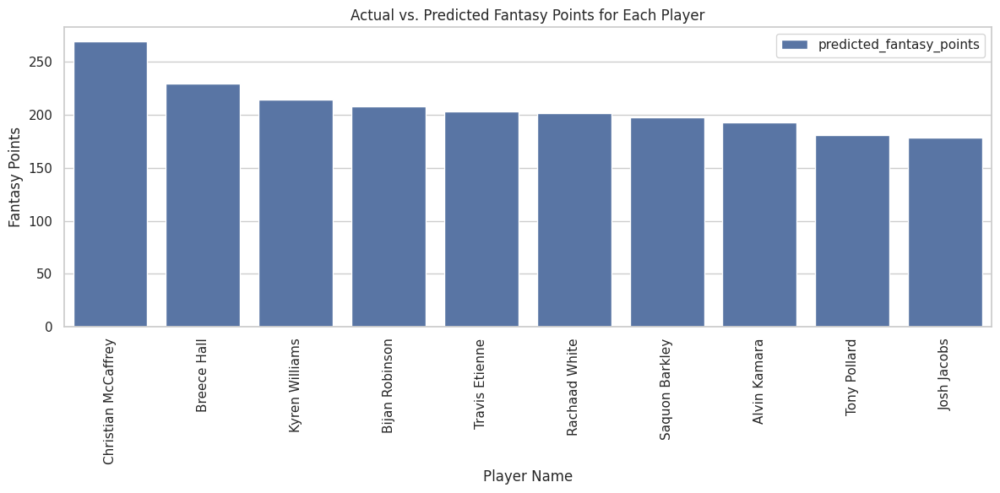

In [135]:
# Model to predict 2024 veteran rbs
train_rb = rb_df[(rb_df['season']!=2024)&(rb_df['year_in_league']>1)].dropna(axis = 0)
test_rb = rb_df[(rb_df['season']==2024)&(rb_df['year_in_league']>1)]

# Saving player_id and player_name before dropping them
train_ids_veteran = train_rb[['player_id', 'player_name']]
test_ids_veteran = test_rb[['player_id', 'player_name']]

train_X = pd.get_dummies(train_rb.drop(columns=['player_id','player_name','season','first_position_pick','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
train_y = train_rb['fantasy_points_ppr_next_season'].astype(float)
test_X = pd.get_dummies(test_rb.drop(columns=['player_id','player_name','season','first_position_pick','fantasy_points_ppr_next_season']),drop_first=True).astype(float)
test_X = test_X.reindex(columns=train_X.columns, fill_value=0)

# Most optimal parameters based on cross validation
vr = VotingRegressor(estimators=[
        ('lasso', Lasso(alpha=1)),
        ('xgb', xgb.XGBRegressor(n_estimators=13, max_depth=2)),
        ('gb', GradientBoostingRegressor(n_estimators=40, max_depth=2))
    ])

vr.fit(train_X, train_y)
pred_y = vr.predict(test_X)

results = pd.DataFrame({
        'player_id': test_ids_veteran['player_id'],
        'player_name': test_ids_veteran['player_name'],
        'predicted_fantasy_points': pred_y
    })

results['predicted_points_rank'] = results['predicted_fantasy_points'].rank(ascending=False)
veteran_results = results.sort_values('predicted_fantasy_points', ascending=False)
top = veteran_results.head(10)

top_predictions_2024(top)

In [136]:
# Display combined rb results
rb_results = pd.concat([rookie_results, veteran_results], ignore_index=True)

rb_results['predicted_points_rank'] = rb_results['predicted_fantasy_points'].rank(ascending=False)
rb_results = rb_results.sort_values('predicted_fantasy_points',ascending=False)

rb_results.sort_values('predicted_fantasy_points',ascending=False).head(60)

,player_id,player_name,predicted_fantasy_points,predicted_points_rank
14,00-0033280,Christian McCaffrey,268.834500,1.0
15,00-0038120,Breece Hall,228.924642,2.0
16,00-0037840,Kyren Williams,214.533366,3.0
17,00-0038542,Bijan Robinson,208.062209,4.0
18,00-0036973,Travis Etienne,202.738036,5.0
19,00-0037256,Rachaad White,201.059156,6.0
20,00-0034844,Saquon Barkley,197.625369,7.0
21,00-0033906,Alvin Kamara,192.550704,8.0
22,00-0035261,Tony Pollard,180.573108,9.0
23,00-0035700,Josh Jacobs,178.613705,10.0


# Save Results

In [139]:
# Merge all the 2024 predictions and apply it to df with all the 2024 player data
results_merge1 = pd.merge(qb_results,rb_results,how='outer')
results_merge2 = pd.merge(wr_results,te_results,how='outer')
results_merge3 = pd.merge(results_merge1,results_merge2,how='outer')
df_2024 = pd.merge(df_2024,results_merge3,on=['player_id','player_name'],how='left')

In [140]:
# Kept these columns to help me build Tableau visualization
df_2024 = df_2024[['player_id', 'player_name','team', 'position','new_team','fantasy_points_ppr','binned_draft_pick','year_in_league',
                    'predicted_fantasy_points','predicted_points_rank']]

In [141]:
# Download csv with results
df_2024.to_csv("player_predictions_2024.csv", index = False)
files.download("player_predictions_2024.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>